# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [214]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

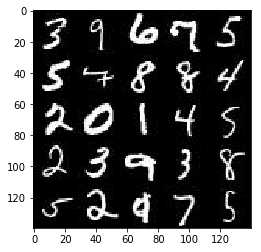

In [215]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

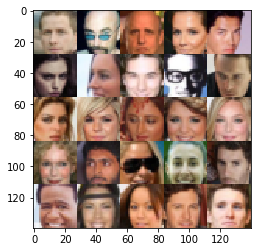

In [216]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [217]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [286]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_image = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name = "real_image")
    z_input = tf.placeholder(tf.float32, (None, z_dim), name="z_input")
    learning_rate = tf.placeholder(tf.float32, name="learning_rate")
    return real_image, z_input, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [302]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        
        alpha = 0.2
        
        #shape of image 28X28X1 in mnsit and 28X28X3 in case of celeb images
        x = tf.layers.conv2d(images, 64, 5, strides=2, padding="same")
        
        x1 = tf.layers.conv2d(x, 128, 5, strides=2, padding="same")
        x1 = tf.layers.batch_normalization(x1, training=True)
        x1 = tf.maximum(x1 * alpha, x1)
        
        x2 = tf.layers.conv2d(x1, 256, 5, strides=2, padding="same")
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(x2 * alpha, x2)
        
        shape = x2.get_shape().as_list()
        resshaped = tf.reshape(x2, (-1, shape[1] * shape[2] * shape[3]))
        logits = tf.layers.dense(resshaped, 1)
        output = tf.sigmoid(logits)
        return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [305]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=(not is_train)):
        alpha = 0.2
        x = tf.layers.dense(z, 7*7*256)
        reshaped = tf.reshape(x, (-1, 7, 7, 256))
        x1 = tf.layers.batch_normalization(reshaped, training=is_train)
        x1 = tf.maximum(x1 * alpha, x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides=2, padding="same")
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(x2 * alpha , x2)
        
#         x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding="same")
#         x3 = tf.layers.batch_normalization(x3, training=is_train)
#         x3 = tf.maximum(x3 * alpha, x3)
        
        logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 5, strides=2, padding="same")
        output = tf.tanh(logits)
        return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [306]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [307]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [308]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [309]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, lr = model_inputs( data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    samples, losses = [], []
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                batch_images = batch_images*2.0
                steps += 1
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                #optimize d_opt
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                #optimize g_opt
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, lr: learning_rate})
                
                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    
                    print("Epoch {}/{}...".format(epoch_i, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))
                    
                if steps % 100 == 0:
                    show_generator_output(sess,25, input_z, data_shape[3], data_image_mode)

        return losses, samples


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 0/5... Discriminator Loss: 2.8921... Generator Loss: 0.1726
Epoch 0/5... Discriminator Loss: 2.7275... Generator Loss: 0.1468
Epoch 0/5... Discriminator Loss: 2.0156... Generator Loss: 0.2159
Epoch 0/5... Discriminator Loss: 1.8430... Generator Loss: 0.3370
Epoch 0/5... Discriminator Loss: 1.6812... Generator Loss: 0.3140
Epoch 0/5... Discriminator Loss: 1.8759... Generator Loss: 0.2272
Epoch 0/5... Discriminator Loss: 1.5370... Generator Loss: 0.4659
Epoch 0/5... Discriminator Loss: 1.6254... Generator Loss: 1.0007
Epoch 0/5... Discriminator Loss: 1.5441... Generator Loss: 0.3451
Epoch 0/5... Discriminator Loss: 1.5144... Generator Loss: 0.4055


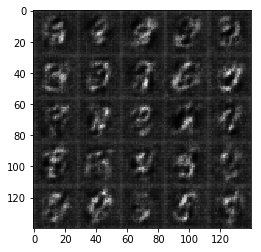

Epoch 0/5... Discriminator Loss: 1.3805... Generator Loss: 0.6088
Epoch 0/5... Discriminator Loss: 1.5011... Generator Loss: 1.0787
Epoch 0/5... Discriminator Loss: 1.3036... Generator Loss: 0.6984
Epoch 0/5... Discriminator Loss: 1.4278... Generator Loss: 0.3808
Epoch 0/5... Discriminator Loss: 1.2737... Generator Loss: 0.4931
Epoch 0/5... Discriminator Loss: 1.3180... Generator Loss: 0.7100
Epoch 0/5... Discriminator Loss: 1.2958... Generator Loss: 1.1347
Epoch 0/5... Discriminator Loss: 1.1967... Generator Loss: 1.0206
Epoch 0/5... Discriminator Loss: 1.2025... Generator Loss: 0.6659
Epoch 0/5... Discriminator Loss: 1.1857... Generator Loss: 1.2116


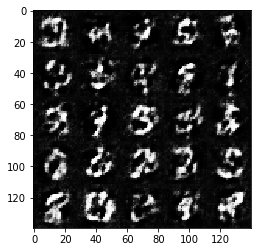

Epoch 0/5... Discriminator Loss: 1.3862... Generator Loss: 0.4172
Epoch 0/5... Discriminator Loss: 1.1090... Generator Loss: 0.6967
Epoch 0/5... Discriminator Loss: 1.3661... Generator Loss: 0.4000
Epoch 0/5... Discriminator Loss: 1.1844... Generator Loss: 0.5744
Epoch 0/5... Discriminator Loss: 1.0457... Generator Loss: 0.7745
Epoch 0/5... Discriminator Loss: 1.3399... Generator Loss: 0.4263
Epoch 0/5... Discriminator Loss: 1.2543... Generator Loss: 0.5012
Epoch 0/5... Discriminator Loss: 1.0209... Generator Loss: 0.7702
Epoch 0/5... Discriminator Loss: 1.0732... Generator Loss: 1.1665
Epoch 0/5... Discriminator Loss: 0.9991... Generator Loss: 0.8616


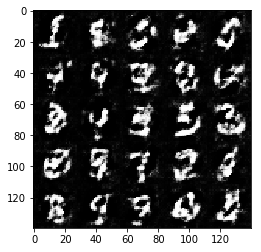

Epoch 0/5... Discriminator Loss: 1.4130... Generator Loss: 0.3624
Epoch 0/5... Discriminator Loss: 1.0845... Generator Loss: 0.6053
Epoch 0/5... Discriminator Loss: 1.3848... Generator Loss: 0.3822
Epoch 0/5... Discriminator Loss: 1.3526... Generator Loss: 0.4335
Epoch 0/5... Discriminator Loss: 1.4660... Generator Loss: 0.3735
Epoch 0/5... Discriminator Loss: 1.3093... Generator Loss: 0.4711
Epoch 0/5... Discriminator Loss: 1.2350... Generator Loss: 0.5385
Epoch 0/5... Discriminator Loss: 1.2443... Generator Loss: 0.5492
Epoch 0/5... Discriminator Loss: 1.1887... Generator Loss: 0.8724
Epoch 0/5... Discriminator Loss: 1.3300... Generator Loss: 0.4912


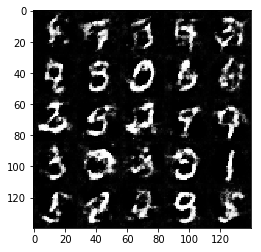

Epoch 0/5... Discriminator Loss: 1.2683... Generator Loss: 0.5382
Epoch 0/5... Discriminator Loss: 1.2955... Generator Loss: 0.6178
Epoch 0/5... Discriminator Loss: 1.3420... Generator Loss: 1.0332
Epoch 0/5... Discriminator Loss: 1.3028... Generator Loss: 0.5149
Epoch 0/5... Discriminator Loss: 1.4211... Generator Loss: 0.4369
Epoch 0/5... Discriminator Loss: 1.3041... Generator Loss: 0.9102
Epoch 0/5... Discriminator Loss: 1.4980... Generator Loss: 0.9957
Epoch 0/5... Discriminator Loss: 1.3353... Generator Loss: 0.5296
Epoch 0/5... Discriminator Loss: 1.1933... Generator Loss: 0.7697
Epoch 0/5... Discriminator Loss: 1.2931... Generator Loss: 0.5585


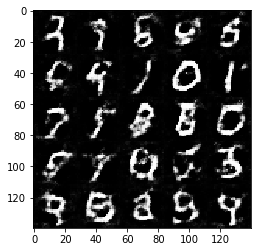

Epoch 0/5... Discriminator Loss: 1.1612... Generator Loss: 0.7534
Epoch 0/5... Discriminator Loss: 1.1851... Generator Loss: 0.7114
Epoch 0/5... Discriminator Loss: 1.3280... Generator Loss: 0.5405
Epoch 0/5... Discriminator Loss: 1.3932... Generator Loss: 1.1867
Epoch 0/5... Discriminator Loss: 1.3352... Generator Loss: 0.7294
Epoch 0/5... Discriminator Loss: 1.3012... Generator Loss: 0.9303
Epoch 0/5... Discriminator Loss: 1.3966... Generator Loss: 1.3318
Epoch 0/5... Discriminator Loss: 1.4019... Generator Loss: 0.4641
Epoch 0/5... Discriminator Loss: 1.1640... Generator Loss: 0.6907
Epoch 0/5... Discriminator Loss: 1.2713... Generator Loss: 0.9456


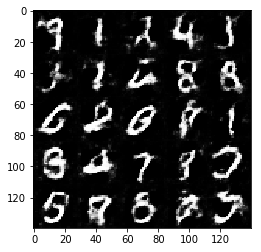

Epoch 0/5... Discriminator Loss: 1.5182... Generator Loss: 0.3599
Epoch 0/5... Discriminator Loss: 1.1682... Generator Loss: 0.8202
Epoch 0/5... Discriminator Loss: 1.2584... Generator Loss: 0.5966
Epoch 0/5... Discriminator Loss: 1.3637... Generator Loss: 0.4709
Epoch 0/5... Discriminator Loss: 1.3898... Generator Loss: 0.9694
Epoch 0/5... Discriminator Loss: 1.2095... Generator Loss: 0.7994
Epoch 0/5... Discriminator Loss: 1.2469... Generator Loss: 0.8271
Epoch 0/5... Discriminator Loss: 1.2751... Generator Loss: 0.5243
Epoch 0/5... Discriminator Loss: 1.2832... Generator Loss: 0.6743
Epoch 0/5... Discriminator Loss: 1.2598... Generator Loss: 0.5326


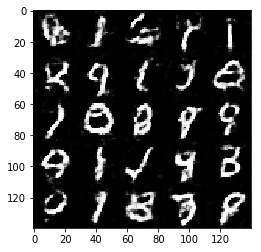

Epoch 0/5... Discriminator Loss: 1.2881... Generator Loss: 0.7086
Epoch 0/5... Discriminator Loss: 1.2408... Generator Loss: 0.7090
Epoch 0/5... Discriminator Loss: 1.4308... Generator Loss: 0.7510
Epoch 0/5... Discriminator Loss: 1.2458... Generator Loss: 0.6443
Epoch 0/5... Discriminator Loss: 1.5091... Generator Loss: 0.3434
Epoch 0/5... Discriminator Loss: 1.3063... Generator Loss: 0.7875
Epoch 0/5... Discriminator Loss: 1.2783... Generator Loss: 0.8132
Epoch 0/5... Discriminator Loss: 1.3054... Generator Loss: 0.7803
Epoch 0/5... Discriminator Loss: 1.2101... Generator Loss: 0.8793
Epoch 0/5... Discriminator Loss: 1.2945... Generator Loss: 0.7100


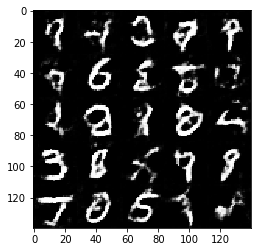

Epoch 0/5... Discriminator Loss: 1.2917... Generator Loss: 0.8261
Epoch 0/5... Discriminator Loss: 1.3459... Generator Loss: 0.6851
Epoch 0/5... Discriminator Loss: 1.3630... Generator Loss: 0.5686
Epoch 0/5... Discriminator Loss: 1.3803... Generator Loss: 0.4895
Epoch 0/5... Discriminator Loss: 1.2296... Generator Loss: 0.7821
Epoch 0/5... Discriminator Loss: 1.2015... Generator Loss: 0.7642
Epoch 0/5... Discriminator Loss: 1.3906... Generator Loss: 1.1224
Epoch 0/5... Discriminator Loss: 1.1614... Generator Loss: 0.6689
Epoch 0/5... Discriminator Loss: 1.3582... Generator Loss: 0.6075
Epoch 0/5... Discriminator Loss: 1.3340... Generator Loss: 0.5498


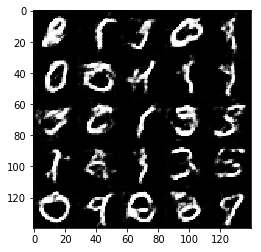

Epoch 0/5... Discriminator Loss: 1.4100... Generator Loss: 0.4176
Epoch 0/5... Discriminator Loss: 1.4764... Generator Loss: 0.3566
Epoch 0/5... Discriminator Loss: 1.3289... Generator Loss: 0.4525
Epoch 1/5... Discriminator Loss: 1.3157... Generator Loss: 0.6476
Epoch 1/5... Discriminator Loss: 1.2387... Generator Loss: 0.9488
Epoch 1/5... Discriminator Loss: 1.3467... Generator Loss: 0.5737
Epoch 1/5... Discriminator Loss: 1.1921... Generator Loss: 0.7834
Epoch 1/5... Discriminator Loss: 1.2294... Generator Loss: 0.6575
Epoch 1/5... Discriminator Loss: 1.3561... Generator Loss: 0.7652
Epoch 1/5... Discriminator Loss: 1.3073... Generator Loss: 0.4946


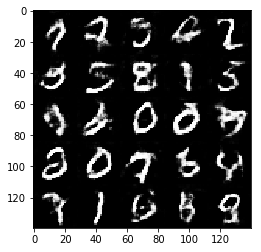

Epoch 1/5... Discriminator Loss: 1.2577... Generator Loss: 0.9108
Epoch 1/5... Discriminator Loss: 1.2981... Generator Loss: 0.5456
Epoch 1/5... Discriminator Loss: 1.3571... Generator Loss: 0.8019
Epoch 1/5... Discriminator Loss: 1.2749... Generator Loss: 0.5646
Epoch 1/5... Discriminator Loss: 1.3151... Generator Loss: 1.0795
Epoch 1/5... Discriminator Loss: 1.4088... Generator Loss: 0.9873
Epoch 1/5... Discriminator Loss: 1.3828... Generator Loss: 0.6227
Epoch 1/5... Discriminator Loss: 1.2334... Generator Loss: 0.7699
Epoch 1/5... Discriminator Loss: 1.4007... Generator Loss: 0.4109
Epoch 1/5... Discriminator Loss: 1.4043... Generator Loss: 0.4718


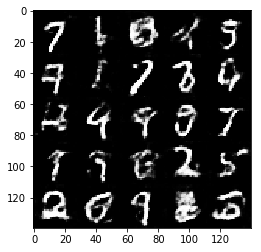

Epoch 1/5... Discriminator Loss: 1.2690... Generator Loss: 0.5912
Epoch 1/5... Discriminator Loss: 1.5684... Generator Loss: 0.3295
Epoch 1/5... Discriminator Loss: 1.3509... Generator Loss: 0.5218
Epoch 1/5... Discriminator Loss: 1.2279... Generator Loss: 0.6484
Epoch 1/5... Discriminator Loss: 1.3737... Generator Loss: 0.4593
Epoch 1/5... Discriminator Loss: 1.3269... Generator Loss: 0.5550
Epoch 1/5... Discriminator Loss: 1.3092... Generator Loss: 0.5415
Epoch 1/5... Discriminator Loss: 1.3084... Generator Loss: 0.4940
Epoch 1/5... Discriminator Loss: 1.3691... Generator Loss: 0.5522
Epoch 1/5... Discriminator Loss: 1.2623... Generator Loss: 0.9975


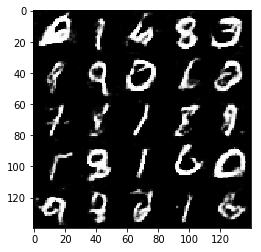

Epoch 1/5... Discriminator Loss: 1.3559... Generator Loss: 0.4289
Epoch 1/5... Discriminator Loss: 1.5474... Generator Loss: 0.3432
Epoch 1/5... Discriminator Loss: 1.3246... Generator Loss: 0.8120
Epoch 1/5... Discriminator Loss: 1.3822... Generator Loss: 0.4676
Epoch 1/5... Discriminator Loss: 1.3733... Generator Loss: 0.7139
Epoch 1/5... Discriminator Loss: 1.2129... Generator Loss: 0.8095
Epoch 1/5... Discriminator Loss: 1.2909... Generator Loss: 0.7714
Epoch 1/5... Discriminator Loss: 1.3112... Generator Loss: 0.5892
Epoch 1/5... Discriminator Loss: 1.2042... Generator Loss: 0.6552
Epoch 1/5... Discriminator Loss: 1.3814... Generator Loss: 0.4282


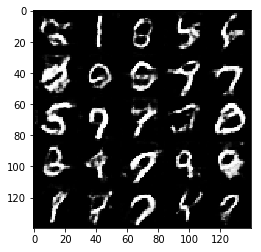

Epoch 1/5... Discriminator Loss: 1.5539... Generator Loss: 0.3445
Epoch 1/5... Discriminator Loss: 1.2690... Generator Loss: 0.7422
Epoch 1/5... Discriminator Loss: 1.2142... Generator Loss: 0.7286
Epoch 1/5... Discriminator Loss: 1.3416... Generator Loss: 0.6010
Epoch 1/5... Discriminator Loss: 1.2845... Generator Loss: 0.5581
Epoch 1/5... Discriminator Loss: 1.2650... Generator Loss: 0.6079
Epoch 1/5... Discriminator Loss: 1.3486... Generator Loss: 0.9906
Epoch 1/5... Discriminator Loss: 1.2375... Generator Loss: 0.7649
Epoch 1/5... Discriminator Loss: 1.4896... Generator Loss: 0.3776
Epoch 1/5... Discriminator Loss: 1.2407... Generator Loss: 0.6891


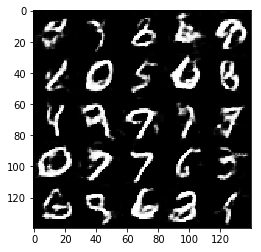

Epoch 1/5... Discriminator Loss: 1.1942... Generator Loss: 0.6124
Epoch 1/5... Discriminator Loss: 1.3177... Generator Loss: 0.7515
Epoch 1/5... Discriminator Loss: 1.3185... Generator Loss: 0.7017
Epoch 1/5... Discriminator Loss: 1.1752... Generator Loss: 0.8070
Epoch 1/5... Discriminator Loss: 1.2128... Generator Loss: 0.6682
Epoch 1/5... Discriminator Loss: 1.3529... Generator Loss: 0.5309
Epoch 1/5... Discriminator Loss: 1.2691... Generator Loss: 0.8972
Epoch 1/5... Discriminator Loss: 1.2807... Generator Loss: 0.5931
Epoch 1/5... Discriminator Loss: 1.3315... Generator Loss: 0.4868
Epoch 1/5... Discriminator Loss: 1.1516... Generator Loss: 0.9552


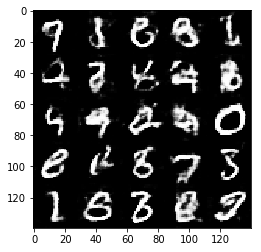

Epoch 1/5... Discriminator Loss: 1.2222... Generator Loss: 0.5988
Epoch 1/5... Discriminator Loss: 1.3401... Generator Loss: 0.8545
Epoch 1/5... Discriminator Loss: 1.3296... Generator Loss: 0.5252
Epoch 1/5... Discriminator Loss: 1.4012... Generator Loss: 0.4571
Epoch 1/5... Discriminator Loss: 1.2448... Generator Loss: 0.9686
Epoch 1/5... Discriminator Loss: 1.2855... Generator Loss: 0.5489
Epoch 1/5... Discriminator Loss: 1.4241... Generator Loss: 1.1578
Epoch 1/5... Discriminator Loss: 1.2600... Generator Loss: 0.5907
Epoch 1/5... Discriminator Loss: 1.4485... Generator Loss: 0.4015
Epoch 1/5... Discriminator Loss: 1.4786... Generator Loss: 0.3881


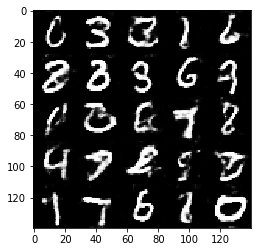

Epoch 1/5... Discriminator Loss: 1.2667... Generator Loss: 0.6239
Epoch 1/5... Discriminator Loss: 1.4313... Generator Loss: 0.4701
Epoch 1/5... Discriminator Loss: 1.1668... Generator Loss: 0.9719
Epoch 1/5... Discriminator Loss: 1.2869... Generator Loss: 0.5241
Epoch 1/5... Discriminator Loss: 1.1753... Generator Loss: 0.8323
Epoch 1/5... Discriminator Loss: 1.5642... Generator Loss: 0.3230
Epoch 1/5... Discriminator Loss: 1.3746... Generator Loss: 0.5034
Epoch 1/5... Discriminator Loss: 1.4274... Generator Loss: 0.4202
Epoch 1/5... Discriminator Loss: 1.4644... Generator Loss: 0.7430
Epoch 1/5... Discriminator Loss: 1.2626... Generator Loss: 0.8711


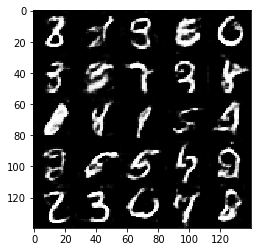

Epoch 1/5... Discriminator Loss: 1.3718... Generator Loss: 0.4418
Epoch 1/5... Discriminator Loss: 1.4094... Generator Loss: 0.9302
Epoch 1/5... Discriminator Loss: 1.2703... Generator Loss: 0.5600
Epoch 1/5... Discriminator Loss: 1.3911... Generator Loss: 0.4440
Epoch 1/5... Discriminator Loss: 1.4042... Generator Loss: 0.4478
Epoch 1/5... Discriminator Loss: 1.4409... Generator Loss: 0.4526
Epoch 1/5... Discriminator Loss: 1.3035... Generator Loss: 0.6816
Epoch 1/5... Discriminator Loss: 1.4315... Generator Loss: 0.4463
Epoch 1/5... Discriminator Loss: 1.2936... Generator Loss: 0.5940
Epoch 1/5... Discriminator Loss: 1.3267... Generator Loss: 0.5253


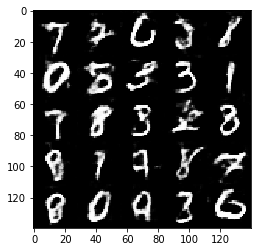

Epoch 1/5... Discriminator Loss: 1.3344... Generator Loss: 0.4955
Epoch 1/5... Discriminator Loss: 1.3347... Generator Loss: 0.5289
Epoch 1/5... Discriminator Loss: 1.5812... Generator Loss: 0.2931
Epoch 1/5... Discriminator Loss: 1.2085... Generator Loss: 0.6328
Epoch 1/5... Discriminator Loss: 1.2177... Generator Loss: 0.6244
Epoch 1/5... Discriminator Loss: 1.3364... Generator Loss: 0.5694
Epoch 1/5... Discriminator Loss: 1.4567... Generator Loss: 0.3844
Epoch 2/5... Discriminator Loss: 1.4168... Generator Loss: 0.4189
Epoch 2/5... Discriminator Loss: 1.3145... Generator Loss: 0.5358
Epoch 2/5... Discriminator Loss: 1.2720... Generator Loss: 0.7189


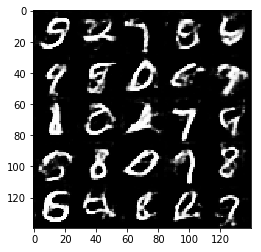

Epoch 2/5... Discriminator Loss: 1.3498... Generator Loss: 0.5375
Epoch 2/5... Discriminator Loss: 1.2002... Generator Loss: 0.8542
Epoch 2/5... Discriminator Loss: 1.2500... Generator Loss: 0.7144
Epoch 2/5... Discriminator Loss: 1.4457... Generator Loss: 0.9778
Epoch 2/5... Discriminator Loss: 1.1827... Generator Loss: 0.7949
Epoch 2/5... Discriminator Loss: 1.3276... Generator Loss: 0.8693
Epoch 2/5... Discriminator Loss: 1.4250... Generator Loss: 0.4247
Epoch 2/5... Discriminator Loss: 1.5233... Generator Loss: 0.3344
Epoch 2/5... Discriminator Loss: 1.3809... Generator Loss: 0.4223
Epoch 2/5... Discriminator Loss: 1.3871... Generator Loss: 0.4791


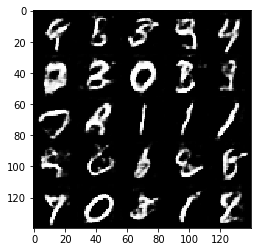

Epoch 2/5... Discriminator Loss: 1.2718... Generator Loss: 0.8439
Epoch 2/5... Discriminator Loss: 1.2577... Generator Loss: 0.7130
Epoch 2/5... Discriminator Loss: 1.3918... Generator Loss: 0.4767
Epoch 2/5... Discriminator Loss: 1.3544... Generator Loss: 1.0096
Epoch 2/5... Discriminator Loss: 1.3177... Generator Loss: 0.4483
Epoch 2/5... Discriminator Loss: 1.3002... Generator Loss: 0.6580
Epoch 2/5... Discriminator Loss: 1.3312... Generator Loss: 0.5350
Epoch 2/5... Discriminator Loss: 1.3304... Generator Loss: 0.5088
Epoch 2/5... Discriminator Loss: 1.1848... Generator Loss: 0.8646
Epoch 2/5... Discriminator Loss: 1.6140... Generator Loss: 0.3492


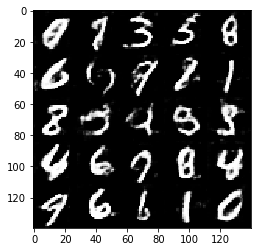

Epoch 2/5... Discriminator Loss: 1.3936... Generator Loss: 0.4181
Epoch 2/5... Discriminator Loss: 1.2900... Generator Loss: 0.4567
Epoch 2/5... Discriminator Loss: 1.3179... Generator Loss: 0.5308
Epoch 2/5... Discriminator Loss: 1.6072... Generator Loss: 0.3111
Epoch 2/5... Discriminator Loss: 1.3709... Generator Loss: 0.5224
Epoch 2/5... Discriminator Loss: 1.2765... Generator Loss: 0.9276
Epoch 2/5... Discriminator Loss: 1.1509... Generator Loss: 0.7342
Epoch 2/5... Discriminator Loss: 1.3447... Generator Loss: 0.4654
Epoch 2/5... Discriminator Loss: 1.6440... Generator Loss: 0.2936
Epoch 2/5... Discriminator Loss: 1.2668... Generator Loss: 0.5200


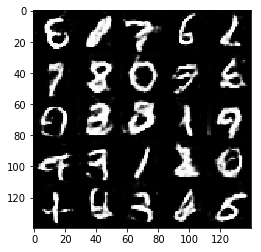

Epoch 2/5... Discriminator Loss: 1.3000... Generator Loss: 0.5087
Epoch 2/5... Discriminator Loss: 1.4240... Generator Loss: 0.5001
Epoch 2/5... Discriminator Loss: 1.4100... Generator Loss: 0.4050
Epoch 2/5... Discriminator Loss: 1.3506... Generator Loss: 0.6122
Epoch 2/5... Discriminator Loss: 1.3664... Generator Loss: 0.4859
Epoch 2/5... Discriminator Loss: 1.3551... Generator Loss: 0.5382
Epoch 2/5... Discriminator Loss: 1.2473... Generator Loss: 0.6740
Epoch 2/5... Discriminator Loss: 1.6898... Generator Loss: 0.2662
Epoch 2/5... Discriminator Loss: 1.2968... Generator Loss: 0.5755
Epoch 2/5... Discriminator Loss: 1.5097... Generator Loss: 0.3665


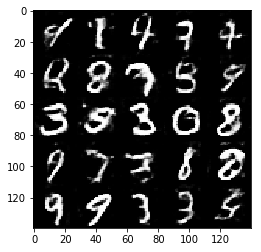

Epoch 2/5... Discriminator Loss: 1.3255... Generator Loss: 0.5581
Epoch 2/5... Discriminator Loss: 1.4802... Generator Loss: 0.3594
Epoch 2/5... Discriminator Loss: 1.3397... Generator Loss: 0.4842
Epoch 2/5... Discriminator Loss: 1.3244... Generator Loss: 0.4964
Epoch 2/5... Discriminator Loss: 1.2466... Generator Loss: 0.6877
Epoch 2/5... Discriminator Loss: 1.3338... Generator Loss: 0.5016
Epoch 2/5... Discriminator Loss: 1.3407... Generator Loss: 0.6004
Epoch 2/5... Discriminator Loss: 1.5994... Generator Loss: 0.3040
Epoch 2/5... Discriminator Loss: 1.2907... Generator Loss: 0.7644
Epoch 2/5... Discriminator Loss: 1.3544... Generator Loss: 0.6215


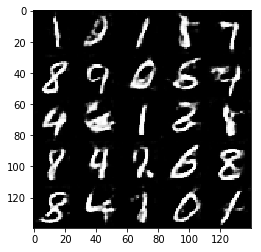

Epoch 2/5... Discriminator Loss: 1.3177... Generator Loss: 0.4221
Epoch 2/5... Discriminator Loss: 1.4155... Generator Loss: 0.4042
Epoch 2/5... Discriminator Loss: 1.3296... Generator Loss: 0.8727
Epoch 2/5... Discriminator Loss: 1.4963... Generator Loss: 0.3666
Epoch 2/5... Discriminator Loss: 1.2233... Generator Loss: 0.6337
Epoch 2/5... Discriminator Loss: 1.3030... Generator Loss: 0.7626
Epoch 2/5... Discriminator Loss: 1.3782... Generator Loss: 0.4445
Epoch 2/5... Discriminator Loss: 1.0816... Generator Loss: 0.7860
Epoch 2/5... Discriminator Loss: 1.3058... Generator Loss: 0.4939
Epoch 2/5... Discriminator Loss: 1.3241... Generator Loss: 0.4881


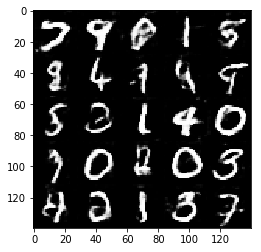

Epoch 2/5... Discriminator Loss: 1.5922... Generator Loss: 0.3080
Epoch 2/5... Discriminator Loss: 1.2240... Generator Loss: 0.7296
Epoch 2/5... Discriminator Loss: 1.5466... Generator Loss: 0.3172
Epoch 2/5... Discriminator Loss: 1.3344... Generator Loss: 0.5658
Epoch 2/5... Discriminator Loss: 1.2317... Generator Loss: 0.8315
Epoch 2/5... Discriminator Loss: 1.3260... Generator Loss: 0.8110
Epoch 2/5... Discriminator Loss: 1.3930... Generator Loss: 0.4093
Epoch 2/5... Discriminator Loss: 1.4372... Generator Loss: 0.3523
Epoch 2/5... Discriminator Loss: 1.4081... Generator Loss: 0.4231
Epoch 2/5... Discriminator Loss: 1.4654... Generator Loss: 0.3929


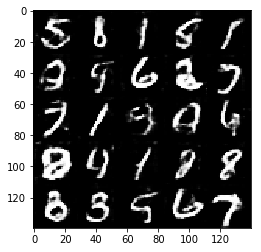

Epoch 2/5... Discriminator Loss: 1.3406... Generator Loss: 0.6024
Epoch 2/5... Discriminator Loss: 1.3202... Generator Loss: 0.5635
Epoch 2/5... Discriminator Loss: 1.5306... Generator Loss: 0.3416
Epoch 2/5... Discriminator Loss: 1.3614... Generator Loss: 0.5567
Epoch 2/5... Discriminator Loss: 1.3712... Generator Loss: 0.4299
Epoch 2/5... Discriminator Loss: 1.6334... Generator Loss: 1.0870
Epoch 2/5... Discriminator Loss: 1.3013... Generator Loss: 0.4740
Epoch 2/5... Discriminator Loss: 1.2786... Generator Loss: 0.9915
Epoch 2/5... Discriminator Loss: 1.2067... Generator Loss: 0.6436
Epoch 2/5... Discriminator Loss: 1.2610... Generator Loss: 0.5542


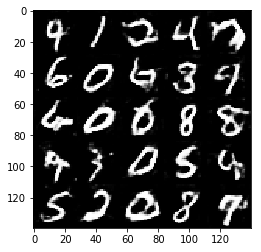

Epoch 2/5... Discriminator Loss: 1.4559... Generator Loss: 0.3905
Epoch 2/5... Discriminator Loss: 1.1973... Generator Loss: 0.7881
Epoch 2/5... Discriminator Loss: 1.2551... Generator Loss: 0.5436
Epoch 2/5... Discriminator Loss: 1.4182... Generator Loss: 0.4050
Epoch 2/5... Discriminator Loss: 1.4516... Generator Loss: 0.3493
Epoch 2/5... Discriminator Loss: 1.6738... Generator Loss: 1.1334
Epoch 2/5... Discriminator Loss: 1.2182... Generator Loss: 0.6709
Epoch 2/5... Discriminator Loss: 1.5788... Generator Loss: 0.3054
Epoch 2/5... Discriminator Loss: 1.3338... Generator Loss: 0.6197
Epoch 2/5... Discriminator Loss: 1.3104... Generator Loss: 0.5149


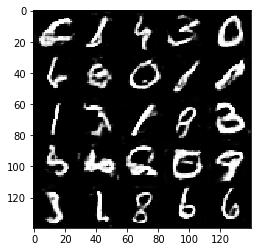

Epoch 2/5... Discriminator Loss: 1.3088... Generator Loss: 0.7347
Epoch 3/5... Discriminator Loss: 1.2551... Generator Loss: 0.4923
Epoch 3/5... Discriminator Loss: 1.5142... Generator Loss: 0.3665
Epoch 3/5... Discriminator Loss: 1.1768... Generator Loss: 0.6938
Epoch 3/5... Discriminator Loss: 1.3200... Generator Loss: 0.4727
Epoch 3/5... Discriminator Loss: 1.3097... Generator Loss: 0.5367
Epoch 3/5... Discriminator Loss: 1.3567... Generator Loss: 1.1271
Epoch 3/5... Discriminator Loss: 1.2502... Generator Loss: 0.5512
Epoch 3/5... Discriminator Loss: 1.4269... Generator Loss: 0.4357
Epoch 3/5... Discriminator Loss: 1.4242... Generator Loss: 0.3998


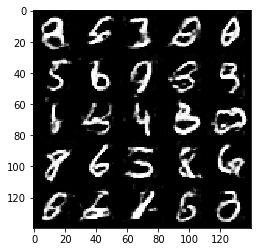

Epoch 3/5... Discriminator Loss: 1.2180... Generator Loss: 0.8754
Epoch 3/5... Discriminator Loss: 1.3173... Generator Loss: 0.9299
Epoch 3/5... Discriminator Loss: 1.3038... Generator Loss: 0.7896
Epoch 3/5... Discriminator Loss: 1.3824... Generator Loss: 0.5583
Epoch 3/5... Discriminator Loss: 1.3727... Generator Loss: 0.4196
Epoch 3/5... Discriminator Loss: 1.4359... Generator Loss: 0.4939
Epoch 3/5... Discriminator Loss: 1.8055... Generator Loss: 0.2389
Epoch 3/5... Discriminator Loss: 1.2792... Generator Loss: 0.6848
Epoch 3/5... Discriminator Loss: 1.3970... Generator Loss: 0.3858
Epoch 3/5... Discriminator Loss: 1.3069... Generator Loss: 0.6320


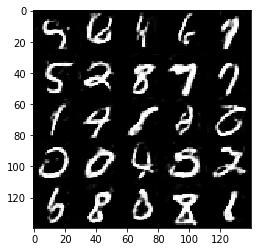

Epoch 3/5... Discriminator Loss: 1.2063... Generator Loss: 0.8541
Epoch 3/5... Discriminator Loss: 1.2764... Generator Loss: 0.4873
Epoch 3/5... Discriminator Loss: 1.2791... Generator Loss: 0.9203
Epoch 3/5... Discriminator Loss: 1.3084... Generator Loss: 0.9664
Epoch 3/5... Discriminator Loss: 1.2779... Generator Loss: 0.8923
Epoch 3/5... Discriminator Loss: 1.4058... Generator Loss: 0.4772
Epoch 3/5... Discriminator Loss: 1.3952... Generator Loss: 1.0149
Epoch 3/5... Discriminator Loss: 1.2379... Generator Loss: 0.4845
Epoch 3/5... Discriminator Loss: 1.2668... Generator Loss: 0.6206
Epoch 3/5... Discriminator Loss: 1.2079... Generator Loss: 0.6608


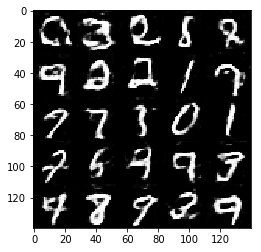

Epoch 3/5... Discriminator Loss: 1.3752... Generator Loss: 0.9853
Epoch 3/5... Discriminator Loss: 1.3230... Generator Loss: 0.4537
Epoch 3/5... Discriminator Loss: 1.2783... Generator Loss: 0.8870
Epoch 3/5... Discriminator Loss: 1.2058... Generator Loss: 1.0281
Epoch 3/5... Discriminator Loss: 1.5125... Generator Loss: 0.3469
Epoch 3/5... Discriminator Loss: 1.3067... Generator Loss: 0.4665
Epoch 3/5... Discriminator Loss: 1.2994... Generator Loss: 0.6904
Epoch 3/5... Discriminator Loss: 1.3675... Generator Loss: 0.9125
Epoch 3/5... Discriminator Loss: 1.1606... Generator Loss: 0.9365
Epoch 3/5... Discriminator Loss: 1.2291... Generator Loss: 0.6097


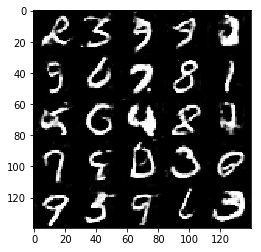

Epoch 3/5... Discriminator Loss: 1.3984... Generator Loss: 1.1606
Epoch 3/5... Discriminator Loss: 1.2532... Generator Loss: 0.8139
Epoch 3/5... Discriminator Loss: 1.1536... Generator Loss: 0.8436
Epoch 3/5... Discriminator Loss: 1.1872... Generator Loss: 0.9603
Epoch 3/5... Discriminator Loss: 1.3540... Generator Loss: 0.4486
Epoch 3/5... Discriminator Loss: 1.3132... Generator Loss: 0.4540
Epoch 3/5... Discriminator Loss: 1.2833... Generator Loss: 0.7535
Epoch 3/5... Discriminator Loss: 1.5660... Generator Loss: 0.2951
Epoch 3/5... Discriminator Loss: 1.5058... Generator Loss: 0.3247
Epoch 3/5... Discriminator Loss: 1.4057... Generator Loss: 0.4170


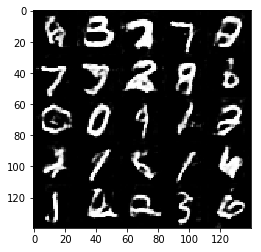

Epoch 3/5... Discriminator Loss: 1.2991... Generator Loss: 0.5373
Epoch 3/5... Discriminator Loss: 1.9947... Generator Loss: 1.2381
Epoch 3/5... Discriminator Loss: 1.2767... Generator Loss: 0.5335
Epoch 3/5... Discriminator Loss: 1.2817... Generator Loss: 0.5236
Epoch 3/5... Discriminator Loss: 1.2285... Generator Loss: 0.5733
Epoch 3/5... Discriminator Loss: 1.2085... Generator Loss: 0.6213
Epoch 3/5... Discriminator Loss: 1.6703... Generator Loss: 0.2754
Epoch 3/5... Discriminator Loss: 1.6363... Generator Loss: 0.3009
Epoch 3/5... Discriminator Loss: 1.2086... Generator Loss: 0.7375
Epoch 3/5... Discriminator Loss: 1.2043... Generator Loss: 0.6377


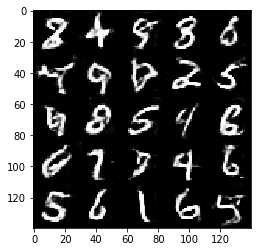

Epoch 3/5... Discriminator Loss: 1.2766... Generator Loss: 0.5845
Epoch 3/5... Discriminator Loss: 1.3120... Generator Loss: 0.4419
Epoch 3/5... Discriminator Loss: 1.2891... Generator Loss: 0.5269
Epoch 3/5... Discriminator Loss: 1.2222... Generator Loss: 0.7073
Epoch 3/5... Discriminator Loss: 1.4786... Generator Loss: 1.4741
Epoch 3/5... Discriminator Loss: 1.3738... Generator Loss: 0.4230
Epoch 3/5... Discriminator Loss: 1.2090... Generator Loss: 0.7724
Epoch 3/5... Discriminator Loss: 1.3137... Generator Loss: 0.4745
Epoch 3/5... Discriminator Loss: 1.1805... Generator Loss: 0.7829
Epoch 3/5... Discriminator Loss: 1.3346... Generator Loss: 0.7655


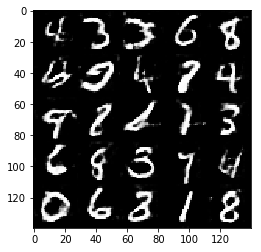

Epoch 3/5... Discriminator Loss: 1.1821... Generator Loss: 0.7786
Epoch 3/5... Discriminator Loss: 1.2307... Generator Loss: 0.9657
Epoch 3/5... Discriminator Loss: 1.4087... Generator Loss: 0.3924
Epoch 3/5... Discriminator Loss: 1.4727... Generator Loss: 0.3729
Epoch 3/5... Discriminator Loss: 1.3466... Generator Loss: 0.4669
Epoch 3/5... Discriminator Loss: 1.2398... Generator Loss: 1.1126
Epoch 3/5... Discriminator Loss: 1.4796... Generator Loss: 0.3488
Epoch 3/5... Discriminator Loss: 1.3008... Generator Loss: 0.5837
Epoch 3/5... Discriminator Loss: 1.5022... Generator Loss: 0.3452
Epoch 3/5... Discriminator Loss: 1.1930... Generator Loss: 0.8726


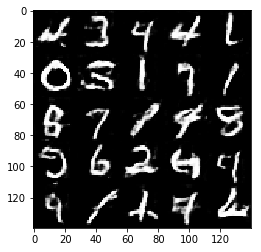

Epoch 3/5... Discriminator Loss: 1.2249... Generator Loss: 0.6233
Epoch 3/5... Discriminator Loss: 1.3448... Generator Loss: 0.4892
Epoch 3/5... Discriminator Loss: 1.3521... Generator Loss: 1.0220
Epoch 3/5... Discriminator Loss: 1.2921... Generator Loss: 0.5837
Epoch 3/5... Discriminator Loss: 1.2629... Generator Loss: 0.9019
Epoch 3/5... Discriminator Loss: 1.1910... Generator Loss: 0.6626
Epoch 3/5... Discriminator Loss: 1.3920... Generator Loss: 0.4049
Epoch 3/5... Discriminator Loss: 1.3640... Generator Loss: 0.5228
Epoch 3/5... Discriminator Loss: 1.2506... Generator Loss: 1.0771
Epoch 3/5... Discriminator Loss: 1.2466... Generator Loss: 0.5196


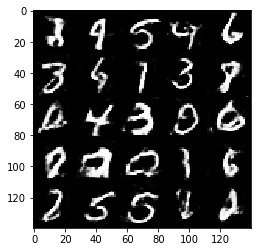

Epoch 3/5... Discriminator Loss: 1.1149... Generator Loss: 0.6472
Epoch 3/5... Discriminator Loss: 1.9496... Generator Loss: 1.7365
Epoch 3/5... Discriminator Loss: 1.1595... Generator Loss: 0.6123
Epoch 3/5... Discriminator Loss: 1.1662... Generator Loss: 0.7617
Epoch 4/5... Discriminator Loss: 1.4193... Generator Loss: 1.2421
Epoch 4/5... Discriminator Loss: 1.3304... Generator Loss: 0.4343
Epoch 4/5... Discriminator Loss: 1.2018... Generator Loss: 1.1191
Epoch 4/5... Discriminator Loss: 1.4659... Generator Loss: 0.4112
Epoch 4/5... Discriminator Loss: 1.2078... Generator Loss: 0.6301
Epoch 4/5... Discriminator Loss: 1.4224... Generator Loss: 0.3927


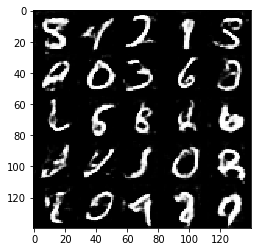

Epoch 4/5... Discriminator Loss: 1.3748... Generator Loss: 0.4286
Epoch 4/5... Discriminator Loss: 1.4655... Generator Loss: 0.3393
Epoch 4/5... Discriminator Loss: 1.3540... Generator Loss: 0.5599
Epoch 4/5... Discriminator Loss: 1.3269... Generator Loss: 0.4141
Epoch 4/5... Discriminator Loss: 1.4167... Generator Loss: 0.3666
Epoch 4/5... Discriminator Loss: 1.3856... Generator Loss: 0.4132
Epoch 4/5... Discriminator Loss: 1.3499... Generator Loss: 0.4623
Epoch 4/5... Discriminator Loss: 1.3446... Generator Loss: 0.4350
Epoch 4/5... Discriminator Loss: 1.2085... Generator Loss: 0.6888
Epoch 4/5... Discriminator Loss: 1.1429... Generator Loss: 0.8426


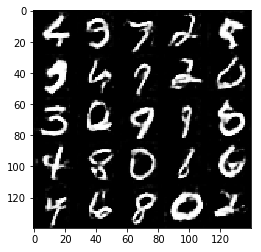

Epoch 4/5... Discriminator Loss: 1.2020... Generator Loss: 0.7253
Epoch 4/5... Discriminator Loss: 1.2162... Generator Loss: 0.5398
Epoch 4/5... Discriminator Loss: 1.0673... Generator Loss: 0.7192
Epoch 4/5... Discriminator Loss: 1.2267... Generator Loss: 0.6373
Epoch 4/5... Discriminator Loss: 1.7967... Generator Loss: 0.2814
Epoch 4/5... Discriminator Loss: 1.2928... Generator Loss: 0.6126
Epoch 4/5... Discriminator Loss: 1.4841... Generator Loss: 0.3567
Epoch 4/5... Discriminator Loss: 1.4826... Generator Loss: 0.3448
Epoch 4/5... Discriminator Loss: 1.2015... Generator Loss: 0.5754
Epoch 4/5... Discriminator Loss: 1.3709... Generator Loss: 0.4078


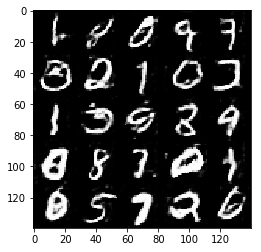

Epoch 4/5... Discriminator Loss: 1.5077... Generator Loss: 0.3282
Epoch 4/5... Discriminator Loss: 1.4096... Generator Loss: 0.3575
Epoch 4/5... Discriminator Loss: 1.1615... Generator Loss: 0.6039
Epoch 4/5... Discriminator Loss: 1.1366... Generator Loss: 0.7630
Epoch 4/5... Discriminator Loss: 1.4263... Generator Loss: 0.3593
Epoch 4/5... Discriminator Loss: 1.1967... Generator Loss: 0.7079
Epoch 4/5... Discriminator Loss: 1.1595... Generator Loss: 0.6665
Epoch 4/5... Discriminator Loss: 1.6430... Generator Loss: 0.2781
Epoch 4/5... Discriminator Loss: 1.4413... Generator Loss: 0.3742
Epoch 4/5... Discriminator Loss: 1.5209... Generator Loss: 0.3578


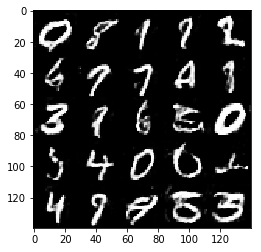

Epoch 4/5... Discriminator Loss: 1.1034... Generator Loss: 0.8535
Epoch 4/5... Discriminator Loss: 1.1401... Generator Loss: 0.5960
Epoch 4/5... Discriminator Loss: 1.2552... Generator Loss: 0.6616
Epoch 4/5... Discriminator Loss: 1.2952... Generator Loss: 0.5149
Epoch 4/5... Discriminator Loss: 1.7073... Generator Loss: 0.2415
Epoch 4/5... Discriminator Loss: 1.0688... Generator Loss: 0.8209
Epoch 4/5... Discriminator Loss: 1.3049... Generator Loss: 0.4340
Epoch 4/5... Discriminator Loss: 1.2172... Generator Loss: 0.6036
Epoch 4/5... Discriminator Loss: 1.2731... Generator Loss: 0.5465
Epoch 4/5... Discriminator Loss: 1.5349... Generator Loss: 0.3401


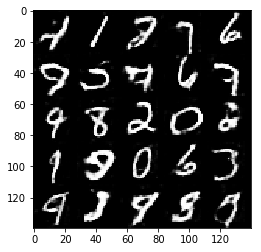

Epoch 4/5... Discriminator Loss: 1.1954... Generator Loss: 0.6202
Epoch 4/5... Discriminator Loss: 1.1577... Generator Loss: 0.7806
Epoch 4/5... Discriminator Loss: 1.2217... Generator Loss: 0.6202
Epoch 4/5... Discriminator Loss: 1.6787... Generator Loss: 0.2885
Epoch 4/5... Discriminator Loss: 1.3308... Generator Loss: 0.5280
Epoch 4/5... Discriminator Loss: 1.2163... Generator Loss: 0.4955
Epoch 4/5... Discriminator Loss: 1.3999... Generator Loss: 0.5655
Epoch 4/5... Discriminator Loss: 1.2950... Generator Loss: 0.4811
Epoch 4/5... Discriminator Loss: 1.5614... Generator Loss: 0.2889
Epoch 4/5... Discriminator Loss: 1.1549... Generator Loss: 0.6321


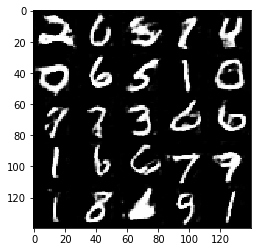

Epoch 4/5... Discriminator Loss: 1.3154... Generator Loss: 0.5355
Epoch 4/5... Discriminator Loss: 1.3116... Generator Loss: 0.5415
Epoch 4/5... Discriminator Loss: 1.4566... Generator Loss: 0.3698
Epoch 4/5... Discriminator Loss: 1.3467... Generator Loss: 0.4426
Epoch 4/5... Discriminator Loss: 1.1894... Generator Loss: 0.7530
Epoch 4/5... Discriminator Loss: 1.1004... Generator Loss: 0.6494
Epoch 4/5... Discriminator Loss: 1.3523... Generator Loss: 0.6503
Epoch 4/5... Discriminator Loss: 1.3143... Generator Loss: 0.4587
Epoch 4/5... Discriminator Loss: 1.2362... Generator Loss: 0.5676
Epoch 4/5... Discriminator Loss: 1.4088... Generator Loss: 0.3726


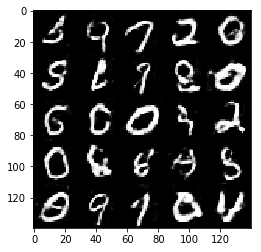

Epoch 4/5... Discriminator Loss: 1.1665... Generator Loss: 0.7198
Epoch 4/5... Discriminator Loss: 1.8303... Generator Loss: 1.6782
Epoch 4/5... Discriminator Loss: 1.5307... Generator Loss: 0.3065
Epoch 4/5... Discriminator Loss: 1.1280... Generator Loss: 0.8722
Epoch 4/5... Discriminator Loss: 1.3009... Generator Loss: 0.5071
Epoch 4/5... Discriminator Loss: 1.4004... Generator Loss: 0.4399
Epoch 4/5... Discriminator Loss: 1.4672... Generator Loss: 0.3499
Epoch 4/5... Discriminator Loss: 1.4320... Generator Loss: 0.3680
Epoch 4/5... Discriminator Loss: 1.3457... Generator Loss: 0.6416
Epoch 4/5... Discriminator Loss: 1.4466... Generator Loss: 0.3796


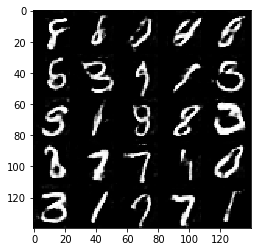

Epoch 4/5... Discriminator Loss: 1.0769... Generator Loss: 0.6639
Epoch 4/5... Discriminator Loss: 1.3604... Generator Loss: 1.0062
Epoch 4/5... Discriminator Loss: 1.6387... Generator Loss: 0.2892
Epoch 4/5... Discriminator Loss: 1.1453... Generator Loss: 0.6228
Epoch 4/5... Discriminator Loss: 1.2223... Generator Loss: 0.5572
Epoch 4/5... Discriminator Loss: 1.2517... Generator Loss: 0.5761
Epoch 4/5... Discriminator Loss: 1.1107... Generator Loss: 0.8248
Epoch 4/5... Discriminator Loss: 1.2224... Generator Loss: 0.4966
Epoch 4/5... Discriminator Loss: 1.1524... Generator Loss: 0.6345
Epoch 4/5... Discriminator Loss: 1.2820... Generator Loss: 0.4622


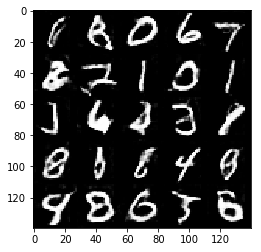

Epoch 4/5... Discriminator Loss: 1.2323... Generator Loss: 0.9674
Epoch 4/5... Discriminator Loss: 1.3568... Generator Loss: 0.4206
Epoch 4/5... Discriminator Loss: 1.2579... Generator Loss: 0.6488
Epoch 4/5... Discriminator Loss: 1.4189... Generator Loss: 0.3888
Epoch 4/5... Discriminator Loss: 1.4530... Generator Loss: 0.4378
Epoch 4/5... Discriminator Loss: 1.1744... Generator Loss: 1.0475
Epoch 4/5... Discriminator Loss: 1.3119... Generator Loss: 0.4244
Epoch 4/5... Discriminator Loss: 1.3308... Generator Loss: 0.4693


In [310]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 0/5... Discriminator Loss: 2.1545... Generator Loss: 0.2936
Epoch 0/5... Discriminator Loss: 1.8445... Generator Loss: 0.5786
Epoch 0/5... Discriminator Loss: 2.1359... Generator Loss: 1.8131
Epoch 0/5... Discriminator Loss: 1.7407... Generator Loss: 0.4551
Epoch 0/5... Discriminator Loss: 1.8327... Generator Loss: 0.3552
Epoch 0/5... Discriminator Loss: 1.8071... Generator Loss: 0.3971
Epoch 0/5... Discriminator Loss: 1.9325... Generator Loss: 0.6375
Epoch 0/5... Discriminator Loss: 1.7798... Generator Loss: 0.3760
Epoch 0/5... Discriminator Loss: 1.8227... Generator Loss: 0.7007
Epoch 0/5... Discriminator Loss: 1.7205... Generator Loss: 0.4995


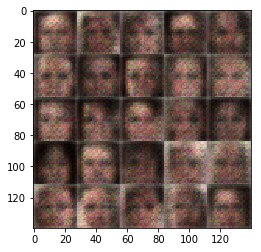

Epoch 0/5... Discriminator Loss: 1.4664... Generator Loss: 0.6297
Epoch 0/5... Discriminator Loss: 1.5445... Generator Loss: 0.4283
Epoch 0/5... Discriminator Loss: 1.6729... Generator Loss: 0.7443
Epoch 0/5... Discriminator Loss: 1.8423... Generator Loss: 0.5602
Epoch 0/5... Discriminator Loss: 1.6045... Generator Loss: 0.6764
Epoch 0/5... Discriminator Loss: 1.7521... Generator Loss: 0.4766
Epoch 0/5... Discriminator Loss: 1.6584... Generator Loss: 0.6871
Epoch 0/5... Discriminator Loss: 1.6098... Generator Loss: 0.9138
Epoch 0/5... Discriminator Loss: 1.5806... Generator Loss: 0.5819
Epoch 0/5... Discriminator Loss: 1.4714... Generator Loss: 0.6535


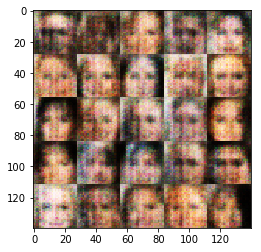

Epoch 0/5... Discriminator Loss: 1.5872... Generator Loss: 0.5586
Epoch 0/5... Discriminator Loss: 1.4920... Generator Loss: 0.6251
Epoch 0/5... Discriminator Loss: 1.5713... Generator Loss: 0.5870
Epoch 0/5... Discriminator Loss: 1.5896... Generator Loss: 0.4945
Epoch 0/5... Discriminator Loss: 1.4261... Generator Loss: 0.6547
Epoch 0/5... Discriminator Loss: 1.3829... Generator Loss: 0.6237
Epoch 0/5... Discriminator Loss: 1.5321... Generator Loss: 0.5686
Epoch 0/5... Discriminator Loss: 1.4667... Generator Loss: 0.6011
Epoch 0/5... Discriminator Loss: 1.5794... Generator Loss: 0.5691
Epoch 0/5... Discriminator Loss: 1.4016... Generator Loss: 0.6378


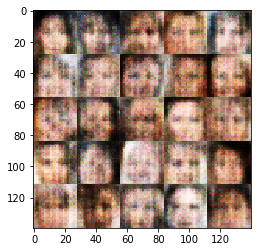

Epoch 0/5... Discriminator Loss: 1.3787... Generator Loss: 0.6536
Epoch 0/5... Discriminator Loss: 1.5339... Generator Loss: 0.6609
Epoch 0/5... Discriminator Loss: 1.4166... Generator Loss: 0.5386
Epoch 0/5... Discriminator Loss: 1.4935... Generator Loss: 0.6282
Epoch 0/5... Discriminator Loss: 1.5695... Generator Loss: 0.4758
Epoch 0/5... Discriminator Loss: 1.5896... Generator Loss: 0.5559
Epoch 0/5... Discriminator Loss: 1.5244... Generator Loss: 0.5186
Epoch 0/5... Discriminator Loss: 1.5516... Generator Loss: 0.5948
Epoch 0/5... Discriminator Loss: 1.4168... Generator Loss: 0.6404
Epoch 0/5... Discriminator Loss: 1.5287... Generator Loss: 0.5390


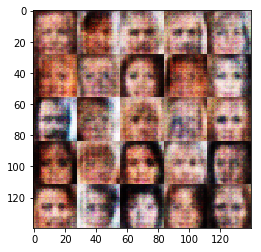

Epoch 0/5... Discriminator Loss: 1.5384... Generator Loss: 0.6342
Epoch 0/5... Discriminator Loss: 1.6456... Generator Loss: 0.5461
Epoch 0/5... Discriminator Loss: 1.6076... Generator Loss: 0.4994
Epoch 0/5... Discriminator Loss: 1.6863... Generator Loss: 0.4639
Epoch 0/5... Discriminator Loss: 1.5281... Generator Loss: 0.5381
Epoch 0/5... Discriminator Loss: 1.6706... Generator Loss: 0.5492
Epoch 0/5... Discriminator Loss: 1.5182... Generator Loss: 0.6083
Epoch 0/5... Discriminator Loss: 1.6584... Generator Loss: 0.4451
Epoch 0/5... Discriminator Loss: 1.5080... Generator Loss: 0.6581
Epoch 0/5... Discriminator Loss: 1.6109... Generator Loss: 0.6876


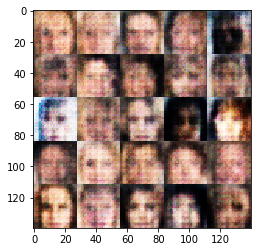

Epoch 0/5... Discriminator Loss: 1.4209... Generator Loss: 0.6706
Epoch 0/5... Discriminator Loss: 1.6033... Generator Loss: 0.5416
Epoch 0/5... Discriminator Loss: 1.5826... Generator Loss: 0.5180
Epoch 0/5... Discriminator Loss: 1.5533... Generator Loss: 0.5885
Epoch 0/5... Discriminator Loss: 1.4508... Generator Loss: 0.6424
Epoch 0/5... Discriminator Loss: 1.5154... Generator Loss: 0.5834
Epoch 0/5... Discriminator Loss: 1.5792... Generator Loss: 0.6138
Epoch 0/5... Discriminator Loss: 1.4754... Generator Loss: 0.7061
Epoch 0/5... Discriminator Loss: 1.5227... Generator Loss: 0.6112
Epoch 0/5... Discriminator Loss: 1.6034... Generator Loss: 0.5765


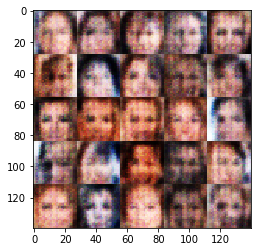

Epoch 0/5... Discriminator Loss: 1.5249... Generator Loss: 0.6577
Epoch 0/5... Discriminator Loss: 1.4984... Generator Loss: 0.6489
Epoch 0/5... Discriminator Loss: 1.5286... Generator Loss: 0.5717
Epoch 0/5... Discriminator Loss: 1.4576... Generator Loss: 0.7176
Epoch 0/5... Discriminator Loss: 1.4744... Generator Loss: 0.6103
Epoch 0/5... Discriminator Loss: 1.5015... Generator Loss: 0.6559
Epoch 0/5... Discriminator Loss: 1.4314... Generator Loss: 0.6483
Epoch 0/5... Discriminator Loss: 1.4883... Generator Loss: 0.6625
Epoch 0/5... Discriminator Loss: 1.4614... Generator Loss: 0.7011
Epoch 0/5... Discriminator Loss: 1.5683... Generator Loss: 0.6006


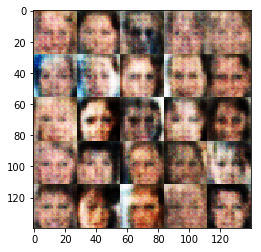

Epoch 0/5... Discriminator Loss: 1.4904... Generator Loss: 0.6262
Epoch 0/5... Discriminator Loss: 1.4935... Generator Loss: 0.6262
Epoch 0/5... Discriminator Loss: 1.4174... Generator Loss: 0.6185
Epoch 0/5... Discriminator Loss: 1.5601... Generator Loss: 0.6169
Epoch 0/5... Discriminator Loss: 1.4090... Generator Loss: 0.6271
Epoch 0/5... Discriminator Loss: 1.4855... Generator Loss: 0.6584
Epoch 0/5... Discriminator Loss: 1.5533... Generator Loss: 0.5798
Epoch 0/5... Discriminator Loss: 1.4310... Generator Loss: 0.7023
Epoch 0/5... Discriminator Loss: 1.5444... Generator Loss: 0.5848
Epoch 0/5... Discriminator Loss: 1.4513... Generator Loss: 0.6360


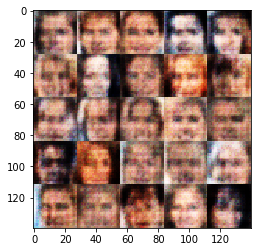

Epoch 0/5... Discriminator Loss: 1.4304... Generator Loss: 0.6717
Epoch 0/5... Discriminator Loss: 1.4832... Generator Loss: 0.6288
Epoch 0/5... Discriminator Loss: 1.5294... Generator Loss: 0.5780
Epoch 0/5... Discriminator Loss: 1.3916... Generator Loss: 0.6646
Epoch 0/5... Discriminator Loss: 1.4375... Generator Loss: 0.6862
Epoch 0/5... Discriminator Loss: 1.4784... Generator Loss: 0.6893
Epoch 0/5... Discriminator Loss: 1.4623... Generator Loss: 0.5971
Epoch 0/5... Discriminator Loss: 1.4604... Generator Loss: 0.6583
Epoch 0/5... Discriminator Loss: 1.4859... Generator Loss: 0.6101
Epoch 0/5... Discriminator Loss: 1.3521... Generator Loss: 0.6986


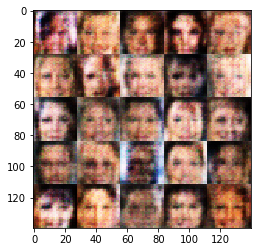

Epoch 0/5... Discriminator Loss: 1.5771... Generator Loss: 0.5780
Epoch 0/5... Discriminator Loss: 1.4855... Generator Loss: 0.6364
Epoch 0/5... Discriminator Loss: 1.4637... Generator Loss: 0.6260
Epoch 0/5... Discriminator Loss: 1.4736... Generator Loss: 0.6601
Epoch 0/5... Discriminator Loss: 1.5384... Generator Loss: 0.6372
Epoch 0/5... Discriminator Loss: 1.4046... Generator Loss: 0.6692
Epoch 0/5... Discriminator Loss: 1.5058... Generator Loss: 0.5991
Epoch 0/5... Discriminator Loss: 1.3988... Generator Loss: 0.6896
Epoch 0/5... Discriminator Loss: 1.4743... Generator Loss: 0.6471
Epoch 0/5... Discriminator Loss: 1.5062... Generator Loss: 0.6034


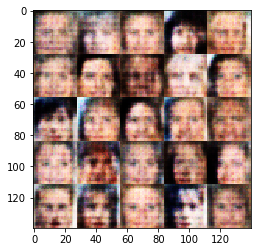

Epoch 0/5... Discriminator Loss: 1.4661... Generator Loss: 0.6799
Epoch 0/5... Discriminator Loss: 1.5271... Generator Loss: 0.6431
Epoch 0/5... Discriminator Loss: 1.4012... Generator Loss: 0.6492
Epoch 0/5... Discriminator Loss: 1.5146... Generator Loss: 0.6595
Epoch 0/5... Discriminator Loss: 1.5090... Generator Loss: 0.6018
Epoch 0/5... Discriminator Loss: 1.4769... Generator Loss: 0.6182
Epoch 0/5... Discriminator Loss: 1.3795... Generator Loss: 0.7131
Epoch 0/5... Discriminator Loss: 1.4408... Generator Loss: 0.6067
Epoch 0/5... Discriminator Loss: 1.4219... Generator Loss: 0.6780
Epoch 0/5... Discriminator Loss: 1.4513... Generator Loss: 0.6821


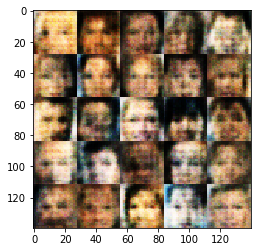

Epoch 0/5... Discriminator Loss: 1.4437... Generator Loss: 0.6416
Epoch 0/5... Discriminator Loss: 1.4011... Generator Loss: 0.7179
Epoch 0/5... Discriminator Loss: 1.4252... Generator Loss: 0.6271
Epoch 0/5... Discriminator Loss: 1.5100... Generator Loss: 0.6351
Epoch 0/5... Discriminator Loss: 1.4437... Generator Loss: 0.6329
Epoch 0/5... Discriminator Loss: 1.4193... Generator Loss: 0.6848
Epoch 0/5... Discriminator Loss: 1.4927... Generator Loss: 0.6426
Epoch 0/5... Discriminator Loss: 1.4463... Generator Loss: 0.6852
Epoch 0/5... Discriminator Loss: 1.4534... Generator Loss: 0.6127
Epoch 0/5... Discriminator Loss: 1.4664... Generator Loss: 0.6503


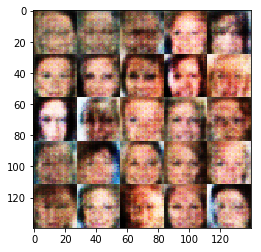

Epoch 0/5... Discriminator Loss: 1.3835... Generator Loss: 0.6720
Epoch 0/5... Discriminator Loss: 1.4990... Generator Loss: 0.6007
Epoch 0/5... Discriminator Loss: 1.4582... Generator Loss: 0.6623
Epoch 0/5... Discriminator Loss: 1.4625... Generator Loss: 0.6290
Epoch 0/5... Discriminator Loss: 1.3999... Generator Loss: 0.6953
Epoch 0/5... Discriminator Loss: 1.4239... Generator Loss: 0.6416
Epoch 0/5... Discriminator Loss: 1.4560... Generator Loss: 0.7173
Epoch 0/5... Discriminator Loss: 1.4270... Generator Loss: 0.6198
Epoch 0/5... Discriminator Loss: 1.4426... Generator Loss: 0.6484
Epoch 0/5... Discriminator Loss: 1.4521... Generator Loss: 0.6575


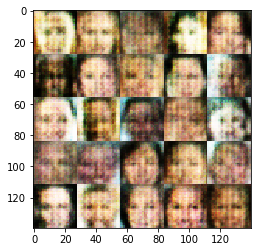

Epoch 0/5... Discriminator Loss: 1.3900... Generator Loss: 0.6949
Epoch 0/5... Discriminator Loss: 1.4605... Generator Loss: 0.6495
Epoch 0/5... Discriminator Loss: 1.4803... Generator Loss: 0.6421
Epoch 0/5... Discriminator Loss: 1.4464... Generator Loss: 0.6753
Epoch 0/5... Discriminator Loss: 1.3782... Generator Loss: 0.6728
Epoch 0/5... Discriminator Loss: 1.5031... Generator Loss: 0.6342
Epoch 0/5... Discriminator Loss: 1.5034... Generator Loss: 0.6485
Epoch 0/5... Discriminator Loss: 1.4127... Generator Loss: 0.6915
Epoch 0/5... Discriminator Loss: 1.4670... Generator Loss: 0.6835
Epoch 0/5... Discriminator Loss: 1.4395... Generator Loss: 0.6855


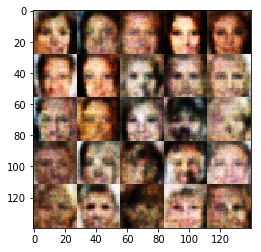

Epoch 0/5... Discriminator Loss: 1.4085... Generator Loss: 0.6639
Epoch 0/5... Discriminator Loss: 1.4707... Generator Loss: 0.6902
Epoch 0/5... Discriminator Loss: 1.4164... Generator Loss: 0.6375
Epoch 0/5... Discriminator Loss: 1.4786... Generator Loss: 0.6178
Epoch 0/5... Discriminator Loss: 1.3791... Generator Loss: 0.6862
Epoch 0/5... Discriminator Loss: 1.4485... Generator Loss: 0.6382
Epoch 0/5... Discriminator Loss: 1.4287... Generator Loss: 0.6989
Epoch 0/5... Discriminator Loss: 1.4468... Generator Loss: 0.6700
Epoch 0/5... Discriminator Loss: 1.4508... Generator Loss: 0.6515
Epoch 0/5... Discriminator Loss: 1.3608... Generator Loss: 0.6955


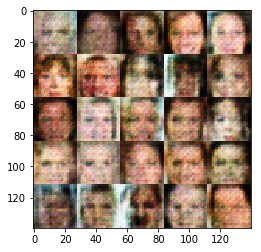

Epoch 0/5... Discriminator Loss: 1.4116... Generator Loss: 0.6326
Epoch 0/5... Discriminator Loss: 1.4604... Generator Loss: 0.6925
Epoch 0/5... Discriminator Loss: 1.4130... Generator Loss: 0.6589
Epoch 0/5... Discriminator Loss: 1.4229... Generator Loss: 0.6610
Epoch 0/5... Discriminator Loss: 1.4978... Generator Loss: 0.6712
Epoch 0/5... Discriminator Loss: 1.3684... Generator Loss: 0.7196
Epoch 0/5... Discriminator Loss: 1.4162... Generator Loss: 0.6571
Epoch 0/5... Discriminator Loss: 1.4664... Generator Loss: 0.6818
Epoch 0/5... Discriminator Loss: 1.5470... Generator Loss: 0.6379
Epoch 0/5... Discriminator Loss: 1.4187... Generator Loss: 0.6226


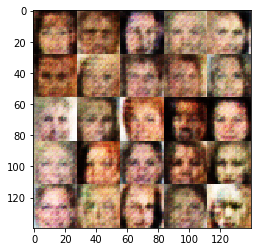

Epoch 0/5... Discriminator Loss: 1.5205... Generator Loss: 0.6110
Epoch 0/5... Discriminator Loss: 1.4998... Generator Loss: 0.6275
Epoch 0/5... Discriminator Loss: 1.4236... Generator Loss: 0.6157
Epoch 0/5... Discriminator Loss: 1.4791... Generator Loss: 0.5570
Epoch 0/5... Discriminator Loss: 1.4414... Generator Loss: 0.6195
Epoch 0/5... Discriminator Loss: 1.4789... Generator Loss: 0.6368
Epoch 0/5... Discriminator Loss: 1.4400... Generator Loss: 0.6660
Epoch 0/5... Discriminator Loss: 1.4279... Generator Loss: 0.6529
Epoch 0/5... Discriminator Loss: 1.4936... Generator Loss: 0.5936
Epoch 0/5... Discriminator Loss: 1.4222... Generator Loss: 0.6741


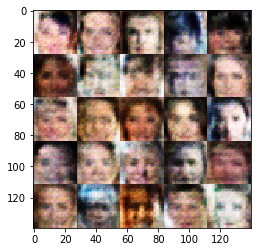

Epoch 0/5... Discriminator Loss: 1.4982... Generator Loss: 0.6195
Epoch 0/5... Discriminator Loss: 1.4064... Generator Loss: 0.6924
Epoch 0/5... Discriminator Loss: 1.4349... Generator Loss: 0.6441
Epoch 0/5... Discriminator Loss: 1.4444... Generator Loss: 0.6514
Epoch 0/5... Discriminator Loss: 1.5035... Generator Loss: 0.5733
Epoch 0/5... Discriminator Loss: 1.3601... Generator Loss: 0.7004
Epoch 0/5... Discriminator Loss: 1.4765... Generator Loss: 0.6255
Epoch 0/5... Discriminator Loss: 1.4742... Generator Loss: 0.6094
Epoch 0/5... Discriminator Loss: 1.4138... Generator Loss: 0.6726
Epoch 0/5... Discriminator Loss: 1.5164... Generator Loss: 0.6193


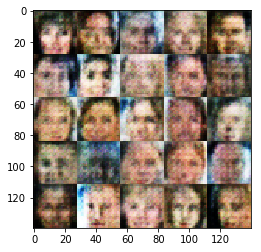

Epoch 0/5... Discriminator Loss: 1.4340... Generator Loss: 0.6845
Epoch 0/5... Discriminator Loss: 1.4546... Generator Loss: 0.6419
Epoch 0/5... Discriminator Loss: 1.4559... Generator Loss: 0.6032
Epoch 0/5... Discriminator Loss: 1.4904... Generator Loss: 0.6186
Epoch 0/5... Discriminator Loss: 1.4292... Generator Loss: 0.6108
Epoch 0/5... Discriminator Loss: 1.5110... Generator Loss: 0.6255
Epoch 0/5... Discriminator Loss: 1.4492... Generator Loss: 0.6657
Epoch 0/5... Discriminator Loss: 1.4363... Generator Loss: 0.6615
Epoch 0/5... Discriminator Loss: 1.3927... Generator Loss: 0.6636
Epoch 0/5... Discriminator Loss: 1.4671... Generator Loss: 0.6304


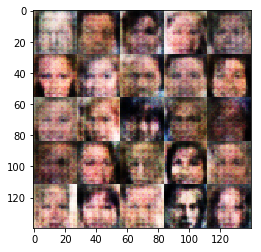

Epoch 0/5... Discriminator Loss: 1.5116... Generator Loss: 0.6066
Epoch 0/5... Discriminator Loss: 1.4211... Generator Loss: 0.7203
Epoch 0/5... Discriminator Loss: 1.4731... Generator Loss: 0.6420
Epoch 0/5... Discriminator Loss: 1.4398... Generator Loss: 0.7214
Epoch 0/5... Discriminator Loss: 1.3872... Generator Loss: 0.6734
Epoch 0/5... Discriminator Loss: 1.4554... Generator Loss: 0.6552
Epoch 0/5... Discriminator Loss: 1.4382... Generator Loss: 0.6101
Epoch 0/5... Discriminator Loss: 1.4536... Generator Loss: 0.6887
Epoch 0/5... Discriminator Loss: 1.4264... Generator Loss: 0.7117
Epoch 0/5... Discriminator Loss: 1.4562... Generator Loss: 0.6592


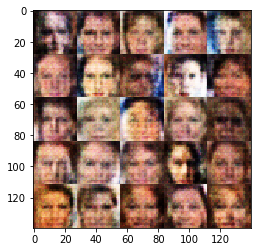

Epoch 0/5... Discriminator Loss: 1.4039... Generator Loss: 0.7114
Epoch 0/5... Discriminator Loss: 1.4640... Generator Loss: 0.6523
Epoch 0/5... Discriminator Loss: 1.4117... Generator Loss: 0.6731
Epoch 0/5... Discriminator Loss: 1.4673... Generator Loss: 0.6436
Epoch 0/5... Discriminator Loss: 1.4615... Generator Loss: 0.6518
Epoch 0/5... Discriminator Loss: 1.4827... Generator Loss: 0.6133
Epoch 0/5... Discriminator Loss: 1.5753... Generator Loss: 0.5876
Epoch 0/5... Discriminator Loss: 1.4877... Generator Loss: 0.6211
Epoch 0/5... Discriminator Loss: 1.4738... Generator Loss: 0.6319
Epoch 0/5... Discriminator Loss: 1.4001... Generator Loss: 0.6743


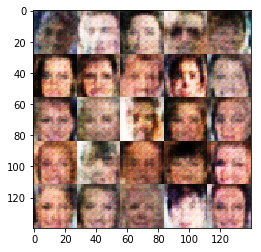

Epoch 0/5... Discriminator Loss: 1.4655... Generator Loss: 0.6644
Epoch 0/5... Discriminator Loss: 1.4254... Generator Loss: 0.6664
Epoch 0/5... Discriminator Loss: 1.4723... Generator Loss: 0.6445
Epoch 0/5... Discriminator Loss: 1.4578... Generator Loss: 0.6328
Epoch 0/5... Discriminator Loss: 1.4441... Generator Loss: 0.6669
Epoch 0/5... Discriminator Loss: 1.4523... Generator Loss: 0.6489
Epoch 0/5... Discriminator Loss: 1.4436... Generator Loss: 0.6438
Epoch 0/5... Discriminator Loss: 1.4670... Generator Loss: 0.6702
Epoch 0/5... Discriminator Loss: 1.4576... Generator Loss: 0.6176
Epoch 0/5... Discriminator Loss: 1.4879... Generator Loss: 0.6382


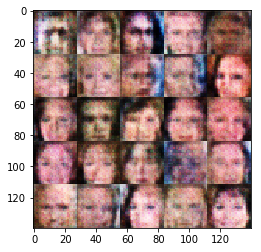

Epoch 0/5... Discriminator Loss: 1.4386... Generator Loss: 0.6591
Epoch 0/5... Discriminator Loss: 1.4482... Generator Loss: 0.6483
Epoch 0/5... Discriminator Loss: 1.4149... Generator Loss: 0.6993
Epoch 0/5... Discriminator Loss: 1.4950... Generator Loss: 0.6024
Epoch 0/5... Discriminator Loss: 1.4140... Generator Loss: 0.6580
Epoch 0/5... Discriminator Loss: 1.4562... Generator Loss: 0.6327
Epoch 0/5... Discriminator Loss: 1.4940... Generator Loss: 0.6478
Epoch 0/5... Discriminator Loss: 1.4198... Generator Loss: 0.6535
Epoch 0/5... Discriminator Loss: 1.4049... Generator Loss: 0.7347
Epoch 0/5... Discriminator Loss: 1.4392... Generator Loss: 0.6343


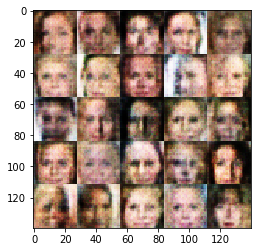

Epoch 0/5... Discriminator Loss: 1.4382... Generator Loss: 0.6202
Epoch 0/5... Discriminator Loss: 1.4570... Generator Loss: 0.6711
Epoch 0/5... Discriminator Loss: 1.4353... Generator Loss: 0.6527
Epoch 0/5... Discriminator Loss: 1.4497... Generator Loss: 0.6628
Epoch 0/5... Discriminator Loss: 1.4254... Generator Loss: 0.6650
Epoch 0/5... Discriminator Loss: 1.4073... Generator Loss: 0.6504
Epoch 0/5... Discriminator Loss: 1.4125... Generator Loss: 0.6291
Epoch 0/5... Discriminator Loss: 1.4277... Generator Loss: 0.6789
Epoch 0/5... Discriminator Loss: 1.4170... Generator Loss: 0.6472
Epoch 0/5... Discriminator Loss: 1.4131... Generator Loss: 0.6364


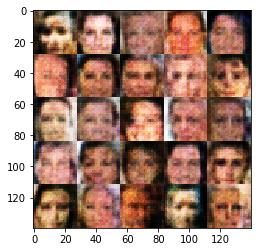

Epoch 0/5... Discriminator Loss: 1.4059... Generator Loss: 0.6909
Epoch 0/5... Discriminator Loss: 1.4440... Generator Loss: 0.6390
Epoch 0/5... Discriminator Loss: 1.4181... Generator Loss: 0.6409
Epoch 0/5... Discriminator Loss: 1.4897... Generator Loss: 0.6859
Epoch 0/5... Discriminator Loss: 1.4288... Generator Loss: 0.6487
Epoch 0/5... Discriminator Loss: 1.4149... Generator Loss: 0.6804
Epoch 0/5... Discriminator Loss: 1.5021... Generator Loss: 0.6070
Epoch 0/5... Discriminator Loss: 1.4650... Generator Loss: 0.6575
Epoch 0/5... Discriminator Loss: 1.4055... Generator Loss: 0.6541
Epoch 0/5... Discriminator Loss: 1.5321... Generator Loss: 0.5795


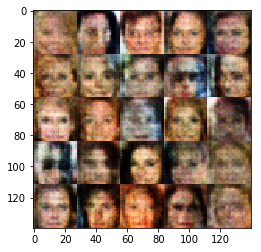

Epoch 0/5... Discriminator Loss: 1.4654... Generator Loss: 0.6703
Epoch 0/5... Discriminator Loss: 1.4066... Generator Loss: 0.6604
Epoch 0/5... Discriminator Loss: 1.4322... Generator Loss: 0.6483
Epoch 0/5... Discriminator Loss: 1.4444... Generator Loss: 0.6238
Epoch 0/5... Discriminator Loss: 1.4079... Generator Loss: 0.6193
Epoch 0/5... Discriminator Loss: 1.4554... Generator Loss: 0.6730
Epoch 0/5... Discriminator Loss: 1.4307... Generator Loss: 0.6762
Epoch 0/5... Discriminator Loss: 1.4187... Generator Loss: 0.6776
Epoch 0/5... Discriminator Loss: 1.4860... Generator Loss: 0.6149
Epoch 0/5... Discriminator Loss: 1.4585... Generator Loss: 0.6277


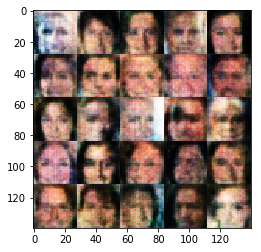

Epoch 0/5... Discriminator Loss: 1.4765... Generator Loss: 0.6131
Epoch 0/5... Discriminator Loss: 1.4982... Generator Loss: 0.6271
Epoch 0/5... Discriminator Loss: 1.4629... Generator Loss: 0.6373
Epoch 0/5... Discriminator Loss: 1.3897... Generator Loss: 0.6528
Epoch 0/5... Discriminator Loss: 1.4389... Generator Loss: 0.6523
Epoch 0/5... Discriminator Loss: 1.4240... Generator Loss: 0.6376
Epoch 0/5... Discriminator Loss: 1.4250... Generator Loss: 0.6539
Epoch 0/5... Discriminator Loss: 1.4216... Generator Loss: 0.6390
Epoch 0/5... Discriminator Loss: 1.4803... Generator Loss: 0.6148
Epoch 0/5... Discriminator Loss: 1.4381... Generator Loss: 0.6574


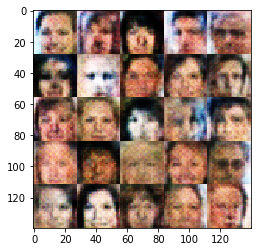

Epoch 0/5... Discriminator Loss: 1.4626... Generator Loss: 0.6439
Epoch 0/5... Discriminator Loss: 1.4228... Generator Loss: 0.6958
Epoch 0/5... Discriminator Loss: 1.4085... Generator Loss: 0.6848
Epoch 0/5... Discriminator Loss: 1.4255... Generator Loss: 0.6752
Epoch 0/5... Discriminator Loss: 1.4274... Generator Loss: 0.6381
Epoch 0/5... Discriminator Loss: 1.4666... Generator Loss: 0.6592
Epoch 0/5... Discriminator Loss: 1.4166... Generator Loss: 0.6590
Epoch 0/5... Discriminator Loss: 1.4600... Generator Loss: 0.6927
Epoch 0/5... Discriminator Loss: 1.4275... Generator Loss: 0.6402
Epoch 0/5... Discriminator Loss: 1.3947... Generator Loss: 0.6818


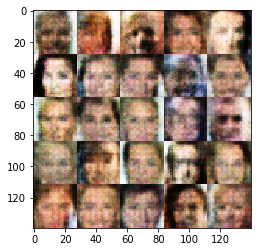

Epoch 0/5... Discriminator Loss: 1.4426... Generator Loss: 0.6504
Epoch 0/5... Discriminator Loss: 1.4474... Generator Loss: 0.6394
Epoch 0/5... Discriminator Loss: 1.4351... Generator Loss: 0.6767
Epoch 0/5... Discriminator Loss: 1.3668... Generator Loss: 0.7141
Epoch 0/5... Discriminator Loss: 1.3881... Generator Loss: 0.6417
Epoch 0/5... Discriminator Loss: 1.4006... Generator Loss: 0.6781
Epoch 0/5... Discriminator Loss: 1.4531... Generator Loss: 0.6536
Epoch 0/5... Discriminator Loss: 1.4085... Generator Loss: 0.6493
Epoch 0/5... Discriminator Loss: 1.3851... Generator Loss: 0.6727
Epoch 0/5... Discriminator Loss: 1.3294... Generator Loss: 0.7337


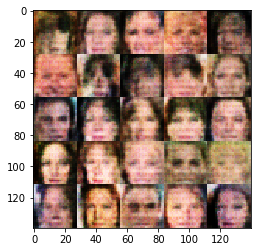

Epoch 0/5... Discriminator Loss: 1.3613... Generator Loss: 0.6459
Epoch 0/5... Discriminator Loss: 1.4586... Generator Loss: 0.5643
Epoch 0/5... Discriminator Loss: 1.1653... Generator Loss: 0.8665
Epoch 0/5... Discriminator Loss: 1.3166... Generator Loss: 0.7700
Epoch 0/5... Discriminator Loss: 1.2442... Generator Loss: 0.7861
Epoch 0/5... Discriminator Loss: 1.4920... Generator Loss: 0.3704
Epoch 0/5... Discriminator Loss: 1.3332... Generator Loss: 1.8608
Epoch 0/5... Discriminator Loss: 1.3538... Generator Loss: 0.7461
Epoch 0/5... Discriminator Loss: 1.4883... Generator Loss: 0.6366
Epoch 0/5... Discriminator Loss: 1.2569... Generator Loss: 0.6562


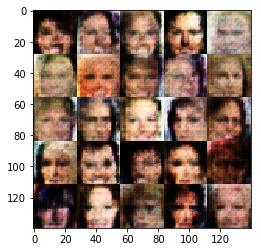

Epoch 0/5... Discriminator Loss: 1.3692... Generator Loss: 0.7367
Epoch 0/5... Discriminator Loss: 1.3781... Generator Loss: 0.5737
Epoch 0/5... Discriminator Loss: 1.3288... Generator Loss: 0.5677
Epoch 0/5... Discriminator Loss: 1.5441... Generator Loss: 0.3747
Epoch 0/5... Discriminator Loss: 1.5656... Generator Loss: 0.3166
Epoch 0/5... Discriminator Loss: 1.4790... Generator Loss: 0.4378
Epoch 0/5... Discriminator Loss: 1.3749... Generator Loss: 0.7031
Epoch 0/5... Discriminator Loss: 1.3991... Generator Loss: 0.4460
Epoch 0/5... Discriminator Loss: 1.4334... Generator Loss: 0.5426
Epoch 0/5... Discriminator Loss: 1.3488... Generator Loss: 1.5987


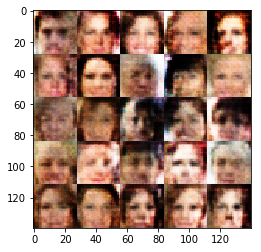

Epoch 0/5... Discriminator Loss: 1.4426... Generator Loss: 0.5855
Epoch 0/5... Discriminator Loss: 1.5118... Generator Loss: 0.8400
Epoch 0/5... Discriminator Loss: 1.0887... Generator Loss: 2.1141
Epoch 0/5... Discriminator Loss: 1.3964... Generator Loss: 0.7119
Epoch 0/5... Discriminator Loss: 1.9449... Generator Loss: 0.2087
Epoch 0/5... Discriminator Loss: 1.2992... Generator Loss: 0.8894
Epoch 1/5... Discriminator Loss: 1.2430... Generator Loss: 0.8273
Epoch 1/5... Discriminator Loss: 1.3460... Generator Loss: 0.7169
Epoch 1/5... Discriminator Loss: 1.2247... Generator Loss: 0.7381
Epoch 1/5... Discriminator Loss: 1.2138... Generator Loss: 0.8605


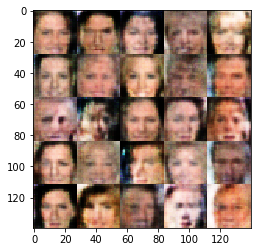

Epoch 1/5... Discriminator Loss: 1.6050... Generator Loss: 0.3946
Epoch 1/5... Discriminator Loss: 1.4995... Generator Loss: 0.5220
Epoch 1/5... Discriminator Loss: 1.4788... Generator Loss: 0.6262
Epoch 1/5... Discriminator Loss: 1.6514... Generator Loss: 0.3865
Epoch 1/5... Discriminator Loss: 1.5720... Generator Loss: 0.6032
Epoch 1/5... Discriminator Loss: 1.3683... Generator Loss: 0.6758
Epoch 1/5... Discriminator Loss: 1.4894... Generator Loss: 0.6930
Epoch 1/5... Discriminator Loss: 1.4086... Generator Loss: 0.7435
Epoch 1/5... Discriminator Loss: 1.3507... Generator Loss: 0.6222
Epoch 1/5... Discriminator Loss: 1.3457... Generator Loss: 0.7172


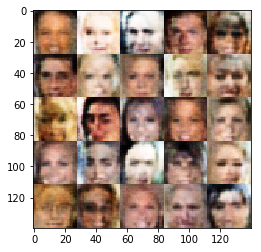

Epoch 1/5... Discriminator Loss: 1.5171... Generator Loss: 0.5632
Epoch 1/5... Discriminator Loss: 1.3861... Generator Loss: 0.5447
Epoch 1/5... Discriminator Loss: 1.4417... Generator Loss: 0.5805
Epoch 1/5... Discriminator Loss: 1.4891... Generator Loss: 0.6351
Epoch 1/5... Discriminator Loss: 1.4462... Generator Loss: 0.5987
Epoch 1/5... Discriminator Loss: 1.2944... Generator Loss: 0.8160
Epoch 1/5... Discriminator Loss: 1.4480... Generator Loss: 0.6272
Epoch 1/5... Discriminator Loss: 1.4012... Generator Loss: 0.6904
Epoch 1/5... Discriminator Loss: 1.4192... Generator Loss: 0.6443
Epoch 1/5... Discriminator Loss: 1.4995... Generator Loss: 0.5895


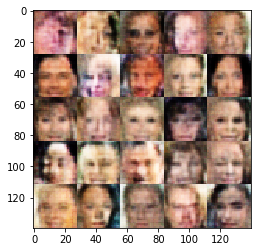

Epoch 1/5... Discriminator Loss: 1.4301... Generator Loss: 0.6691
Epoch 1/5... Discriminator Loss: 1.4192... Generator Loss: 0.6945
Epoch 1/5... Discriminator Loss: 1.4646... Generator Loss: 0.6420
Epoch 1/5... Discriminator Loss: 1.4354... Generator Loss: 0.6300
Epoch 1/5... Discriminator Loss: 1.4273... Generator Loss: 0.6358
Epoch 1/5... Discriminator Loss: 1.5017... Generator Loss: 0.6545
Epoch 1/5... Discriminator Loss: 1.4061... Generator Loss: 0.6723
Epoch 1/5... Discriminator Loss: 1.4583... Generator Loss: 0.6197
Epoch 1/5... Discriminator Loss: 1.5469... Generator Loss: 0.5996
Epoch 1/5... Discriminator Loss: 1.4503... Generator Loss: 0.6615


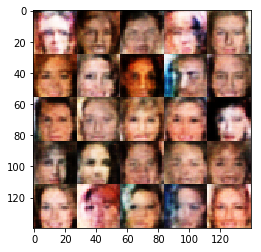

Epoch 1/5... Discriminator Loss: 1.4462... Generator Loss: 0.6700
Epoch 1/5... Discriminator Loss: 1.4195... Generator Loss: 0.6776
Epoch 1/5... Discriminator Loss: 1.4413... Generator Loss: 0.6329
Epoch 1/5... Discriminator Loss: 1.4589... Generator Loss: 0.6205
Epoch 1/5... Discriminator Loss: 1.4838... Generator Loss: 0.6451
Epoch 1/5... Discriminator Loss: 1.4485... Generator Loss: 0.6237
Epoch 1/5... Discriminator Loss: 1.3514... Generator Loss: 0.6983
Epoch 1/5... Discriminator Loss: 1.4301... Generator Loss: 0.6564
Epoch 1/5... Discriminator Loss: 1.4357... Generator Loss: 0.6735
Epoch 1/5... Discriminator Loss: 1.3815... Generator Loss: 0.6976


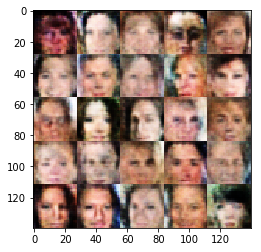

Epoch 1/5... Discriminator Loss: 1.4328... Generator Loss: 0.6383
Epoch 1/5... Discriminator Loss: 1.4006... Generator Loss: 0.6932
Epoch 1/5... Discriminator Loss: 1.4473... Generator Loss: 0.6229
Epoch 1/5... Discriminator Loss: 1.4009... Generator Loss: 0.6546
Epoch 1/5... Discriminator Loss: 1.4946... Generator Loss: 0.6156
Epoch 1/5... Discriminator Loss: 1.4386... Generator Loss: 0.6492
Epoch 1/5... Discriminator Loss: 1.4394... Generator Loss: 0.6697
Epoch 1/5... Discriminator Loss: 1.4238... Generator Loss: 0.6495
Epoch 1/5... Discriminator Loss: 1.3948... Generator Loss: 0.6614
Epoch 1/5... Discriminator Loss: 1.4264... Generator Loss: 0.6143


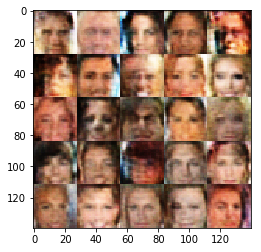

Epoch 1/5... Discriminator Loss: 1.4094... Generator Loss: 0.6873
Epoch 1/5... Discriminator Loss: 1.4552... Generator Loss: 0.6425
Epoch 1/5... Discriminator Loss: 1.4343... Generator Loss: 0.6770
Epoch 1/5... Discriminator Loss: 1.4480... Generator Loss: 0.6334
Epoch 1/5... Discriminator Loss: 1.3415... Generator Loss: 0.7101
Epoch 1/5... Discriminator Loss: 1.4728... Generator Loss: 0.6274
Epoch 1/5... Discriminator Loss: 1.3796... Generator Loss: 0.6935
Epoch 1/5... Discriminator Loss: 1.4127... Generator Loss: 0.6463
Epoch 1/5... Discriminator Loss: 1.4471... Generator Loss: 0.6581
Epoch 1/5... Discriminator Loss: 1.4782... Generator Loss: 0.6065


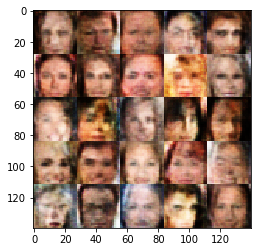

Epoch 1/5... Discriminator Loss: 1.4262... Generator Loss: 0.6252
Epoch 1/5... Discriminator Loss: 1.4041... Generator Loss: 0.6614
Epoch 1/5... Discriminator Loss: 1.4002... Generator Loss: 0.6497
Epoch 1/5... Discriminator Loss: 1.3301... Generator Loss: 0.7312
Epoch 1/5... Discriminator Loss: 1.4360... Generator Loss: 0.6250
Epoch 1/5... Discriminator Loss: 1.5278... Generator Loss: 0.5794
Epoch 1/5... Discriminator Loss: 1.4628... Generator Loss: 0.6277
Epoch 1/5... Discriminator Loss: 1.4135... Generator Loss: 0.6368
Epoch 1/5... Discriminator Loss: 1.4676... Generator Loss: 0.5933
Epoch 1/5... Discriminator Loss: 1.4576... Generator Loss: 0.6170


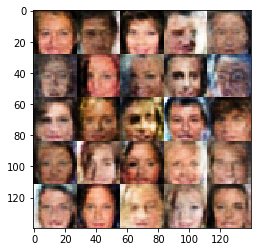

Epoch 1/5... Discriminator Loss: 1.4728... Generator Loss: 0.6136
Epoch 1/5... Discriminator Loss: 1.4159... Generator Loss: 0.6054
Epoch 1/5... Discriminator Loss: 1.5539... Generator Loss: 0.5535
Epoch 1/5... Discriminator Loss: 1.4084... Generator Loss: 0.6407
Epoch 1/5... Discriminator Loss: 1.4638... Generator Loss: 0.6289
Epoch 1/5... Discriminator Loss: 1.4255... Generator Loss: 0.5970
Epoch 1/5... Discriminator Loss: 1.4372... Generator Loss: 0.5848
Epoch 1/5... Discriminator Loss: 1.4626... Generator Loss: 0.5770
Epoch 1/5... Discriminator Loss: 1.3978... Generator Loss: 0.6846
Epoch 1/5... Discriminator Loss: 1.4099... Generator Loss: 0.6267


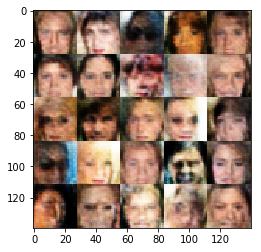

Epoch 1/5... Discriminator Loss: 1.3818... Generator Loss: 0.6524
Epoch 1/5... Discriminator Loss: 1.3054... Generator Loss: 0.7369
Epoch 1/5... Discriminator Loss: 1.3460... Generator Loss: 0.6860
Epoch 1/5... Discriminator Loss: 1.3838... Generator Loss: 0.5470
Epoch 1/5... Discriminator Loss: 1.2974... Generator Loss: 0.8722
Epoch 1/5... Discriminator Loss: 1.3478... Generator Loss: 0.6630
Epoch 1/5... Discriminator Loss: 1.3636... Generator Loss: 0.6286
Epoch 1/5... Discriminator Loss: 1.5494... Generator Loss: 1.1877
Epoch 1/5... Discriminator Loss: 1.3622... Generator Loss: 0.6312
Epoch 1/5... Discriminator Loss: 1.5325... Generator Loss: 0.5617


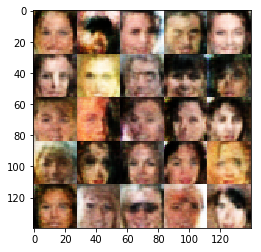

Epoch 1/5... Discriminator Loss: 1.3429... Generator Loss: 0.6617
Epoch 1/5... Discriminator Loss: 1.5035... Generator Loss: 0.5052
Epoch 1/5... Discriminator Loss: 1.4810... Generator Loss: 0.5639
Epoch 1/5... Discriminator Loss: 1.5747... Generator Loss: 0.3682
Epoch 1/5... Discriminator Loss: 1.1022... Generator Loss: 1.4389
Epoch 1/5... Discriminator Loss: 1.2632... Generator Loss: 1.0780
Epoch 1/5... Discriminator Loss: 1.3469... Generator Loss: 0.5450
Epoch 1/5... Discriminator Loss: 1.5572... Generator Loss: 0.3679
Epoch 1/5... Discriminator Loss: 1.3682... Generator Loss: 0.8656
Epoch 1/5... Discriminator Loss: 1.2859... Generator Loss: 0.8024


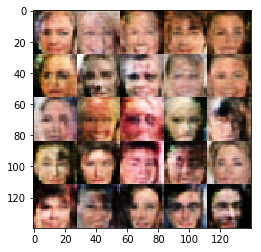

Epoch 1/5... Discriminator Loss: 1.3924... Generator Loss: 0.6037
Epoch 1/5... Discriminator Loss: 1.4292... Generator Loss: 0.7406
Epoch 1/5... Discriminator Loss: 1.1499... Generator Loss: 0.9284
Epoch 1/5... Discriminator Loss: 1.5204... Generator Loss: 0.4324
Epoch 1/5... Discriminator Loss: 1.5087... Generator Loss: 0.6799
Epoch 1/5... Discriminator Loss: 1.4879... Generator Loss: 0.4296
Epoch 1/5... Discriminator Loss: 1.4616... Generator Loss: 0.5332
Epoch 1/5... Discriminator Loss: 1.4323... Generator Loss: 0.6189
Epoch 1/5... Discriminator Loss: 1.2196... Generator Loss: 1.2808
Epoch 1/5... Discriminator Loss: 1.4098... Generator Loss: 0.5995


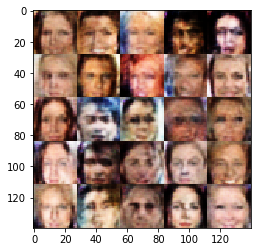

Epoch 1/5... Discriminator Loss: 1.0675... Generator Loss: 1.2336
Epoch 1/5... Discriminator Loss: 1.3900... Generator Loss: 0.5743
Epoch 1/5... Discriminator Loss: 1.4229... Generator Loss: 0.4891
Epoch 1/5... Discriminator Loss: 1.5371... Generator Loss: 0.4216
Epoch 1/5... Discriminator Loss: 1.5365... Generator Loss: 0.4853
Epoch 1/5... Discriminator Loss: 1.5321... Generator Loss: 0.4401
Epoch 1/5... Discriminator Loss: 1.3890... Generator Loss: 0.6232
Epoch 1/5... Discriminator Loss: 1.4063... Generator Loss: 0.4995
Epoch 1/5... Discriminator Loss: 1.3807... Generator Loss: 0.7198
Epoch 1/5... Discriminator Loss: 1.4544... Generator Loss: 0.4461


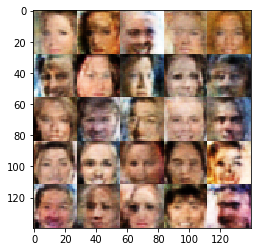

Epoch 1/5... Discriminator Loss: 1.1346... Generator Loss: 1.6210
Epoch 1/5... Discriminator Loss: 1.3654... Generator Loss: 0.5994
Epoch 1/5... Discriminator Loss: 1.3872... Generator Loss: 0.8031
Epoch 1/5... Discriminator Loss: 1.0619... Generator Loss: 1.0724
Epoch 1/5... Discriminator Loss: 1.3337... Generator Loss: 0.5608
Epoch 1/5... Discriminator Loss: 1.6696... Generator Loss: 0.2859
Epoch 1/5... Discriminator Loss: 1.3303... Generator Loss: 0.6098
Epoch 1/5... Discriminator Loss: 1.3442... Generator Loss: 0.6643
Epoch 1/5... Discriminator Loss: 1.4464... Generator Loss: 0.6082
Epoch 1/5... Discriminator Loss: 1.3877... Generator Loss: 0.6009


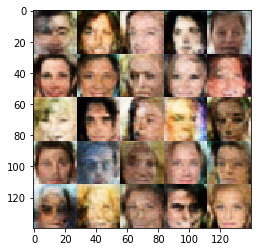

Epoch 1/5... Discriminator Loss: 1.2670... Generator Loss: 0.8418
Epoch 1/5... Discriminator Loss: 1.3712... Generator Loss: 0.6466
Epoch 1/5... Discriminator Loss: 1.0646... Generator Loss: 1.0830
Epoch 1/5... Discriminator Loss: 1.6502... Generator Loss: 0.3613
Epoch 1/5... Discriminator Loss: 1.4917... Generator Loss: 0.7900
Epoch 1/5... Discriminator Loss: 1.3879... Generator Loss: 0.5422
Epoch 1/5... Discriminator Loss: 1.3333... Generator Loss: 0.6965
Epoch 1/5... Discriminator Loss: 1.4201... Generator Loss: 0.5287
Epoch 1/5... Discriminator Loss: 1.3778... Generator Loss: 0.5150
Epoch 1/5... Discriminator Loss: 1.3268... Generator Loss: 0.5719


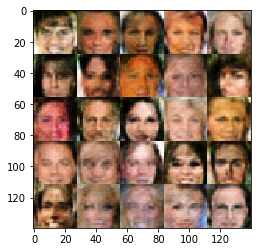

Epoch 1/5... Discriminator Loss: 1.6064... Generator Loss: 0.3389
Epoch 1/5... Discriminator Loss: 1.2110... Generator Loss: 0.6582
Epoch 1/5... Discriminator Loss: 1.2473... Generator Loss: 0.8594
Epoch 1/5... Discriminator Loss: 1.2184... Generator Loss: 1.0370
Epoch 1/5... Discriminator Loss: 1.5864... Generator Loss: 0.3874
Epoch 1/5... Discriminator Loss: 1.4542... Generator Loss: 0.7083
Epoch 1/5... Discriminator Loss: 1.5488... Generator Loss: 0.4026
Epoch 1/5... Discriminator Loss: 1.2727... Generator Loss: 0.6810
Epoch 1/5... Discriminator Loss: 1.5360... Generator Loss: 0.6618
Epoch 1/5... Discriminator Loss: 1.2735... Generator Loss: 0.5607


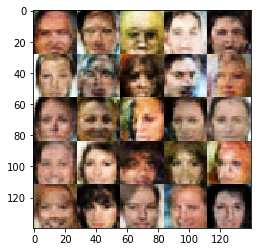

Epoch 1/5... Discriminator Loss: 1.1622... Generator Loss: 0.7811
Epoch 1/5... Discriminator Loss: 1.2805... Generator Loss: 0.6261
Epoch 1/5... Discriminator Loss: 1.1794... Generator Loss: 0.8126
Epoch 1/5... Discriminator Loss: 1.2952... Generator Loss: 0.6124
Epoch 1/5... Discriminator Loss: 1.5305... Generator Loss: 0.4205
Epoch 1/5... Discriminator Loss: 1.5743... Generator Loss: 0.3623
Epoch 1/5... Discriminator Loss: 1.1022... Generator Loss: 0.9166
Epoch 1/5... Discriminator Loss: 1.2063... Generator Loss: 0.7186
Epoch 1/5... Discriminator Loss: 1.2599... Generator Loss: 0.6589
Epoch 1/5... Discriminator Loss: 1.4040... Generator Loss: 0.6209


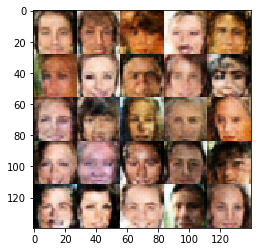

Epoch 1/5... Discriminator Loss: 1.4125... Generator Loss: 0.4999
Epoch 1/5... Discriminator Loss: 1.3488... Generator Loss: 0.6136
Epoch 1/5... Discriminator Loss: 1.1380... Generator Loss: 0.8666
Epoch 1/5... Discriminator Loss: 1.3682... Generator Loss: 0.6038
Epoch 1/5... Discriminator Loss: 1.2344... Generator Loss: 0.6853
Epoch 1/5... Discriminator Loss: 1.1675... Generator Loss: 0.7092
Epoch 1/5... Discriminator Loss: 1.3267... Generator Loss: 0.5306
Epoch 1/5... Discriminator Loss: 1.1658... Generator Loss: 0.8100
Epoch 1/5... Discriminator Loss: 1.3182... Generator Loss: 0.6191
Epoch 1/5... Discriminator Loss: 1.3259... Generator Loss: 0.8833


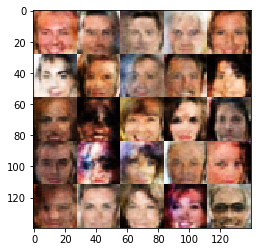

Epoch 1/5... Discriminator Loss: 1.3493... Generator Loss: 0.6149
Epoch 1/5... Discriminator Loss: 1.2992... Generator Loss: 0.9793
Epoch 1/5... Discriminator Loss: 1.6941... Generator Loss: 0.2788
Epoch 1/5... Discriminator Loss: 1.3629... Generator Loss: 0.5461
Epoch 1/5... Discriminator Loss: 1.2401... Generator Loss: 0.5752
Epoch 1/5... Discriminator Loss: 1.1586... Generator Loss: 0.8679
Epoch 1/5... Discriminator Loss: 1.3769... Generator Loss: 0.4474
Epoch 1/5... Discriminator Loss: 1.2201... Generator Loss: 0.9047
Epoch 1/5... Discriminator Loss: 1.0426... Generator Loss: 0.9732
Epoch 1/5... Discriminator Loss: 1.1254... Generator Loss: 0.8399


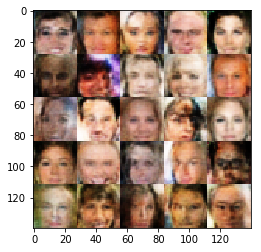

Epoch 1/5... Discriminator Loss: 1.8243... Generator Loss: 0.2392
Epoch 1/5... Discriminator Loss: 1.0098... Generator Loss: 0.9391
Epoch 1/5... Discriminator Loss: 1.3458... Generator Loss: 0.9720
Epoch 1/5... Discriminator Loss: 1.5968... Generator Loss: 0.3572
Epoch 1/5... Discriminator Loss: 1.5070... Generator Loss: 0.3428
Epoch 1/5... Discriminator Loss: 1.4758... Generator Loss: 0.4555
Epoch 1/5... Discriminator Loss: 1.4385... Generator Loss: 0.5337
Epoch 1/5... Discriminator Loss: 1.3573... Generator Loss: 0.4335
Epoch 1/5... Discriminator Loss: 0.9479... Generator Loss: 2.3541
Epoch 1/5... Discriminator Loss: 1.7827... Generator Loss: 0.2406


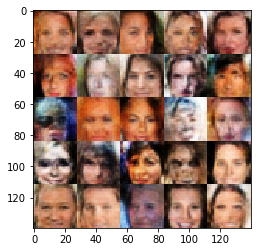

Epoch 1/5... Discriminator Loss: 0.9337... Generator Loss: 1.7546
Epoch 1/5... Discriminator Loss: 1.4362... Generator Loss: 0.3854
Epoch 1/5... Discriminator Loss: 0.8963... Generator Loss: 1.2993
Epoch 1/5... Discriminator Loss: 1.3662... Generator Loss: 0.5551
Epoch 1/5... Discriminator Loss: 1.6631... Generator Loss: 0.2952
Epoch 1/5... Discriminator Loss: 1.1908... Generator Loss: 0.7243
Epoch 1/5... Discriminator Loss: 1.1090... Generator Loss: 0.6870
Epoch 1/5... Discriminator Loss: 1.8003... Generator Loss: 0.2298
Epoch 1/5... Discriminator Loss: 1.2327... Generator Loss: 0.5771
Epoch 1/5... Discriminator Loss: 1.2864... Generator Loss: 1.0985


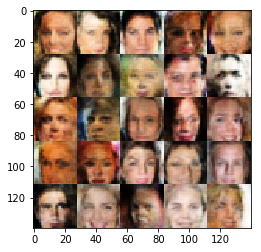

Epoch 1/5... Discriminator Loss: 1.3829... Generator Loss: 0.6195
Epoch 1/5... Discriminator Loss: 1.0851... Generator Loss: 0.8496
Epoch 1/5... Discriminator Loss: 1.1297... Generator Loss: 0.8324
Epoch 1/5... Discriminator Loss: 1.2015... Generator Loss: 0.7312
Epoch 1/5... Discriminator Loss: 1.2698... Generator Loss: 0.6369
Epoch 1/5... Discriminator Loss: 1.5924... Generator Loss: 0.2871
Epoch 1/5... Discriminator Loss: 0.8345... Generator Loss: 2.0555
Epoch 1/5... Discriminator Loss: 0.9923... Generator Loss: 0.8231
Epoch 1/5... Discriminator Loss: 0.9790... Generator Loss: 1.0328
Epoch 1/5... Discriminator Loss: 1.1833... Generator Loss: 0.7422


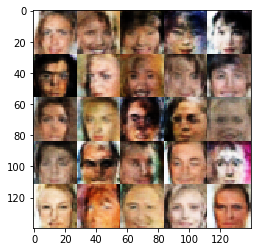

Epoch 1/5... Discriminator Loss: 1.2882... Generator Loss: 0.4435
Epoch 1/5... Discriminator Loss: 1.1680... Generator Loss: 0.6611
Epoch 1/5... Discriminator Loss: 1.6008... Generator Loss: 0.2809
Epoch 1/5... Discriminator Loss: 1.0237... Generator Loss: 0.7372
Epoch 1/5... Discriminator Loss: 1.0516... Generator Loss: 1.8532
Epoch 1/5... Discriminator Loss: 1.4539... Generator Loss: 0.4764
Epoch 1/5... Discriminator Loss: 1.1343... Generator Loss: 0.5633
Epoch 1/5... Discriminator Loss: 1.1636... Generator Loss: 1.1660
Epoch 1/5... Discriminator Loss: 1.5416... Generator Loss: 0.2943
Epoch 1/5... Discriminator Loss: 1.1536... Generator Loss: 0.9960


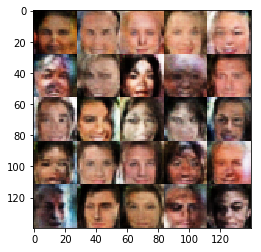

Epoch 1/5... Discriminator Loss: 0.9769... Generator Loss: 0.9596
Epoch 1/5... Discriminator Loss: 1.6185... Generator Loss: 0.2853
Epoch 1/5... Discriminator Loss: 0.7700... Generator Loss: 1.7668
Epoch 1/5... Discriminator Loss: 0.9477... Generator Loss: 1.0873
Epoch 1/5... Discriminator Loss: 1.6034... Generator Loss: 0.2956
Epoch 1/5... Discriminator Loss: 0.7789... Generator Loss: 1.5517
Epoch 1/5... Discriminator Loss: 1.3187... Generator Loss: 0.4432
Epoch 1/5... Discriminator Loss: 1.2856... Generator Loss: 0.4547
Epoch 1/5... Discriminator Loss: 1.1810... Generator Loss: 0.6504
Epoch 1/5... Discriminator Loss: 0.7516... Generator Loss: 1.2594


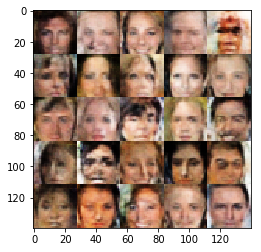

Epoch 1/5... Discriminator Loss: 1.3063... Generator Loss: 0.4364
Epoch 1/5... Discriminator Loss: 0.6721... Generator Loss: 1.4875
Epoch 1/5... Discriminator Loss: 1.7074... Generator Loss: 1.2228
Epoch 1/5... Discriminator Loss: 0.7145... Generator Loss: 1.1488
Epoch 1/5... Discriminator Loss: 1.3074... Generator Loss: 0.4719
Epoch 1/5... Discriminator Loss: 1.4882... Generator Loss: 0.3433
Epoch 1/5... Discriminator Loss: 0.9078... Generator Loss: 0.7492
Epoch 1/5... Discriminator Loss: 0.5984... Generator Loss: 2.3188
Epoch 1/5... Discriminator Loss: 0.8545... Generator Loss: 1.7190
Epoch 1/5... Discriminator Loss: 0.7797... Generator Loss: 0.8963


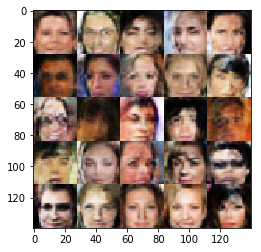

Epoch 1/5... Discriminator Loss: 1.0495... Generator Loss: 0.6410
Epoch 1/5... Discriminator Loss: 0.8903... Generator Loss: 0.7524
Epoch 1/5... Discriminator Loss: 1.1966... Generator Loss: 0.4936
Epoch 1/5... Discriminator Loss: 1.5314... Generator Loss: 0.3390
Epoch 1/5... Discriminator Loss: 1.4349... Generator Loss: 0.3338
Epoch 1/5... Discriminator Loss: 1.1539... Generator Loss: 0.6003
Epoch 1/5... Discriminator Loss: 0.6842... Generator Loss: 1.6445
Epoch 1/5... Discriminator Loss: 0.5712... Generator Loss: 2.5368
Epoch 1/5... Discriminator Loss: 1.2706... Generator Loss: 0.4881
Epoch 1/5... Discriminator Loss: 0.6031... Generator Loss: 1.7419


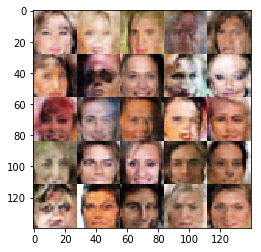

Epoch 1/5... Discriminator Loss: 1.6024... Generator Loss: 0.2918
Epoch 1/5... Discriminator Loss: 1.2966... Generator Loss: 0.4280
Epoch 1/5... Discriminator Loss: 0.5482... Generator Loss: 1.8865
Epoch 1/5... Discriminator Loss: 1.5978... Generator Loss: 0.2694
Epoch 1/5... Discriminator Loss: 1.5678... Generator Loss: 0.2999
Epoch 1/5... Discriminator Loss: 1.0603... Generator Loss: 0.6415
Epoch 1/5... Discriminator Loss: 1.3278... Generator Loss: 0.4053
Epoch 1/5... Discriminator Loss: 0.9046... Generator Loss: 0.9950
Epoch 1/5... Discriminator Loss: 1.2401... Generator Loss: 0.4899
Epoch 1/5... Discriminator Loss: 0.7443... Generator Loss: 1.1287


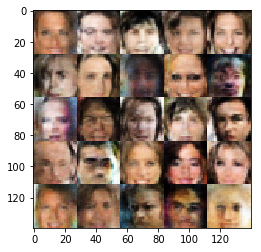

Epoch 1/5... Discriminator Loss: 1.1121... Generator Loss: 0.5201
Epoch 1/5... Discriminator Loss: 0.6898... Generator Loss: 0.9953
Epoch 1/5... Discriminator Loss: 1.0995... Generator Loss: 0.9362
Epoch 1/5... Discriminator Loss: 1.2944... Generator Loss: 0.5634
Epoch 1/5... Discriminator Loss: 1.4718... Generator Loss: 0.3409
Epoch 1/5... Discriminator Loss: 0.5224... Generator Loss: 1.5351
Epoch 1/5... Discriminator Loss: 0.9681... Generator Loss: 1.3292
Epoch 1/5... Discriminator Loss: 0.8537... Generator Loss: 1.0071
Epoch 1/5... Discriminator Loss: 0.7783... Generator Loss: 1.2044
Epoch 1/5... Discriminator Loss: 1.1796... Generator Loss: 0.5983


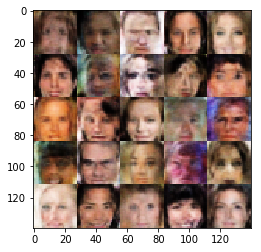

Epoch 1/5... Discriminator Loss: 1.0372... Generator Loss: 0.5970
Epoch 1/5... Discriminator Loss: 1.5641... Generator Loss: 0.3204
Epoch 1/5... Discriminator Loss: 0.6536... Generator Loss: 1.4862
Epoch 1/5... Discriminator Loss: 1.6852... Generator Loss: 0.2695
Epoch 1/5... Discriminator Loss: 1.5799... Generator Loss: 0.3388
Epoch 1/5... Discriminator Loss: 1.3293... Generator Loss: 0.8691
Epoch 1/5... Discriminator Loss: 1.3602... Generator Loss: 0.4661
Epoch 1/5... Discriminator Loss: 1.0098... Generator Loss: 0.6649
Epoch 1/5... Discriminator Loss: 0.6604... Generator Loss: 0.9994
Epoch 1/5... Discriminator Loss: 1.3330... Generator Loss: 0.4707


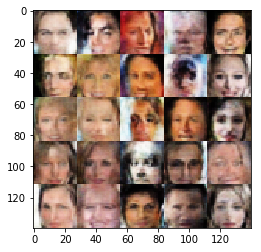

Epoch 1/5... Discriminator Loss: 0.8592... Generator Loss: 1.8857
Epoch 1/5... Discriminator Loss: 1.0027... Generator Loss: 0.6393
Epoch 1/5... Discriminator Loss: 0.9124... Generator Loss: 1.7061
Epoch 1/5... Discriminator Loss: 1.6897... Generator Loss: 0.2639
Epoch 1/5... Discriminator Loss: 0.8816... Generator Loss: 0.7737
Epoch 1/5... Discriminator Loss: 1.0020... Generator Loss: 0.6109
Epoch 1/5... Discriminator Loss: 1.8441... Generator Loss: 0.2418
Epoch 1/5... Discriminator Loss: 0.6434... Generator Loss: 1.8978
Epoch 1/5... Discriminator Loss: 1.2177... Generator Loss: 1.7788
Epoch 1/5... Discriminator Loss: 1.1605... Generator Loss: 0.5867


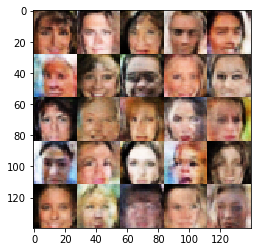

Epoch 1/5... Discriminator Loss: 2.8891... Generator Loss: 1.5732
Epoch 1/5... Discriminator Loss: 1.0671... Generator Loss: 0.7817
Epoch 1/5... Discriminator Loss: 1.1318... Generator Loss: 0.5953
Epoch 1/5... Discriminator Loss: 0.7031... Generator Loss: 1.3479
Epoch 1/5... Discriminator Loss: 0.4604... Generator Loss: 1.3824
Epoch 1/5... Discriminator Loss: 0.8497... Generator Loss: 0.8676
Epoch 1/5... Discriminator Loss: 0.4291... Generator Loss: 1.7119
Epoch 1/5... Discriminator Loss: 0.5490... Generator Loss: 1.8355
Epoch 1/5... Discriminator Loss: 0.9723... Generator Loss: 0.6765
Epoch 1/5... Discriminator Loss: 0.5696... Generator Loss: 2.2562


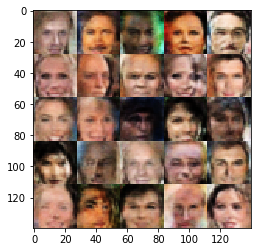

Epoch 1/5... Discriminator Loss: 1.8147... Generator Loss: 0.2245
Epoch 1/5... Discriminator Loss: 0.6316... Generator Loss: 2.0120
Epoch 1/5... Discriminator Loss: 0.8861... Generator Loss: 0.9782
Epoch 1/5... Discriminator Loss: 0.8552... Generator Loss: 0.7864
Epoch 1/5... Discriminator Loss: 0.9142... Generator Loss: 0.6571
Epoch 1/5... Discriminator Loss: 1.3966... Generator Loss: 0.3701
Epoch 1/5... Discriminator Loss: 0.6961... Generator Loss: 0.9866
Epoch 1/5... Discriminator Loss: 1.9387... Generator Loss: 0.2070
Epoch 1/5... Discriminator Loss: 0.9104... Generator Loss: 1.1145
Epoch 1/5... Discriminator Loss: 1.2595... Generator Loss: 0.4616


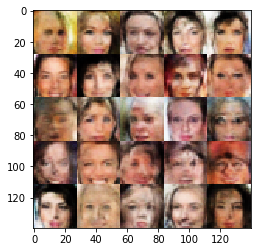

Epoch 1/5... Discriminator Loss: 1.2777... Generator Loss: 0.4304
Epoch 1/5... Discriminator Loss: 1.2279... Generator Loss: 0.4964
Epoch 1/5... Discriminator Loss: 1.5189... Generator Loss: 0.3267
Epoch 2/5... Discriminator Loss: 2.5012... Generator Loss: 0.1284
Epoch 2/5... Discriminator Loss: 1.1277... Generator Loss: 0.6162
Epoch 2/5... Discriminator Loss: 0.9680... Generator Loss: 0.6582
Epoch 2/5... Discriminator Loss: 0.2736... Generator Loss: 2.6332
Epoch 2/5... Discriminator Loss: 0.5966... Generator Loss: 1.6005
Epoch 2/5... Discriminator Loss: 0.5538... Generator Loss: 1.5957
Epoch 2/5... Discriminator Loss: 0.6405... Generator Loss: 2.5715


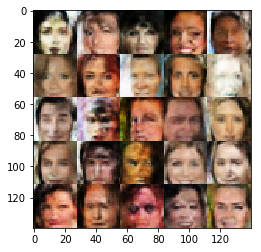

Epoch 2/5... Discriminator Loss: 1.7869... Generator Loss: 0.2402
Epoch 2/5... Discriminator Loss: 0.9033... Generator Loss: 0.7136
Epoch 2/5... Discriminator Loss: 0.3883... Generator Loss: 3.6455
Epoch 2/5... Discriminator Loss: 0.8363... Generator Loss: 1.0208
Epoch 2/5... Discriminator Loss: 1.8861... Generator Loss: 0.2032
Epoch 2/5... Discriminator Loss: 1.1348... Generator Loss: 0.5161
Epoch 2/5... Discriminator Loss: 0.6743... Generator Loss: 1.0928
Epoch 2/5... Discriminator Loss: 0.7275... Generator Loss: 0.8549
Epoch 2/5... Discriminator Loss: 3.9272... Generator Loss: 3.5074
Epoch 2/5... Discriminator Loss: 0.9951... Generator Loss: 0.7161


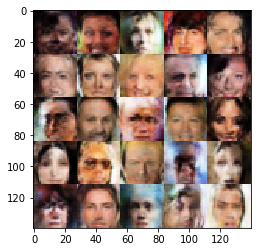

Epoch 2/5... Discriminator Loss: 1.1532... Generator Loss: 0.5895
Epoch 2/5... Discriminator Loss: 1.0438... Generator Loss: 0.5897
Epoch 2/5... Discriminator Loss: 0.8208... Generator Loss: 0.9681
Epoch 2/5... Discriminator Loss: 1.1319... Generator Loss: 0.5491
Epoch 2/5... Discriminator Loss: 0.8206... Generator Loss: 0.7408
Epoch 2/5... Discriminator Loss: 1.0836... Generator Loss: 0.8316
Epoch 2/5... Discriminator Loss: 0.9305... Generator Loss: 0.6984
Epoch 2/5... Discriminator Loss: 0.8166... Generator Loss: 0.8743
Epoch 2/5... Discriminator Loss: 0.6657... Generator Loss: 1.0110
Epoch 2/5... Discriminator Loss: 0.6867... Generator Loss: 1.0115


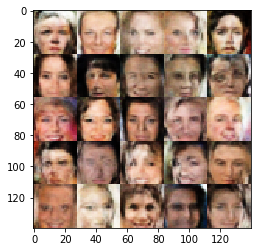

Epoch 2/5... Discriminator Loss: 0.2838... Generator Loss: 3.0655
Epoch 2/5... Discriminator Loss: 1.1687... Generator Loss: 0.5201
Epoch 2/5... Discriminator Loss: 1.3191... Generator Loss: 0.4184
Epoch 2/5... Discriminator Loss: 1.0344... Generator Loss: 0.7406
Epoch 2/5... Discriminator Loss: 0.8938... Generator Loss: 1.2761
Epoch 2/5... Discriminator Loss: 1.2985... Generator Loss: 0.4137
Epoch 2/5... Discriminator Loss: 1.5967... Generator Loss: 0.3032
Epoch 2/5... Discriminator Loss: 1.6602... Generator Loss: 0.2830
Epoch 2/5... Discriminator Loss: 1.0298... Generator Loss: 0.5980
Epoch 2/5... Discriminator Loss: 1.3593... Generator Loss: 0.4165


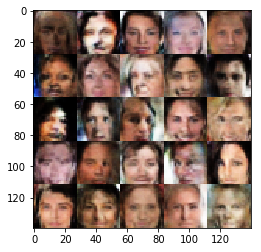

Epoch 2/5... Discriminator Loss: 2.1301... Generator Loss: 2.3566
Epoch 2/5... Discriminator Loss: 1.0253... Generator Loss: 0.7233
Epoch 2/5... Discriminator Loss: 0.8652... Generator Loss: 0.8140
Epoch 2/5... Discriminator Loss: 0.7864... Generator Loss: 1.0804
Epoch 2/5... Discriminator Loss: 1.6507... Generator Loss: 0.2768
Epoch 2/5... Discriminator Loss: 0.9453... Generator Loss: 0.6389
Epoch 2/5... Discriminator Loss: 0.6248... Generator Loss: 1.1133
Epoch 2/5... Discriminator Loss: 0.7965... Generator Loss: 0.8037
Epoch 2/5... Discriminator Loss: 1.2077... Generator Loss: 0.4552
Epoch 2/5... Discriminator Loss: 0.7332... Generator Loss: 0.9245


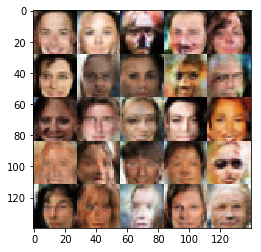

Epoch 2/5... Discriminator Loss: 1.5906... Generator Loss: 0.3059
Epoch 2/5... Discriminator Loss: 2.1414... Generator Loss: 0.1601
Epoch 2/5... Discriminator Loss: 0.9730... Generator Loss: 0.6723
Epoch 2/5... Discriminator Loss: 1.6629... Generator Loss: 0.3033
Epoch 2/5... Discriminator Loss: 1.0010... Generator Loss: 1.3181
Epoch 2/5... Discriminator Loss: 0.6935... Generator Loss: 1.1930
Epoch 2/5... Discriminator Loss: 0.5553... Generator Loss: 1.1719
Epoch 2/5... Discriminator Loss: 1.7658... Generator Loss: 1.5530
Epoch 2/5... Discriminator Loss: 1.2987... Generator Loss: 0.4219
Epoch 2/5... Discriminator Loss: 0.8750... Generator Loss: 0.8251


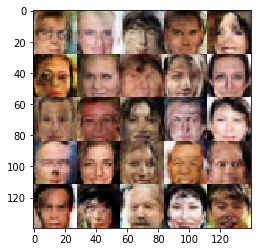

Epoch 2/5... Discriminator Loss: 1.0022... Generator Loss: 1.2335
Epoch 2/5... Discriminator Loss: 0.8088... Generator Loss: 0.8776
Epoch 2/5... Discriminator Loss: 1.1843... Generator Loss: 0.5210
Epoch 2/5... Discriminator Loss: 1.3057... Generator Loss: 0.4568
Epoch 2/5... Discriminator Loss: 1.0039... Generator Loss: 0.6338
Epoch 2/5... Discriminator Loss: 1.1478... Generator Loss: 0.5056
Epoch 2/5... Discriminator Loss: 1.5524... Generator Loss: 0.3098
Epoch 2/5... Discriminator Loss: 1.3982... Generator Loss: 0.4162
Epoch 2/5... Discriminator Loss: 0.4824... Generator Loss: 1.3260
Epoch 2/5... Discriminator Loss: 1.4122... Generator Loss: 0.3629


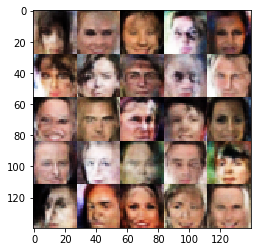

Epoch 2/5... Discriminator Loss: 1.1604... Generator Loss: 0.8644
Epoch 2/5... Discriminator Loss: 0.8330... Generator Loss: 0.8761
Epoch 2/5... Discriminator Loss: 1.5802... Generator Loss: 0.2918
Epoch 2/5... Discriminator Loss: 0.6538... Generator Loss: 1.0166
Epoch 2/5... Discriminator Loss: 1.6318... Generator Loss: 0.2718
Epoch 2/5... Discriminator Loss: 1.1644... Generator Loss: 0.4998
Epoch 2/5... Discriminator Loss: 0.9645... Generator Loss: 0.6531
Epoch 2/5... Discriminator Loss: 1.3038... Generator Loss: 0.4154
Epoch 2/5... Discriminator Loss: 1.5818... Generator Loss: 0.3514
Epoch 2/5... Discriminator Loss: 1.4885... Generator Loss: 0.3455


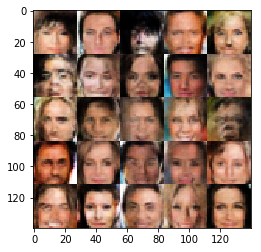

Epoch 2/5... Discriminator Loss: 0.4022... Generator Loss: 1.7122
Epoch 2/5... Discriminator Loss: 0.3176... Generator Loss: 2.1100
Epoch 2/5... Discriminator Loss: 1.3411... Generator Loss: 0.4262
Epoch 2/5... Discriminator Loss: 0.9097... Generator Loss: 0.7063
Epoch 2/5... Discriminator Loss: 1.4885... Generator Loss: 0.3185
Epoch 2/5... Discriminator Loss: 2.5228... Generator Loss: 4.4162
Epoch 2/5... Discriminator Loss: 1.2223... Generator Loss: 0.7875
Epoch 2/5... Discriminator Loss: 1.3329... Generator Loss: 0.4056
Epoch 2/5... Discriminator Loss: 1.1047... Generator Loss: 0.6554
Epoch 2/5... Discriminator Loss: 1.4343... Generator Loss: 0.3691


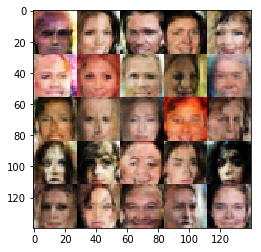

Epoch 2/5... Discriminator Loss: 0.7518... Generator Loss: 0.8668
Epoch 2/5... Discriminator Loss: 1.0181... Generator Loss: 0.6683
Epoch 2/5... Discriminator Loss: 1.4664... Generator Loss: 0.3713
Epoch 2/5... Discriminator Loss: 1.2548... Generator Loss: 0.4671
Epoch 2/5... Discriminator Loss: 0.7280... Generator Loss: 1.2040
Epoch 2/5... Discriminator Loss: 1.3973... Generator Loss: 0.4019
Epoch 2/5... Discriminator Loss: 1.9373... Generator Loss: 0.1925
Epoch 2/5... Discriminator Loss: 0.9723... Generator Loss: 0.6500
Epoch 2/5... Discriminator Loss: 1.1276... Generator Loss: 0.5081
Epoch 2/5... Discriminator Loss: 1.4495... Generator Loss: 0.3445


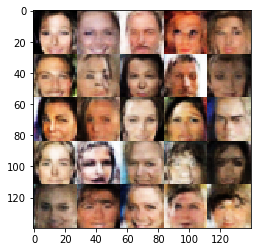

Epoch 2/5... Discriminator Loss: 0.3520... Generator Loss: 1.9955
Epoch 2/5... Discriminator Loss: 0.9768... Generator Loss: 0.6440
Epoch 2/5... Discriminator Loss: 0.8355... Generator Loss: 0.7511
Epoch 2/5... Discriminator Loss: 0.5023... Generator Loss: 1.1711
Epoch 2/5... Discriminator Loss: 0.3472... Generator Loss: 1.8558
Epoch 2/5... Discriminator Loss: 1.7312... Generator Loss: 0.2461
Epoch 2/5... Discriminator Loss: 1.2481... Generator Loss: 0.4466
Epoch 2/5... Discriminator Loss: 1.3839... Generator Loss: 0.4014
Epoch 2/5... Discriminator Loss: 0.7465... Generator Loss: 2.4507
Epoch 2/5... Discriminator Loss: 1.5223... Generator Loss: 0.4560


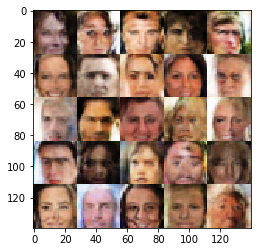

Epoch 2/5... Discriminator Loss: 1.0718... Generator Loss: 0.6107
Epoch 2/5... Discriminator Loss: 1.0136... Generator Loss: 0.6269
Epoch 2/5... Discriminator Loss: 1.1716... Generator Loss: 0.4939
Epoch 2/5... Discriminator Loss: 1.3109... Generator Loss: 0.4558
Epoch 2/5... Discriminator Loss: 1.0562... Generator Loss: 0.5640
Epoch 2/5... Discriminator Loss: 0.4370... Generator Loss: 2.1500
Epoch 2/5... Discriminator Loss: 0.5849... Generator Loss: 1.1974
Epoch 2/5... Discriminator Loss: 1.4991... Generator Loss: 0.3439
Epoch 2/5... Discriminator Loss: 0.7039... Generator Loss: 1.0793
Epoch 2/5... Discriminator Loss: 0.8145... Generator Loss: 0.8760


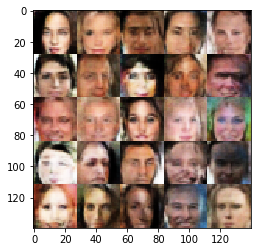

Epoch 2/5... Discriminator Loss: 0.6906... Generator Loss: 0.9800
Epoch 2/5... Discriminator Loss: 0.2664... Generator Loss: 3.1259
Epoch 2/5... Discriminator Loss: 0.3086... Generator Loss: 2.3107
Epoch 2/5... Discriminator Loss: 1.4159... Generator Loss: 0.3927
Epoch 2/5... Discriminator Loss: 1.4083... Generator Loss: 0.3836
Epoch 2/5... Discriminator Loss: 0.9310... Generator Loss: 0.8120
Epoch 2/5... Discriminator Loss: 1.1076... Generator Loss: 0.5529
Epoch 2/5... Discriminator Loss: 1.0019... Generator Loss: 0.7721
Epoch 2/5... Discriminator Loss: 3.5516... Generator Loss: 0.0800
Epoch 2/5... Discriminator Loss: 1.2420... Generator Loss: 0.5933


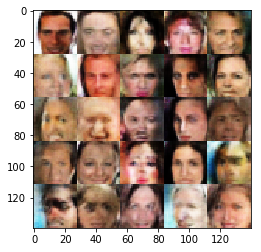

Epoch 2/5... Discriminator Loss: 0.8169... Generator Loss: 0.8953
Epoch 2/5... Discriminator Loss: 0.6418... Generator Loss: 1.2152
Epoch 2/5... Discriminator Loss: 0.9227... Generator Loss: 0.6949
Epoch 2/5... Discriminator Loss: 0.8916... Generator Loss: 0.9925
Epoch 2/5... Discriminator Loss: 1.2933... Generator Loss: 0.4275
Epoch 2/5... Discriminator Loss: 1.3107... Generator Loss: 0.4128
Epoch 2/5... Discriminator Loss: 0.8940... Generator Loss: 0.7285
Epoch 2/5... Discriminator Loss: 1.3295... Generator Loss: 0.6435
Epoch 2/5... Discriminator Loss: 1.7739... Generator Loss: 0.2365
Epoch 2/5... Discriminator Loss: 0.7845... Generator Loss: 0.8748


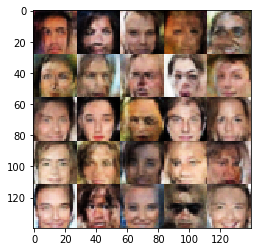

Epoch 2/5... Discriminator Loss: 1.5889... Generator Loss: 0.3211
Epoch 2/5... Discriminator Loss: 0.7986... Generator Loss: 0.8580
Epoch 2/5... Discriminator Loss: 1.1102... Generator Loss: 0.5140
Epoch 2/5... Discriminator Loss: 1.3354... Generator Loss: 0.3904
Epoch 2/5... Discriminator Loss: 1.5707... Generator Loss: 0.3171
Epoch 2/5... Discriminator Loss: 0.9914... Generator Loss: 0.6823
Epoch 2/5... Discriminator Loss: 0.9283... Generator Loss: 0.6832
Epoch 2/5... Discriminator Loss: 1.4754... Generator Loss: 0.3593
Epoch 2/5... Discriminator Loss: 1.1325... Generator Loss: 1.8959
Epoch 2/5... Discriminator Loss: 1.0665... Generator Loss: 0.6116


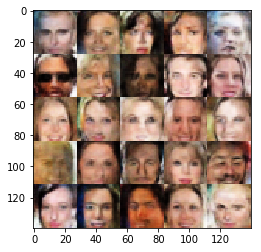

Epoch 2/5... Discriminator Loss: 0.6977... Generator Loss: 0.9374
Epoch 2/5... Discriminator Loss: 1.0426... Generator Loss: 0.6999
Epoch 2/5... Discriminator Loss: 0.9137... Generator Loss: 0.7204
Epoch 2/5... Discriminator Loss: 0.8744... Generator Loss: 0.7422
Epoch 2/5... Discriminator Loss: 1.2337... Generator Loss: 0.4954
Epoch 2/5... Discriminator Loss: 0.4823... Generator Loss: 1.3265
Epoch 2/5... Discriminator Loss: 1.0231... Generator Loss: 0.5855
Epoch 2/5... Discriminator Loss: 0.5011... Generator Loss: 1.3942
Epoch 2/5... Discriminator Loss: 1.3387... Generator Loss: 0.5068
Epoch 2/5... Discriminator Loss: 0.8125... Generator Loss: 0.7290


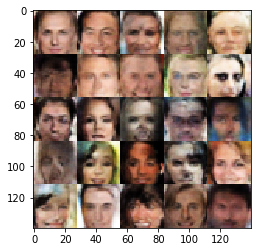

Epoch 2/5... Discriminator Loss: 0.8698... Generator Loss: 0.7312
Epoch 2/5... Discriminator Loss: 1.8343... Generator Loss: 0.2199
Epoch 2/5... Discriminator Loss: 0.6253... Generator Loss: 1.0600
Epoch 2/5... Discriminator Loss: 0.9458... Generator Loss: 0.7011
Epoch 2/5... Discriminator Loss: 0.5038... Generator Loss: 1.3800
Epoch 2/5... Discriminator Loss: 0.2915... Generator Loss: 2.5899
Epoch 2/5... Discriminator Loss: 0.5678... Generator Loss: 1.1005
Epoch 2/5... Discriminator Loss: 1.2263... Generator Loss: 0.4485
Epoch 2/5... Discriminator Loss: 1.9526... Generator Loss: 1.2946
Epoch 2/5... Discriminator Loss: 1.2630... Generator Loss: 0.8114


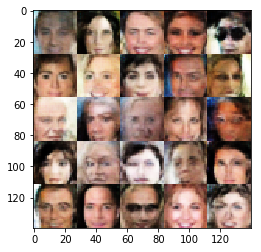

Epoch 2/5... Discriminator Loss: 1.2992... Generator Loss: 1.4708
Epoch 2/5... Discriminator Loss: 1.2936... Generator Loss: 1.2629
Epoch 2/5... Discriminator Loss: 0.9773... Generator Loss: 1.2531
Epoch 2/5... Discriminator Loss: 1.0256... Generator Loss: 1.3294
Epoch 2/5... Discriminator Loss: 1.0516... Generator Loss: 0.9329
Epoch 2/5... Discriminator Loss: 1.1601... Generator Loss: 0.5081
Epoch 2/5... Discriminator Loss: 0.7274... Generator Loss: 1.0166
Epoch 2/5... Discriminator Loss: 1.5015... Generator Loss: 0.3562
Epoch 2/5... Discriminator Loss: 1.7223... Generator Loss: 0.2990
Epoch 2/5... Discriminator Loss: 1.7116... Generator Loss: 0.2745


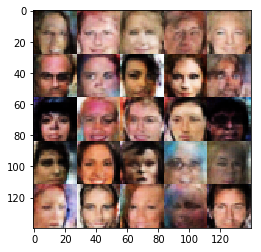

Epoch 2/5... Discriminator Loss: 0.7362... Generator Loss: 1.0512
Epoch 2/5... Discriminator Loss: 1.1318... Generator Loss: 0.5925
Epoch 2/5... Discriminator Loss: 1.4589... Generator Loss: 0.3450
Epoch 2/5... Discriminator Loss: 0.5317... Generator Loss: 1.2974
Epoch 2/5... Discriminator Loss: 0.5223... Generator Loss: 1.3489
Epoch 2/5... Discriminator Loss: 0.8822... Generator Loss: 0.9643
Epoch 2/5... Discriminator Loss: 0.5184... Generator Loss: 1.2697
Epoch 2/5... Discriminator Loss: 0.6548... Generator Loss: 1.0678
Epoch 2/5... Discriminator Loss: 1.0252... Generator Loss: 0.6515
Epoch 2/5... Discriminator Loss: 0.5149... Generator Loss: 1.3522


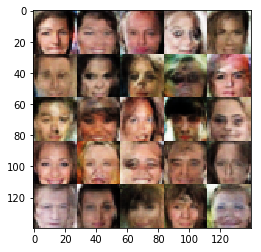

Epoch 2/5... Discriminator Loss: 0.5905... Generator Loss: 1.2274
Epoch 2/5... Discriminator Loss: 0.6491... Generator Loss: 0.9738
Epoch 2/5... Discriminator Loss: 0.9338... Generator Loss: 0.6705
Epoch 2/5... Discriminator Loss: 1.2334... Generator Loss: 0.4872
Epoch 2/5... Discriminator Loss: 1.1021... Generator Loss: 0.5125
Epoch 2/5... Discriminator Loss: 1.0940... Generator Loss: 0.5282
Epoch 2/5... Discriminator Loss: 1.2898... Generator Loss: 0.4431
Epoch 2/5... Discriminator Loss: 2.0675... Generator Loss: 0.2220
Epoch 2/5... Discriminator Loss: 1.2497... Generator Loss: 0.5059
Epoch 2/5... Discriminator Loss: 0.8484... Generator Loss: 0.9631


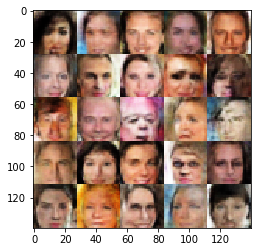

Epoch 2/5... Discriminator Loss: 1.2662... Generator Loss: 0.4758
Epoch 2/5... Discriminator Loss: 0.3341... Generator Loss: 1.9225
Epoch 2/5... Discriminator Loss: 0.5210... Generator Loss: 1.2826
Epoch 2/5... Discriminator Loss: 0.8105... Generator Loss: 0.8098
Epoch 2/5... Discriminator Loss: 0.4775... Generator Loss: 1.3510
Epoch 2/5... Discriminator Loss: 1.2216... Generator Loss: 0.5248
Epoch 2/5... Discriminator Loss: 1.5720... Generator Loss: 0.3366
Epoch 2/5... Discriminator Loss: 0.5577... Generator Loss: 1.1595
Epoch 2/5... Discriminator Loss: 1.5820... Generator Loss: 0.3049
Epoch 2/5... Discriminator Loss: 1.3672... Generator Loss: 0.3943


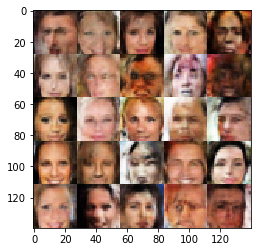

Epoch 2/5... Discriminator Loss: 0.3590... Generator Loss: 2.1308
Epoch 2/5... Discriminator Loss: 0.5022... Generator Loss: 1.3380
Epoch 2/5... Discriminator Loss: 1.2680... Generator Loss: 0.4445
Epoch 2/5... Discriminator Loss: 0.6428... Generator Loss: 1.8681
Epoch 2/5... Discriminator Loss: 0.7426... Generator Loss: 1.0307
Epoch 2/5... Discriminator Loss: 0.6336... Generator Loss: 1.0543
Epoch 2/5... Discriminator Loss: 0.4273... Generator Loss: 1.5491
Epoch 2/5... Discriminator Loss: 0.8543... Generator Loss: 0.7923
Epoch 2/5... Discriminator Loss: 0.8864... Generator Loss: 1.1439
Epoch 2/5... Discriminator Loss: 1.1405... Generator Loss: 0.6753


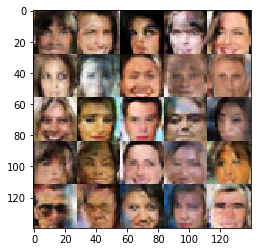

Epoch 2/5... Discriminator Loss: 1.4849... Generator Loss: 0.3430
Epoch 2/5... Discriminator Loss: 1.7845... Generator Loss: 0.2801
Epoch 2/5... Discriminator Loss: 0.8553... Generator Loss: 0.8557
Epoch 2/5... Discriminator Loss: 1.4907... Generator Loss: 0.3341
Epoch 2/5... Discriminator Loss: 1.4668... Generator Loss: 0.3534
Epoch 2/5... Discriminator Loss: 1.2268... Generator Loss: 0.4530
Epoch 2/5... Discriminator Loss: 1.6100... Generator Loss: 0.2903
Epoch 2/5... Discriminator Loss: 1.0625... Generator Loss: 0.5737
Epoch 2/5... Discriminator Loss: 1.1997... Generator Loss: 0.5037
Epoch 2/5... Discriminator Loss: 1.1734... Generator Loss: 0.5499


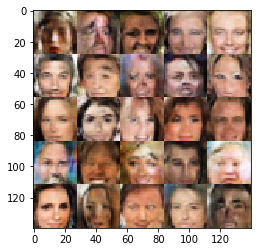

Epoch 2/5... Discriminator Loss: 0.3762... Generator Loss: 1.9191
Epoch 2/5... Discriminator Loss: 0.9559... Generator Loss: 0.6716
Epoch 2/5... Discriminator Loss: 0.6866... Generator Loss: 1.1325
Epoch 2/5... Discriminator Loss: 1.4072... Generator Loss: 0.3886
Epoch 2/5... Discriminator Loss: 0.3027... Generator Loss: 2.0959
Epoch 2/5... Discriminator Loss: 2.1512... Generator Loss: 0.1707
Epoch 2/5... Discriminator Loss: 0.9999... Generator Loss: 0.6292
Epoch 2/5... Discriminator Loss: 0.2791... Generator Loss: 1.9481
Epoch 2/5... Discriminator Loss: 0.8843... Generator Loss: 1.0587
Epoch 2/5... Discriminator Loss: 1.2201... Generator Loss: 0.4997


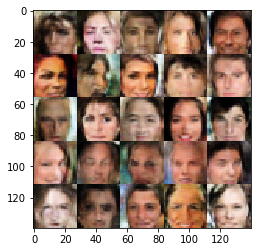

Epoch 2/5... Discriminator Loss: 0.9408... Generator Loss: 0.7337
Epoch 2/5... Discriminator Loss: 2.4162... Generator Loss: 0.1510
Epoch 2/5... Discriminator Loss: 1.3413... Generator Loss: 2.6595
Epoch 2/5... Discriminator Loss: 1.0797... Generator Loss: 1.9876
Epoch 2/5... Discriminator Loss: 1.1281... Generator Loss: 0.6165
Epoch 2/5... Discriminator Loss: 1.3175... Generator Loss: 0.4419
Epoch 2/5... Discriminator Loss: 1.1021... Generator Loss: 0.6048
Epoch 2/5... Discriminator Loss: 0.9770... Generator Loss: 0.6768
Epoch 2/5... Discriminator Loss: 1.6442... Generator Loss: 0.2924
Epoch 2/5... Discriminator Loss: 1.0105... Generator Loss: 0.6901


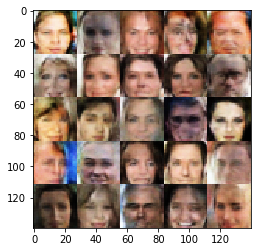

Epoch 2/5... Discriminator Loss: 1.0945... Generator Loss: 0.5728
Epoch 2/5... Discriminator Loss: 1.3831... Generator Loss: 0.3813
Epoch 2/5... Discriminator Loss: 1.4156... Generator Loss: 0.3915
Epoch 2/5... Discriminator Loss: 1.4249... Generator Loss: 0.3612
Epoch 2/5... Discriminator Loss: 1.9794... Generator Loss: 0.1834
Epoch 2/5... Discriminator Loss: 0.8662... Generator Loss: 0.7317
Epoch 2/5... Discriminator Loss: 0.6014... Generator Loss: 1.0572
Epoch 2/5... Discriminator Loss: 0.9271... Generator Loss: 0.7366
Epoch 2/5... Discriminator Loss: 1.5889... Generator Loss: 0.2971
Epoch 2/5... Discriminator Loss: 0.9792... Generator Loss: 0.6191


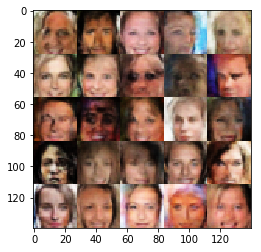

Epoch 2/5... Discriminator Loss: 1.4187... Generator Loss: 0.3487
Epoch 2/5... Discriminator Loss: 0.9572... Generator Loss: 0.6662
Epoch 2/5... Discriminator Loss: 1.5377... Generator Loss: 0.3422
Epoch 2/5... Discriminator Loss: 0.8019... Generator Loss: 2.0670
Epoch 2/5... Discriminator Loss: 0.6641... Generator Loss: 1.1095
Epoch 2/5... Discriminator Loss: 1.6022... Generator Loss: 0.3246
Epoch 2/5... Discriminator Loss: 1.1057... Generator Loss: 0.5895
Epoch 2/5... Discriminator Loss: 1.4887... Generator Loss: 0.3463
Epoch 2/5... Discriminator Loss: 1.3517... Generator Loss: 0.4149
Epoch 2/5... Discriminator Loss: 0.9661... Generator Loss: 0.6580


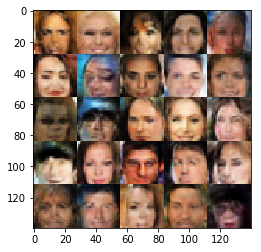

Epoch 2/5... Discriminator Loss: 0.8461... Generator Loss: 0.7725
Epoch 2/5... Discriminator Loss: 1.1598... Generator Loss: 0.5535
Epoch 2/5... Discriminator Loss: 1.9462... Generator Loss: 0.2052
Epoch 2/5... Discriminator Loss: 2.0647... Generator Loss: 0.1968
Epoch 2/5... Discriminator Loss: 0.7699... Generator Loss: 0.8936
Epoch 2/5... Discriminator Loss: 1.1933... Generator Loss: 0.4682
Epoch 2/5... Discriminator Loss: 0.8366... Generator Loss: 0.8017
Epoch 2/5... Discriminator Loss: 1.0506... Generator Loss: 0.6548
Epoch 2/5... Discriminator Loss: 1.4518... Generator Loss: 0.3503
Epoch 2/5... Discriminator Loss: 2.2563... Generator Loss: 2.8995


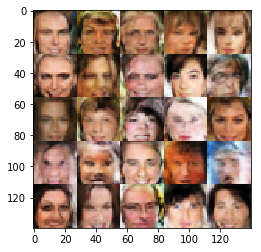

Epoch 2/5... Discriminator Loss: 0.9419... Generator Loss: 0.8659
Epoch 2/5... Discriminator Loss: 1.0224... Generator Loss: 0.6740
Epoch 2/5... Discriminator Loss: 0.9735... Generator Loss: 0.7448
Epoch 2/5... Discriminator Loss: 1.3598... Generator Loss: 0.4323
Epoch 2/5... Discriminator Loss: 0.8867... Generator Loss: 0.7349
Epoch 2/5... Discriminator Loss: 0.8009... Generator Loss: 0.8194
Epoch 2/5... Discriminator Loss: 1.6715... Generator Loss: 0.2883
Epoch 2/5... Discriminator Loss: 1.4223... Generator Loss: 0.3678
Epoch 2/5... Discriminator Loss: 0.4069... Generator Loss: 2.3141
Epoch 2/5... Discriminator Loss: 1.2728... Generator Loss: 0.4952


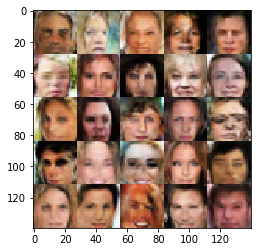

Epoch 2/5... Discriminator Loss: 0.8528... Generator Loss: 0.6931
Epoch 2/5... Discriminator Loss: 1.4792... Generator Loss: 0.3764
Epoch 2/5... Discriminator Loss: 0.9139... Generator Loss: 0.6851
Epoch 2/5... Discriminator Loss: 2.4873... Generator Loss: 3.5394
Epoch 2/5... Discriminator Loss: 0.7586... Generator Loss: 1.2617
Epoch 2/5... Discriminator Loss: 0.9985... Generator Loss: 0.8489
Epoch 2/5... Discriminator Loss: 1.5099... Generator Loss: 0.3706
Epoch 2/5... Discriminator Loss: 0.9273... Generator Loss: 0.6820
Epoch 2/5... Discriminator Loss: 1.2201... Generator Loss: 0.5168
Epoch 2/5... Discriminator Loss: 0.7711... Generator Loss: 0.9055


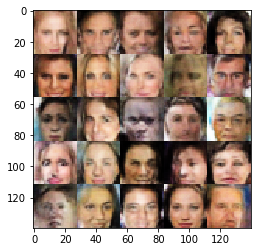

Epoch 2/5... Discriminator Loss: 1.2934... Generator Loss: 0.4526
Epoch 2/5... Discriminator Loss: 1.1876... Generator Loss: 0.5211
Epoch 2/5... Discriminator Loss: 0.8357... Generator Loss: 0.7416
Epoch 2/5... Discriminator Loss: 1.2820... Generator Loss: 0.4914
Epoch 2/5... Discriminator Loss: 0.7921... Generator Loss: 0.7848
Epoch 2/5... Discriminator Loss: 2.0916... Generator Loss: 0.1777
Epoch 2/5... Discriminator Loss: 0.4725... Generator Loss: 1.3308
Epoch 2/5... Discriminator Loss: 1.1001... Generator Loss: 0.5427
Epoch 2/5... Discriminator Loss: 1.8240... Generator Loss: 0.2362
Epoch 2/5... Discriminator Loss: 1.4641... Generator Loss: 0.3517


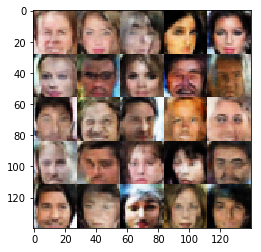

Epoch 2/5... Discriminator Loss: 0.6465... Generator Loss: 1.0441
Epoch 2/5... Discriminator Loss: 1.8207... Generator Loss: 0.2542
Epoch 2/5... Discriminator Loss: 1.1876... Generator Loss: 0.5008
Epoch 2/5... Discriminator Loss: 2.1021... Generator Loss: 0.1731
Epoch 2/5... Discriminator Loss: 2.3601... Generator Loss: 2.7616
Epoch 2/5... Discriminator Loss: 1.0971... Generator Loss: 0.6407
Epoch 2/5... Discriminator Loss: 1.6608... Generator Loss: 0.2988
Epoch 2/5... Discriminator Loss: 1.3211... Generator Loss: 0.4991
Epoch 2/5... Discriminator Loss: 2.0063... Generator Loss: 0.1949
Epoch 3/5... Discriminator Loss: 0.6224... Generator Loss: 1.2656


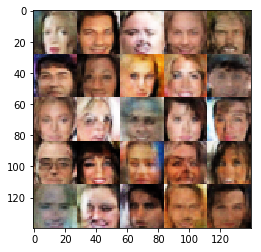

Epoch 3/5... Discriminator Loss: 0.9443... Generator Loss: 0.7250
Epoch 3/5... Discriminator Loss: 0.3810... Generator Loss: 1.8771
Epoch 3/5... Discriminator Loss: 2.0358... Generator Loss: 0.1986
Epoch 3/5... Discriminator Loss: 1.5885... Generator Loss: 0.3422
Epoch 3/5... Discriminator Loss: 1.9794... Generator Loss: 0.1962
Epoch 3/5... Discriminator Loss: 0.3583... Generator Loss: 2.6787
Epoch 3/5... Discriminator Loss: 0.9255... Generator Loss: 1.5309
Epoch 3/5... Discriminator Loss: 0.6619... Generator Loss: 1.3762
Epoch 3/5... Discriminator Loss: 1.2905... Generator Loss: 0.4303
Epoch 3/5... Discriminator Loss: 0.7997... Generator Loss: 0.7999


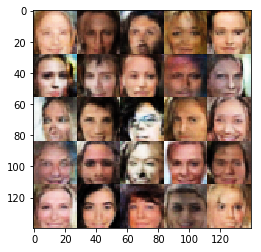

Epoch 3/5... Discriminator Loss: 1.0196... Generator Loss: 0.6046
Epoch 3/5... Discriminator Loss: 0.6069... Generator Loss: 1.1321
Epoch 3/5... Discriminator Loss: 0.8830... Generator Loss: 0.7369
Epoch 3/5... Discriminator Loss: 1.5789... Generator Loss: 0.3312
Epoch 3/5... Discriminator Loss: 0.6547... Generator Loss: 0.9787
Epoch 3/5... Discriminator Loss: 1.8664... Generator Loss: 0.2391
Epoch 3/5... Discriminator Loss: 0.3698... Generator Loss: 1.7168
Epoch 3/5... Discriminator Loss: 0.8681... Generator Loss: 0.7785
Epoch 3/5... Discriminator Loss: 0.5843... Generator Loss: 1.1758
Epoch 3/5... Discriminator Loss: 0.9512... Generator Loss: 0.6965


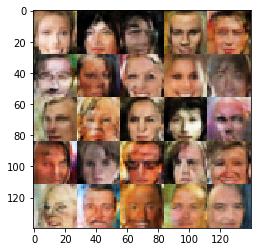

Epoch 3/5... Discriminator Loss: 0.4140... Generator Loss: 1.9192
Epoch 3/5... Discriminator Loss: 1.5796... Generator Loss: 0.3123
Epoch 3/5... Discriminator Loss: 1.6086... Generator Loss: 0.2808
Epoch 3/5... Discriminator Loss: 1.2103... Generator Loss: 0.4823
Epoch 3/5... Discriminator Loss: 0.6878... Generator Loss: 1.0283
Epoch 3/5... Discriminator Loss: 1.3589... Generator Loss: 0.3833
Epoch 3/5... Discriminator Loss: 0.9399... Generator Loss: 0.7160
Epoch 3/5... Discriminator Loss: 0.8643... Generator Loss: 0.8706
Epoch 3/5... Discriminator Loss: 0.8047... Generator Loss: 1.5345
Epoch 3/5... Discriminator Loss: 1.3143... Generator Loss: 0.4653


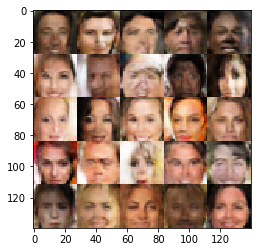

Epoch 3/5... Discriminator Loss: 2.2516... Generator Loss: 0.1577
Epoch 3/5... Discriminator Loss: 1.1419... Generator Loss: 0.4936
Epoch 3/5... Discriminator Loss: 1.7457... Generator Loss: 0.2826
Epoch 3/5... Discriminator Loss: 1.0961... Generator Loss: 0.6202
Epoch 3/5... Discriminator Loss: 1.4535... Generator Loss: 0.3604
Epoch 3/5... Discriminator Loss: 1.5873... Generator Loss: 0.3286
Epoch 3/5... Discriminator Loss: 0.8624... Generator Loss: 0.8973
Epoch 3/5... Discriminator Loss: 0.6125... Generator Loss: 1.0570
Epoch 3/5... Discriminator Loss: 0.2189... Generator Loss: 2.4253
Epoch 3/5... Discriminator Loss: 1.2077... Generator Loss: 0.5001


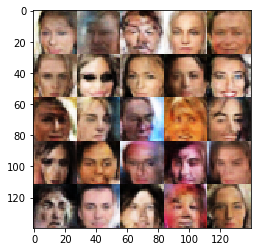

Epoch 3/5... Discriminator Loss: 0.6119... Generator Loss: 1.0202
Epoch 3/5... Discriminator Loss: 1.4257... Generator Loss: 0.4230
Epoch 3/5... Discriminator Loss: 1.6781... Generator Loss: 0.2870
Epoch 3/5... Discriminator Loss: 0.6478... Generator Loss: 1.0281
Epoch 3/5... Discriminator Loss: 1.7413... Generator Loss: 0.3130
Epoch 3/5... Discriminator Loss: 1.3225... Generator Loss: 0.4146
Epoch 3/5... Discriminator Loss: 0.4003... Generator Loss: 1.7464
Epoch 3/5... Discriminator Loss: 0.9243... Generator Loss: 0.7740
Epoch 3/5... Discriminator Loss: 1.6303... Generator Loss: 0.3342
Epoch 3/5... Discriminator Loss: 1.3416... Generator Loss: 0.4326


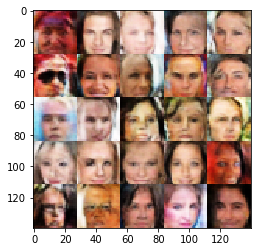

Epoch 3/5... Discriminator Loss: 2.6098... Generator Loss: 3.9228
Epoch 3/5... Discriminator Loss: 0.9404... Generator Loss: 0.8829
Epoch 3/5... Discriminator Loss: 1.4175... Generator Loss: 0.4121
Epoch 3/5... Discriminator Loss: 1.1712... Generator Loss: 0.5310
Epoch 3/5... Discriminator Loss: 2.4799... Generator Loss: 0.1338
Epoch 3/5... Discriminator Loss: 1.7978... Generator Loss: 0.2656
Epoch 3/5... Discriminator Loss: 1.2195... Generator Loss: 0.4550
Epoch 3/5... Discriminator Loss: 1.7649... Generator Loss: 0.2554
Epoch 3/5... Discriminator Loss: 1.3849... Generator Loss: 0.4114
Epoch 3/5... Discriminator Loss: 0.7844... Generator Loss: 0.9094


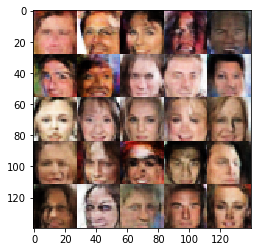

Epoch 3/5... Discriminator Loss: 0.9591... Generator Loss: 0.7281
Epoch 3/5... Discriminator Loss: 0.9104... Generator Loss: 0.7632
Epoch 3/5... Discriminator Loss: 1.4924... Generator Loss: 0.3422
Epoch 3/5... Discriminator Loss: 0.5249... Generator Loss: 1.3291
Epoch 3/5... Discriminator Loss: 0.8564... Generator Loss: 0.6919
Epoch 3/5... Discriminator Loss: 1.2517... Generator Loss: 0.4434
Epoch 3/5... Discriminator Loss: 1.0233... Generator Loss: 0.6338
Epoch 3/5... Discriminator Loss: 0.8015... Generator Loss: 1.5903
Epoch 3/5... Discriminator Loss: 0.7009... Generator Loss: 1.2266
Epoch 3/5... Discriminator Loss: 0.2773... Generator Loss: 2.0878


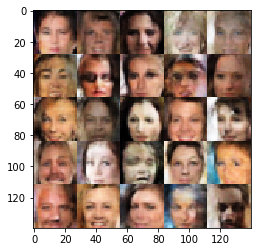

Epoch 3/5... Discriminator Loss: 1.0971... Generator Loss: 0.5725
Epoch 3/5... Discriminator Loss: 1.1348... Generator Loss: 0.5242
Epoch 3/5... Discriminator Loss: 0.8936... Generator Loss: 0.7365
Epoch 3/5... Discriminator Loss: 0.6748... Generator Loss: 1.1744
Epoch 3/5... Discriminator Loss: 1.4296... Generator Loss: 0.4293
Epoch 3/5... Discriminator Loss: 0.8598... Generator Loss: 1.9556
Epoch 3/5... Discriminator Loss: 2.1084... Generator Loss: 0.2965
Epoch 3/5... Discriminator Loss: 0.8793... Generator Loss: 0.9897
Epoch 3/5... Discriminator Loss: 1.4436... Generator Loss: 2.2172
Epoch 3/5... Discriminator Loss: 1.1120... Generator Loss: 1.3179


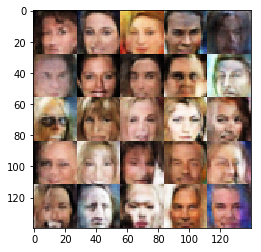

Epoch 3/5... Discriminator Loss: 1.5353... Generator Loss: 0.3876
Epoch 3/5... Discriminator Loss: 2.0937... Generator Loss: 0.2156
Epoch 3/5... Discriminator Loss: 0.9236... Generator Loss: 0.8974
Epoch 3/5... Discriminator Loss: 1.2527... Generator Loss: 0.4491
Epoch 3/5... Discriminator Loss: 1.0280... Generator Loss: 0.7081
Epoch 3/5... Discriminator Loss: 0.9037... Generator Loss: 0.7662
Epoch 3/5... Discriminator Loss: 1.1700... Generator Loss: 0.5885
Epoch 3/5... Discriminator Loss: 1.1940... Generator Loss: 0.5367
Epoch 3/5... Discriminator Loss: 1.1913... Generator Loss: 0.5317
Epoch 3/5... Discriminator Loss: 0.7899... Generator Loss: 0.9775


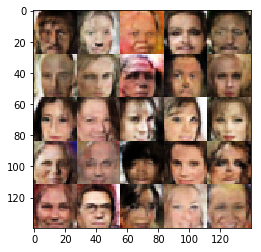

Epoch 3/5... Discriminator Loss: 0.9742... Generator Loss: 0.6326
Epoch 3/5... Discriminator Loss: 0.9328... Generator Loss: 0.7386
Epoch 3/5... Discriminator Loss: 0.8584... Generator Loss: 0.6781
Epoch 3/5... Discriminator Loss: 1.2275... Generator Loss: 0.5058
Epoch 3/5... Discriminator Loss: 1.4991... Generator Loss: 0.3836
Epoch 3/5... Discriminator Loss: 1.4341... Generator Loss: 0.3689
Epoch 3/5... Discriminator Loss: 0.9668... Generator Loss: 0.6989
Epoch 3/5... Discriminator Loss: 1.4976... Generator Loss: 0.3375
Epoch 3/5... Discriminator Loss: 1.0379... Generator Loss: 0.6088
Epoch 3/5... Discriminator Loss: 1.6150... Generator Loss: 0.3130


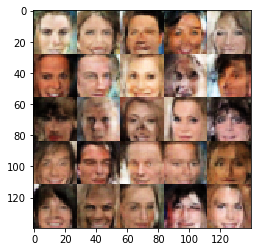

Epoch 3/5... Discriminator Loss: 1.6223... Generator Loss: 0.3763
Epoch 3/5... Discriminator Loss: 1.2202... Generator Loss: 0.5064
Epoch 3/5... Discriminator Loss: 0.8353... Generator Loss: 0.9397
Epoch 3/5... Discriminator Loss: 1.0481... Generator Loss: 0.6187
Epoch 3/5... Discriminator Loss: 1.5004... Generator Loss: 0.3496
Epoch 3/5... Discriminator Loss: 1.7195... Generator Loss: 0.2689
Epoch 3/5... Discriminator Loss: 0.6686... Generator Loss: 1.1394
Epoch 3/5... Discriminator Loss: 1.8963... Generator Loss: 0.2421
Epoch 3/5... Discriminator Loss: 2.6490... Generator Loss: 1.8171
Epoch 3/5... Discriminator Loss: 1.4175... Generator Loss: 1.0634


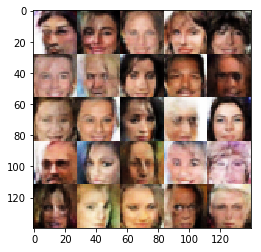

Epoch 3/5... Discriminator Loss: 1.3444... Generator Loss: 0.7731
Epoch 3/5... Discriminator Loss: 1.2220... Generator Loss: 0.6235
Epoch 3/5... Discriminator Loss: 1.1900... Generator Loss: 0.8780
Epoch 3/5... Discriminator Loss: 1.2118... Generator Loss: 0.9054
Epoch 3/5... Discriminator Loss: 1.5116... Generator Loss: 1.9116
Epoch 3/5... Discriminator Loss: 1.0848... Generator Loss: 0.5764
Epoch 3/5... Discriminator Loss: 1.5918... Generator Loss: 0.3423
Epoch 3/5... Discriminator Loss: 1.9097... Generator Loss: 0.2375
Epoch 3/5... Discriminator Loss: 2.2829... Generator Loss: 0.1866
Epoch 3/5... Discriminator Loss: 0.8678... Generator Loss: 0.9920


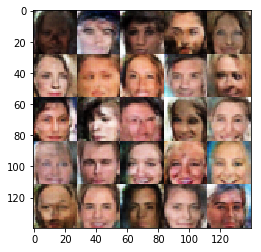

Epoch 3/5... Discriminator Loss: 1.1889... Generator Loss: 0.5046
Epoch 3/5... Discriminator Loss: 0.9512... Generator Loss: 0.9923
Epoch 3/5... Discriminator Loss: 0.8344... Generator Loss: 1.1994
Epoch 3/5... Discriminator Loss: 0.8586... Generator Loss: 1.0385
Epoch 3/5... Discriminator Loss: 1.3915... Generator Loss: 0.4289
Epoch 3/5... Discriminator Loss: 0.9649... Generator Loss: 0.6912
Epoch 3/5... Discriminator Loss: 0.9982... Generator Loss: 0.6454
Epoch 3/5... Discriminator Loss: 1.2060... Generator Loss: 0.5306
Epoch 3/5... Discriminator Loss: 0.9587... Generator Loss: 0.6942
Epoch 3/5... Discriminator Loss: 1.2057... Generator Loss: 0.4692


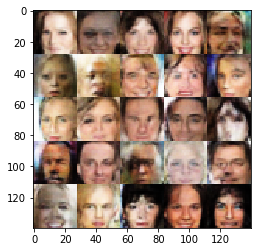

Epoch 3/5... Discriminator Loss: 1.5524... Generator Loss: 0.3379
Epoch 3/5... Discriminator Loss: 1.3181... Generator Loss: 0.4364
Epoch 3/5... Discriminator Loss: 1.0214... Generator Loss: 0.5942
Epoch 3/5... Discriminator Loss: 1.6459... Generator Loss: 0.3175
Epoch 3/5... Discriminator Loss: 1.4183... Generator Loss: 0.4649
Epoch 3/5... Discriminator Loss: 1.4973... Generator Loss: 0.3787
Epoch 3/5... Discriminator Loss: 0.9876... Generator Loss: 0.6026
Epoch 3/5... Discriminator Loss: 1.3437... Generator Loss: 0.4251
Epoch 3/5... Discriminator Loss: 1.1144... Generator Loss: 0.5556
Epoch 3/5... Discriminator Loss: 1.4709... Generator Loss: 0.5322


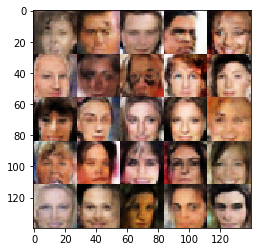

Epoch 3/5... Discriminator Loss: 0.8833... Generator Loss: 1.7284
Epoch 3/5... Discriminator Loss: 1.2387... Generator Loss: 0.4822
Epoch 3/5... Discriminator Loss: 1.2810... Generator Loss: 0.4357
Epoch 3/5... Discriminator Loss: 2.4633... Generator Loss: 0.1244
Epoch 3/5... Discriminator Loss: 2.6936... Generator Loss: 4.9480
Epoch 3/5... Discriminator Loss: 1.0097... Generator Loss: 1.0116
Epoch 3/5... Discriminator Loss: 0.6158... Generator Loss: 1.7664
Epoch 3/5... Discriminator Loss: 1.7316... Generator Loss: 0.3052
Epoch 3/5... Discriminator Loss: 1.1664... Generator Loss: 0.6426
Epoch 3/5... Discriminator Loss: 0.9770... Generator Loss: 0.7419


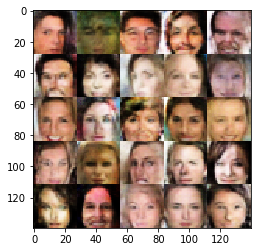

Epoch 3/5... Discriminator Loss: 0.7764... Generator Loss: 1.7376
Epoch 3/5... Discriminator Loss: 0.8318... Generator Loss: 0.9109
Epoch 3/5... Discriminator Loss: 1.2881... Generator Loss: 0.4548
Epoch 3/5... Discriminator Loss: 0.8243... Generator Loss: 0.9198
Epoch 3/5... Discriminator Loss: 0.4366... Generator Loss: 2.0855
Epoch 3/5... Discriminator Loss: 0.7979... Generator Loss: 0.8263
Epoch 3/5... Discriminator Loss: 1.6228... Generator Loss: 0.3787
Epoch 3/5... Discriminator Loss: 0.9138... Generator Loss: 0.7374
Epoch 3/5... Discriminator Loss: 3.0152... Generator Loss: 0.0784
Epoch 3/5... Discriminator Loss: 1.0706... Generator Loss: 0.6279


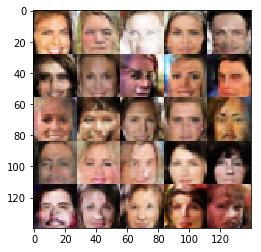

Epoch 3/5... Discriminator Loss: 0.9226... Generator Loss: 0.7883
Epoch 3/5... Discriminator Loss: 1.0310... Generator Loss: 0.6515
Epoch 3/5... Discriminator Loss: 0.6218... Generator Loss: 1.2927
Epoch 3/5... Discriminator Loss: 0.8711... Generator Loss: 0.7944
Epoch 3/5... Discriminator Loss: 1.8335... Generator Loss: 0.2675
Epoch 3/5... Discriminator Loss: 0.8663... Generator Loss: 2.4779
Epoch 3/5... Discriminator Loss: 1.2147... Generator Loss: 0.5148
Epoch 3/5... Discriminator Loss: 1.4158... Generator Loss: 0.4181
Epoch 3/5... Discriminator Loss: 0.6876... Generator Loss: 2.7341
Epoch 3/5... Discriminator Loss: 1.5868... Generator Loss: 0.3342


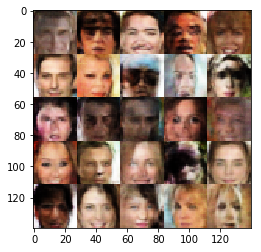

Epoch 3/5... Discriminator Loss: 0.6811... Generator Loss: 0.9851
Epoch 3/5... Discriminator Loss: 1.4519... Generator Loss: 0.4728
Epoch 3/5... Discriminator Loss: 0.8414... Generator Loss: 0.8347
Epoch 3/5... Discriminator Loss: 0.8946... Generator Loss: 0.7541
Epoch 3/5... Discriminator Loss: 1.6787... Generator Loss: 0.3012
Epoch 3/5... Discriminator Loss: 0.8326... Generator Loss: 0.8315
Epoch 3/5... Discriminator Loss: 0.9764... Generator Loss: 0.6768
Epoch 3/5... Discriminator Loss: 0.5303... Generator Loss: 3.0833
Epoch 3/5... Discriminator Loss: 0.6327... Generator Loss: 1.1560
Epoch 3/5... Discriminator Loss: 0.8528... Generator Loss: 0.7895


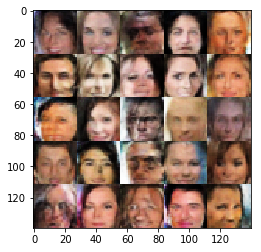

Epoch 3/5... Discriminator Loss: 0.5609... Generator Loss: 1.1635
Epoch 3/5... Discriminator Loss: 0.4876... Generator Loss: 1.2802
Epoch 3/5... Discriminator Loss: 1.2881... Generator Loss: 0.4589
Epoch 3/5... Discriminator Loss: 1.0384... Generator Loss: 0.5947
Epoch 3/5... Discriminator Loss: 1.1333... Generator Loss: 0.5166
Epoch 3/5... Discriminator Loss: 1.5807... Generator Loss: 0.2913
Epoch 3/5... Discriminator Loss: 2.2063... Generator Loss: 0.1639
Epoch 3/5... Discriminator Loss: 0.7601... Generator Loss: 1.5550
Epoch 3/5... Discriminator Loss: 1.8733... Generator Loss: 0.2118
Epoch 3/5... Discriminator Loss: 0.3824... Generator Loss: 1.7134


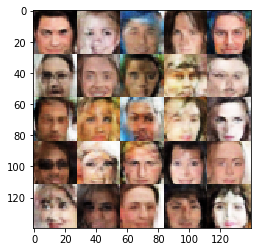

Epoch 3/5... Discriminator Loss: 1.2123... Generator Loss: 0.5157
Epoch 3/5... Discriminator Loss: 2.0328... Generator Loss: 0.2074
Epoch 3/5... Discriminator Loss: 0.6450... Generator Loss: 1.3235
Epoch 3/5... Discriminator Loss: 0.7758... Generator Loss: 0.9380
Epoch 3/5... Discriminator Loss: 1.6569... Generator Loss: 0.2807
Epoch 3/5... Discriminator Loss: 2.8796... Generator Loss: 0.1318
Epoch 3/5... Discriminator Loss: 1.2744... Generator Loss: 0.5334
Epoch 3/5... Discriminator Loss: 1.6443... Generator Loss: 0.3219
Epoch 3/5... Discriminator Loss: 1.3603... Generator Loss: 0.4124
Epoch 3/5... Discriminator Loss: 1.1464... Generator Loss: 0.5226


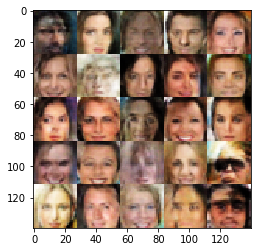

Epoch 3/5... Discriminator Loss: 1.4296... Generator Loss: 0.3818
Epoch 3/5... Discriminator Loss: 1.8760... Generator Loss: 0.2506
Epoch 3/5... Discriminator Loss: 1.0323... Generator Loss: 0.5999
Epoch 3/5... Discriminator Loss: 0.5885... Generator Loss: 1.0668
Epoch 3/5... Discriminator Loss: 1.3069... Generator Loss: 0.3919
Epoch 3/5... Discriminator Loss: 2.5338... Generator Loss: 0.1288
Epoch 3/5... Discriminator Loss: 1.0218... Generator Loss: 0.7067
Epoch 3/5... Discriminator Loss: 1.1897... Generator Loss: 0.5206
Epoch 3/5... Discriminator Loss: 1.4259... Generator Loss: 0.3999
Epoch 3/5... Discriminator Loss: 1.1334... Generator Loss: 0.5365


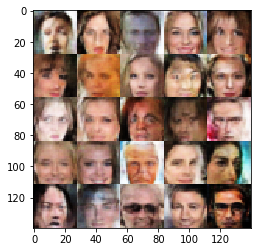

Epoch 3/5... Discriminator Loss: 1.4184... Generator Loss: 0.3960
Epoch 3/5... Discriminator Loss: 1.1962... Generator Loss: 0.5241
Epoch 3/5... Discriminator Loss: 1.5184... Generator Loss: 0.3877
Epoch 3/5... Discriminator Loss: 1.4025... Generator Loss: 0.3995
Epoch 3/5... Discriminator Loss: 1.3611... Generator Loss: 0.4635
Epoch 3/5... Discriminator Loss: 1.2722... Generator Loss: 0.4393
Epoch 3/5... Discriminator Loss: 1.1779... Generator Loss: 0.5656
Epoch 3/5... Discriminator Loss: 1.3286... Generator Loss: 0.4370
Epoch 3/5... Discriminator Loss: 2.2177... Generator Loss: 0.1733
Epoch 3/5... Discriminator Loss: 0.9026... Generator Loss: 0.8126


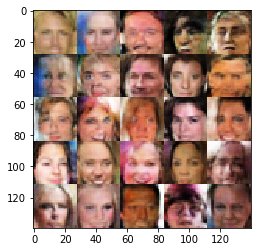

Epoch 3/5... Discriminator Loss: 0.8503... Generator Loss: 0.8450
Epoch 3/5... Discriminator Loss: 0.4727... Generator Loss: 1.7837
Epoch 3/5... Discriminator Loss: 0.7984... Generator Loss: 0.8037
Epoch 3/5... Discriminator Loss: 0.8165... Generator Loss: 0.7835
Epoch 3/5... Discriminator Loss: 1.7621... Generator Loss: 0.2521
Epoch 3/5... Discriminator Loss: 2.1282... Generator Loss: 0.1912
Epoch 3/5... Discriminator Loss: 1.0498... Generator Loss: 1.4671
Epoch 3/5... Discriminator Loss: 0.7628... Generator Loss: 1.2104
Epoch 3/5... Discriminator Loss: 1.0410... Generator Loss: 0.6699
Epoch 3/5... Discriminator Loss: 1.1207... Generator Loss: 0.5893


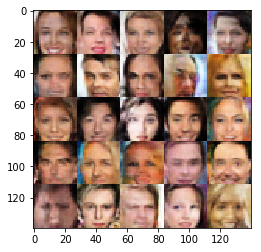

Epoch 3/5... Discriminator Loss: 1.5385... Generator Loss: 0.3305
Epoch 3/5... Discriminator Loss: 1.2885... Generator Loss: 0.4844
Epoch 3/5... Discriminator Loss: 1.8006... Generator Loss: 0.2703
Epoch 3/5... Discriminator Loss: 1.6507... Generator Loss: 0.2718
Epoch 3/5... Discriminator Loss: 1.1160... Generator Loss: 0.5736
Epoch 3/5... Discriminator Loss: 1.9518... Generator Loss: 0.1954
Epoch 3/5... Discriminator Loss: 0.5505... Generator Loss: 1.6750
Epoch 3/5... Discriminator Loss: 2.2095... Generator Loss: 0.1972
Epoch 3/5... Discriminator Loss: 1.8040... Generator Loss: 0.2501
Epoch 3/5... Discriminator Loss: 1.2141... Generator Loss: 0.5239


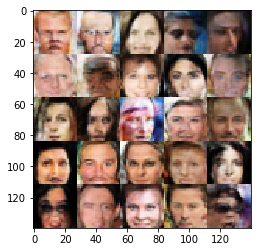

Epoch 3/5... Discriminator Loss: 0.2666... Generator Loss: 2.1038
Epoch 3/5... Discriminator Loss: 0.4694... Generator Loss: 3.6228
Epoch 3/5... Discriminator Loss: 1.1915... Generator Loss: 0.5819
Epoch 3/5... Discriminator Loss: 0.6861... Generator Loss: 0.9550
Epoch 3/5... Discriminator Loss: 0.8132... Generator Loss: 0.8763
Epoch 3/5... Discriminator Loss: 1.3216... Generator Loss: 0.4881
Epoch 3/5... Discriminator Loss: 1.8504... Generator Loss: 0.2534
Epoch 3/5... Discriminator Loss: 1.4709... Generator Loss: 0.3725
Epoch 3/5... Discriminator Loss: 0.7005... Generator Loss: 1.1660
Epoch 3/5... Discriminator Loss: 2.1474... Generator Loss: 0.2404


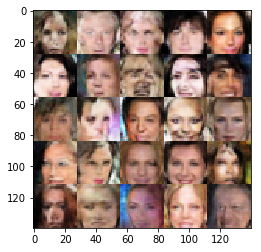

Epoch 3/5... Discriminator Loss: 0.7320... Generator Loss: 1.4186
Epoch 3/5... Discriminator Loss: 1.2290... Generator Loss: 0.5309
Epoch 3/5... Discriminator Loss: 1.4603... Generator Loss: 0.3906
Epoch 3/5... Discriminator Loss: 1.5920... Generator Loss: 0.3265
Epoch 3/5... Discriminator Loss: 0.9202... Generator Loss: 0.7466
Epoch 3/5... Discriminator Loss: 1.0626... Generator Loss: 0.6243
Epoch 3/5... Discriminator Loss: 0.5816... Generator Loss: 1.1620
Epoch 3/5... Discriminator Loss: 0.7280... Generator Loss: 1.2078
Epoch 3/5... Discriminator Loss: 0.2401... Generator Loss: 2.1818
Epoch 3/5... Discriminator Loss: 0.3987... Generator Loss: 1.5944


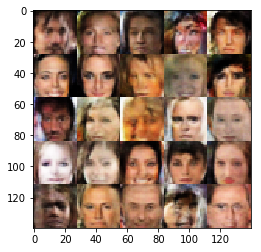

Epoch 3/5... Discriminator Loss: 1.7114... Generator Loss: 3.5509
Epoch 3/5... Discriminator Loss: 0.9717... Generator Loss: 0.8224
Epoch 3/5... Discriminator Loss: 1.9881... Generator Loss: 0.2331
Epoch 3/5... Discriminator Loss: 1.0675... Generator Loss: 0.5646
Epoch 3/5... Discriminator Loss: 1.0386... Generator Loss: 0.6726
Epoch 3/5... Discriminator Loss: 0.6400... Generator Loss: 1.1087
Epoch 3/5... Discriminator Loss: 1.0481... Generator Loss: 0.5502
Epoch 3/5... Discriminator Loss: 0.9593... Generator Loss: 0.6745
Epoch 3/5... Discriminator Loss: 1.0073... Generator Loss: 0.6471
Epoch 3/5... Discriminator Loss: 1.1255... Generator Loss: 0.5624


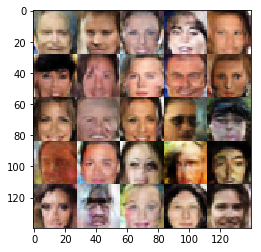

Epoch 3/5... Discriminator Loss: 0.8794... Generator Loss: 0.9395
Epoch 3/5... Discriminator Loss: 1.1452... Generator Loss: 0.5746
Epoch 3/5... Discriminator Loss: 1.9385... Generator Loss: 0.2025
Epoch 3/5... Discriminator Loss: 0.9880... Generator Loss: 0.6566
Epoch 3/5... Discriminator Loss: 2.1175... Generator Loss: 0.1711
Epoch 3/5... Discriminator Loss: 1.1198... Generator Loss: 0.5542
Epoch 3/5... Discriminator Loss: 1.5374... Generator Loss: 0.4172
Epoch 3/5... Discriminator Loss: 1.3287... Generator Loss: 0.4246
Epoch 3/5... Discriminator Loss: 1.5330... Generator Loss: 0.3737
Epoch 3/5... Discriminator Loss: 1.0379... Generator Loss: 0.9334


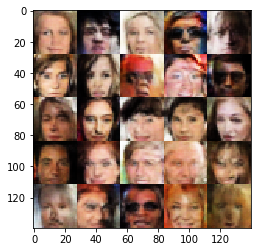

Epoch 3/5... Discriminator Loss: 1.4729... Generator Loss: 0.4621
Epoch 3/5... Discriminator Loss: 1.1660... Generator Loss: 0.6145
Epoch 3/5... Discriminator Loss: 1.9651... Generator Loss: 0.2421
Epoch 3/5... Discriminator Loss: 1.3560... Generator Loss: 0.4803
Epoch 3/5... Discriminator Loss: 1.2879... Generator Loss: 0.4678
Epoch 3/5... Discriminator Loss: 1.7013... Generator Loss: 0.2702
Epoch 3/5... Discriminator Loss: 1.4946... Generator Loss: 0.3630
Epoch 3/5... Discriminator Loss: 1.4572... Generator Loss: 0.4136
Epoch 3/5... Discriminator Loss: 1.1565... Generator Loss: 0.5289
Epoch 3/5... Discriminator Loss: 1.0052... Generator Loss: 0.6641


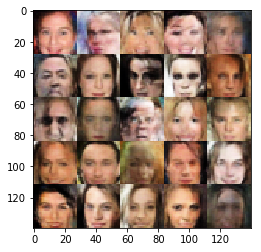

Epoch 3/5... Discriminator Loss: 1.6702... Generator Loss: 0.3087
Epoch 3/5... Discriminator Loss: 2.1655... Generator Loss: 0.1950
Epoch 3/5... Discriminator Loss: 0.9343... Generator Loss: 1.0409
Epoch 3/5... Discriminator Loss: 1.0469... Generator Loss: 0.6382
Epoch 3/5... Discriminator Loss: 1.8930... Generator Loss: 0.3161
Epoch 3/5... Discriminator Loss: 1.1981... Generator Loss: 0.5599
Epoch 3/5... Discriminator Loss: 1.5324... Generator Loss: 0.3531
Epoch 3/5... Discriminator Loss: 0.8519... Generator Loss: 0.8112
Epoch 3/5... Discriminator Loss: 1.1544... Generator Loss: 0.5449
Epoch 3/5... Discriminator Loss: 1.8292... Generator Loss: 0.2398


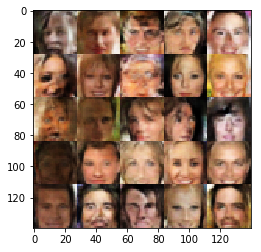

Epoch 3/5... Discriminator Loss: 1.5295... Generator Loss: 0.3515
Epoch 3/5... Discriminator Loss: 1.7100... Generator Loss: 0.2582
Epoch 3/5... Discriminator Loss: 1.1051... Generator Loss: 0.5661
Epoch 3/5... Discriminator Loss: 1.3208... Generator Loss: 0.4526
Epoch 3/5... Discriminator Loss: 1.0144... Generator Loss: 0.5568
Epoch 3/5... Discriminator Loss: 2.3336... Generator Loss: 0.2082
Epoch 3/5... Discriminator Loss: 1.2006... Generator Loss: 1.5893
Epoch 3/5... Discriminator Loss: 0.8518... Generator Loss: 0.8044
Epoch 3/5... Discriminator Loss: 1.8035... Generator Loss: 0.2648
Epoch 3/5... Discriminator Loss: 0.9315... Generator Loss: 0.7665


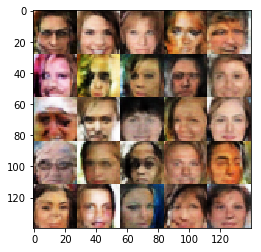

Epoch 3/5... Discriminator Loss: 1.4596... Generator Loss: 0.4496
Epoch 3/5... Discriminator Loss: 2.3430... Generator Loss: 0.1777
Epoch 3/5... Discriminator Loss: 1.3454... Generator Loss: 0.4419
Epoch 3/5... Discriminator Loss: 0.8899... Generator Loss: 0.8402
Epoch 3/5... Discriminator Loss: 0.6731... Generator Loss: 1.1793
Epoch 3/5... Discriminator Loss: 1.1967... Generator Loss: 0.4900
Epoch 4/5... Discriminator Loss: 0.6083... Generator Loss: 1.1495
Epoch 4/5... Discriminator Loss: 0.9911... Generator Loss: 0.7136
Epoch 4/5... Discriminator Loss: 0.5628... Generator Loss: 1.3550
Epoch 4/5... Discriminator Loss: 0.8677... Generator Loss: 0.8461


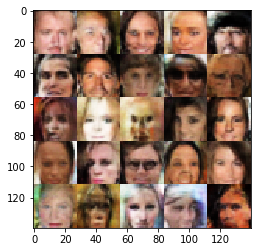

Epoch 4/5... Discriminator Loss: 0.8816... Generator Loss: 0.8079
Epoch 4/5... Discriminator Loss: 1.2700... Generator Loss: 0.4382
Epoch 4/5... Discriminator Loss: 0.9527... Generator Loss: 0.7238
Epoch 4/5... Discriminator Loss: 1.9727... Generator Loss: 0.2224
Epoch 4/5... Discriminator Loss: 1.5589... Generator Loss: 0.3572
Epoch 4/5... Discriminator Loss: 1.3423... Generator Loss: 0.4471
Epoch 4/5... Discriminator Loss: 2.2049... Generator Loss: 0.1990
Epoch 4/5... Discriminator Loss: 1.6948... Generator Loss: 0.3256
Epoch 4/5... Discriminator Loss: 1.0574... Generator Loss: 0.6086
Epoch 4/5... Discriminator Loss: 0.8628... Generator Loss: 0.7997


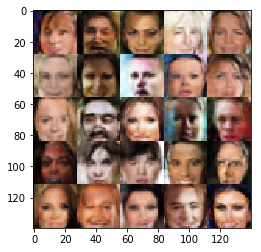

Epoch 4/5... Discriminator Loss: 0.5155... Generator Loss: 1.6210
Epoch 4/5... Discriminator Loss: 1.1477... Generator Loss: 0.5865
Epoch 4/5... Discriminator Loss: 1.8434... Generator Loss: 0.2299
Epoch 4/5... Discriminator Loss: 1.7662... Generator Loss: 0.2984
Epoch 4/5... Discriminator Loss: 1.4616... Generator Loss: 0.4295
Epoch 4/5... Discriminator Loss: 2.1613... Generator Loss: 0.2259
Epoch 4/5... Discriminator Loss: 1.7536... Generator Loss: 0.2604
Epoch 4/5... Discriminator Loss: 0.9639... Generator Loss: 0.7177
Epoch 4/5... Discriminator Loss: 1.0697... Generator Loss: 0.5689
Epoch 4/5... Discriminator Loss: 1.0347... Generator Loss: 0.6945


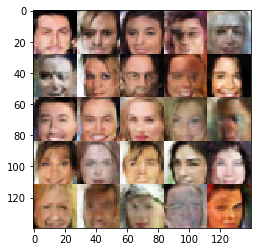

Epoch 4/5... Discriminator Loss: 1.2776... Generator Loss: 0.5600
Epoch 4/5... Discriminator Loss: 1.4973... Generator Loss: 0.3568
Epoch 4/5... Discriminator Loss: 0.8386... Generator Loss: 0.8949
Epoch 4/5... Discriminator Loss: 1.2556... Generator Loss: 0.4406
Epoch 4/5... Discriminator Loss: 1.9801... Generator Loss: 0.2247
Epoch 4/5... Discriminator Loss: 1.4175... Generator Loss: 0.4204
Epoch 4/5... Discriminator Loss: 1.7986... Generator Loss: 0.3002
Epoch 4/5... Discriminator Loss: 2.2911... Generator Loss: 0.1783
Epoch 4/5... Discriminator Loss: 1.6566... Generator Loss: 0.3489
Epoch 4/5... Discriminator Loss: 0.7343... Generator Loss: 1.0411


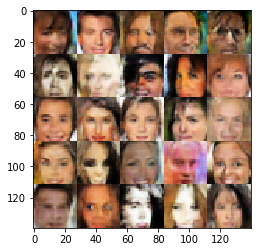

Epoch 4/5... Discriminator Loss: 1.9812... Generator Loss: 0.2657
Epoch 4/5... Discriminator Loss: 2.4517... Generator Loss: 0.1462
Epoch 4/5... Discriminator Loss: 1.9943... Generator Loss: 0.2282
Epoch 4/5... Discriminator Loss: 0.6446... Generator Loss: 1.3748
Epoch 4/5... Discriminator Loss: 1.6206... Generator Loss: 0.3522
Epoch 4/5... Discriminator Loss: 0.6152... Generator Loss: 1.1540
Epoch 4/5... Discriminator Loss: 0.3840... Generator Loss: 1.6650
Epoch 4/5... Discriminator Loss: 2.0280... Generator Loss: 0.2927
Epoch 4/5... Discriminator Loss: 2.2291... Generator Loss: 0.1929
Epoch 4/5... Discriminator Loss: 2.7383... Generator Loss: 0.1073


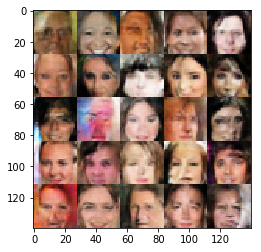

Epoch 4/5... Discriminator Loss: 1.2753... Generator Loss: 0.5403
Epoch 4/5... Discriminator Loss: 0.8013... Generator Loss: 1.0289
Epoch 4/5... Discriminator Loss: 1.6006... Generator Loss: 0.3791
Epoch 4/5... Discriminator Loss: 2.0259... Generator Loss: 0.2441
Epoch 4/5... Discriminator Loss: 2.6411... Generator Loss: 0.1076
Epoch 4/5... Discriminator Loss: 1.2870... Generator Loss: 0.5342
Epoch 4/5... Discriminator Loss: 1.5910... Generator Loss: 0.3152
Epoch 4/5... Discriminator Loss: 1.1157... Generator Loss: 1.0391
Epoch 4/5... Discriminator Loss: 1.1359... Generator Loss: 0.6435
Epoch 4/5... Discriminator Loss: 0.7246... Generator Loss: 1.0556


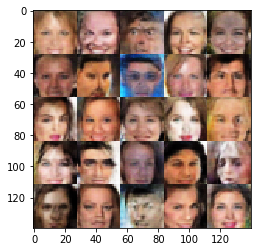

Epoch 4/5... Discriminator Loss: 1.2599... Generator Loss: 0.4936
Epoch 4/5... Discriminator Loss: 1.3526... Generator Loss: 0.4967
Epoch 4/5... Discriminator Loss: 2.1954... Generator Loss: 0.1907
Epoch 4/5... Discriminator Loss: 1.3660... Generator Loss: 0.4080
Epoch 4/5... Discriminator Loss: 0.9581... Generator Loss: 0.7112
Epoch 4/5... Discriminator Loss: 1.5173... Generator Loss: 0.3675
Epoch 4/5... Discriminator Loss: 1.4933... Generator Loss: 0.4054
Epoch 4/5... Discriminator Loss: 0.4967... Generator Loss: 1.2954
Epoch 4/5... Discriminator Loss: 1.2759... Generator Loss: 0.4899
Epoch 4/5... Discriminator Loss: 1.2091... Generator Loss: 0.5950


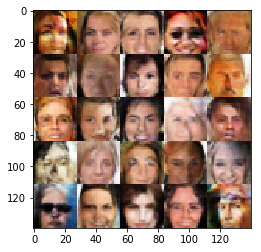

Epoch 4/5... Discriminator Loss: 0.9577... Generator Loss: 0.6875
Epoch 4/5... Discriminator Loss: 0.3924... Generator Loss: 1.5929
Epoch 4/5... Discriminator Loss: 1.5207... Generator Loss: 0.3502
Epoch 4/5... Discriminator Loss: 0.6729... Generator Loss: 1.6141
Epoch 4/5... Discriminator Loss: 0.7124... Generator Loss: 1.0621
Epoch 4/5... Discriminator Loss: 1.3449... Generator Loss: 0.5582
Epoch 4/5... Discriminator Loss: 0.3679... Generator Loss: 3.2317
Epoch 4/5... Discriminator Loss: 2.2378... Generator Loss: 0.2766
Epoch 4/5... Discriminator Loss: 0.4635... Generator Loss: 1.3529
Epoch 4/5... Discriminator Loss: 1.3042... Generator Loss: 0.4401


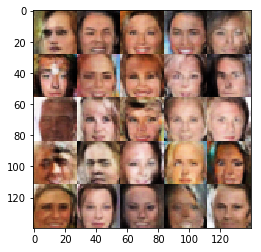

Epoch 4/5... Discriminator Loss: 0.6197... Generator Loss: 1.2237
Epoch 4/5... Discriminator Loss: 0.9755... Generator Loss: 0.7546
Epoch 4/5... Discriminator Loss: 0.8622... Generator Loss: 0.7672
Epoch 4/5... Discriminator Loss: 1.9865... Generator Loss: 0.2125
Epoch 4/5... Discriminator Loss: 3.1123... Generator Loss: 2.7258
Epoch 4/5... Discriminator Loss: 0.9505... Generator Loss: 1.2189
Epoch 4/5... Discriminator Loss: 1.2186... Generator Loss: 0.5417
Epoch 4/5... Discriminator Loss: 2.6528... Generator Loss: 0.1954
Epoch 4/5... Discriminator Loss: 1.2304... Generator Loss: 0.6205
Epoch 4/5... Discriminator Loss: 1.6801... Generator Loss: 0.3639


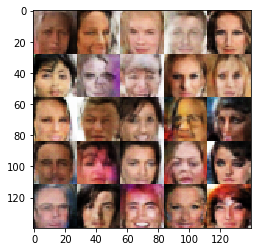

Epoch 4/5... Discriminator Loss: 2.1729... Generator Loss: 0.1697
Epoch 4/5... Discriminator Loss: 1.2298... Generator Loss: 0.5271
Epoch 4/5... Discriminator Loss: 2.0343... Generator Loss: 0.2063
Epoch 4/5... Discriminator Loss: 0.6770... Generator Loss: 1.0655
Epoch 4/5... Discriminator Loss: 0.2516... Generator Loss: 2.0608
Epoch 4/5... Discriminator Loss: 0.8499... Generator Loss: 0.8422
Epoch 4/5... Discriminator Loss: 0.8816... Generator Loss: 0.7455
Epoch 4/5... Discriminator Loss: 1.5556... Generator Loss: 0.3558
Epoch 4/5... Discriminator Loss: 1.0736... Generator Loss: 0.5660
Epoch 4/5... Discriminator Loss: 2.0070... Generator Loss: 0.2018


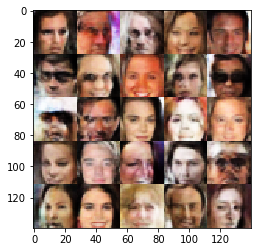

Epoch 4/5... Discriminator Loss: 1.2993... Generator Loss: 0.4442
Epoch 4/5... Discriminator Loss: 1.0918... Generator Loss: 0.5399
Epoch 4/5... Discriminator Loss: 1.1521... Generator Loss: 0.5385
Epoch 4/5... Discriminator Loss: 0.7183... Generator Loss: 0.8898
Epoch 4/5... Discriminator Loss: 1.7811... Generator Loss: 0.2560
Epoch 4/5... Discriminator Loss: 2.1819... Generator Loss: 0.1833
Epoch 4/5... Discriminator Loss: 0.8206... Generator Loss: 0.8941
Epoch 4/5... Discriminator Loss: 1.6329... Generator Loss: 0.3096
Epoch 4/5... Discriminator Loss: 1.3237... Generator Loss: 0.4520
Epoch 4/5... Discriminator Loss: 1.1305... Generator Loss: 0.5755


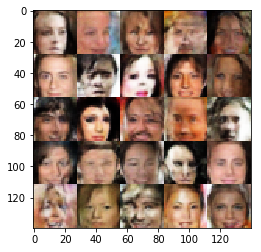

Epoch 4/5... Discriminator Loss: 1.1921... Generator Loss: 0.5350
Epoch 4/5... Discriminator Loss: 1.2624... Generator Loss: 0.5651
Epoch 4/5... Discriminator Loss: 2.0616... Generator Loss: 0.1949
Epoch 4/5... Discriminator Loss: 0.8745... Generator Loss: 0.9708
Epoch 4/5... Discriminator Loss: 0.9420... Generator Loss: 0.8490
Epoch 4/5... Discriminator Loss: 1.3758... Generator Loss: 0.4079
Epoch 4/5... Discriminator Loss: 1.6270... Generator Loss: 0.3501
Epoch 4/5... Discriminator Loss: 1.3721... Generator Loss: 0.3785
Epoch 4/5... Discriminator Loss: 0.9958... Generator Loss: 0.6579
Epoch 4/5... Discriminator Loss: 0.5105... Generator Loss: 1.7908


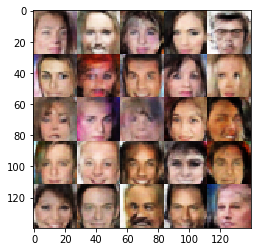

Epoch 4/5... Discriminator Loss: 1.6188... Generator Loss: 0.3310
Epoch 4/5... Discriminator Loss: 2.1005... Generator Loss: 0.2162
Epoch 4/5... Discriminator Loss: 1.4711... Generator Loss: 0.3865
Epoch 4/5... Discriminator Loss: 1.2891... Generator Loss: 0.5642
Epoch 4/5... Discriminator Loss: 1.0785... Generator Loss: 0.6449
Epoch 4/5... Discriminator Loss: 1.7618... Generator Loss: 0.2972
Epoch 4/5... Discriminator Loss: 1.5227... Generator Loss: 0.3355
Epoch 4/5... Discriminator Loss: 1.1371... Generator Loss: 0.5872
Epoch 4/5... Discriminator Loss: 0.6462... Generator Loss: 1.1196
Epoch 4/5... Discriminator Loss: 0.8545... Generator Loss: 0.8198


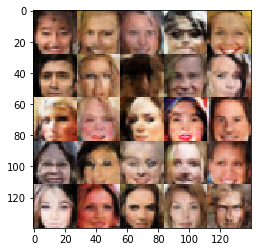

Epoch 4/5... Discriminator Loss: 2.6695... Generator Loss: 0.1230
Epoch 4/5... Discriminator Loss: 1.7780... Generator Loss: 0.3261
Epoch 4/5... Discriminator Loss: 1.6749... Generator Loss: 0.3050
Epoch 4/5... Discriminator Loss: 0.6737... Generator Loss: 1.4291
Epoch 4/5... Discriminator Loss: 0.5073... Generator Loss: 1.2991
Epoch 4/5... Discriminator Loss: 1.0258... Generator Loss: 0.6969
Epoch 4/5... Discriminator Loss: 1.1702... Generator Loss: 0.5549
Epoch 4/5... Discriminator Loss: 2.0762... Generator Loss: 0.1987
Epoch 4/5... Discriminator Loss: 1.6540... Generator Loss: 0.3028
Epoch 4/5... Discriminator Loss: 0.7501... Generator Loss: 0.9760


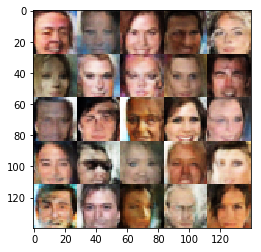

Epoch 4/5... Discriminator Loss: 0.6543... Generator Loss: 1.1317
Epoch 4/5... Discriminator Loss: 1.7237... Generator Loss: 0.2819
Epoch 4/5... Discriminator Loss: 0.2310... Generator Loss: 2.5955
Epoch 4/5... Discriminator Loss: 1.5315... Generator Loss: 0.3446
Epoch 4/5... Discriminator Loss: 0.6952... Generator Loss: 1.0958
Epoch 4/5... Discriminator Loss: 0.5881... Generator Loss: 1.1103
Epoch 4/5... Discriminator Loss: 1.4900... Generator Loss: 0.3552
Epoch 4/5... Discriminator Loss: 1.7136... Generator Loss: 0.3240
Epoch 4/5... Discriminator Loss: 1.0891... Generator Loss: 0.5395
Epoch 4/5... Discriminator Loss: 2.0851... Generator Loss: 0.1949


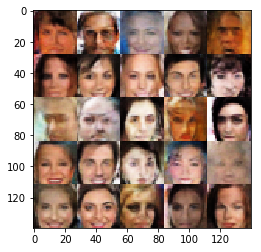

Epoch 4/5... Discriminator Loss: 1.6181... Generator Loss: 0.3452
Epoch 4/5... Discriminator Loss: 1.8337... Generator Loss: 0.2498
Epoch 4/5... Discriminator Loss: 0.6516... Generator Loss: 1.1382
Epoch 4/5... Discriminator Loss: 0.6644... Generator Loss: 1.3370
Epoch 4/5... Discriminator Loss: 2.5549... Generator Loss: 0.1193
Epoch 4/5... Discriminator Loss: 0.9852... Generator Loss: 0.6536
Epoch 4/5... Discriminator Loss: 2.3928... Generator Loss: 0.1519
Epoch 4/5... Discriminator Loss: 0.9553... Generator Loss: 0.6740
Epoch 4/5... Discriminator Loss: 0.8744... Generator Loss: 0.7772
Epoch 4/5... Discriminator Loss: 1.2171... Generator Loss: 0.5214


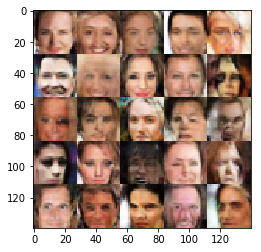

Epoch 4/5... Discriminator Loss: 2.0939... Generator Loss: 0.1894
Epoch 4/5... Discriminator Loss: 1.6330... Generator Loss: 0.3705
Epoch 4/5... Discriminator Loss: 1.8418... Generator Loss: 0.2329
Epoch 4/5... Discriminator Loss: 1.4752... Generator Loss: 0.3620
Epoch 4/5... Discriminator Loss: 2.1337... Generator Loss: 0.2123
Epoch 4/5... Discriminator Loss: 1.6271... Generator Loss: 0.5817
Epoch 4/5... Discriminator Loss: 1.0170... Generator Loss: 0.7941
Epoch 4/5... Discriminator Loss: 0.6378... Generator Loss: 1.2811
Epoch 4/5... Discriminator Loss: 1.3790... Generator Loss: 0.4155
Epoch 4/5... Discriminator Loss: 1.4586... Generator Loss: 0.4375


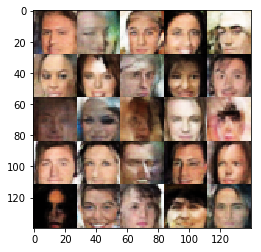

Epoch 4/5... Discriminator Loss: 2.5726... Generator Loss: 0.1354
Epoch 4/5... Discriminator Loss: 1.2758... Generator Loss: 0.4363
Epoch 4/5... Discriminator Loss: 0.9322... Generator Loss: 2.0250
Epoch 4/5... Discriminator Loss: 1.4879... Generator Loss: 0.3873
Epoch 4/5... Discriminator Loss: 1.6733... Generator Loss: 0.3171
Epoch 4/5... Discriminator Loss: 1.1885... Generator Loss: 0.5614
Epoch 4/5... Discriminator Loss: 1.1270... Generator Loss: 0.5930
Epoch 4/5... Discriminator Loss: 0.7201... Generator Loss: 0.9703
Epoch 4/5... Discriminator Loss: 1.1568... Generator Loss: 0.5694
Epoch 4/5... Discriminator Loss: 2.3571... Generator Loss: 0.1493


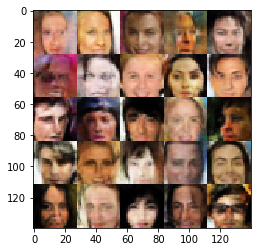

Epoch 4/5... Discriminator Loss: 2.1536... Generator Loss: 0.2005
Epoch 4/5... Discriminator Loss: 2.4450... Generator Loss: 0.1338
Epoch 4/5... Discriminator Loss: 1.3310... Generator Loss: 0.5000
Epoch 4/5... Discriminator Loss: 1.0462... Generator Loss: 0.6562
Epoch 4/5... Discriminator Loss: 0.9857... Generator Loss: 0.6806
Epoch 4/5... Discriminator Loss: 0.5263... Generator Loss: 1.3315
Epoch 4/5... Discriminator Loss: 1.0767... Generator Loss: 0.6515
Epoch 4/5... Discriminator Loss: 0.8435... Generator Loss: 0.9393
Epoch 4/5... Discriminator Loss: 0.9587... Generator Loss: 0.7898
Epoch 4/5... Discriminator Loss: 1.2833... Generator Loss: 0.4721


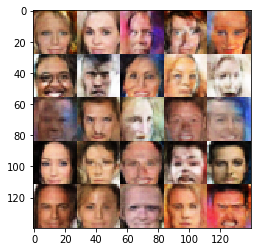

Epoch 4/5... Discriminator Loss: 2.1825... Generator Loss: 0.1840
Epoch 4/5... Discriminator Loss: 1.1674... Generator Loss: 0.5791
Epoch 4/5... Discriminator Loss: 0.9508... Generator Loss: 0.8481
Epoch 4/5... Discriminator Loss: 0.7213... Generator Loss: 1.1749
Epoch 4/5... Discriminator Loss: 2.0028... Generator Loss: 0.3085
Epoch 4/5... Discriminator Loss: 0.9529... Generator Loss: 1.5980
Epoch 4/5... Discriminator Loss: 1.9952... Generator Loss: 0.2086
Epoch 4/5... Discriminator Loss: 1.1686... Generator Loss: 0.6199
Epoch 4/5... Discriminator Loss: 2.2448... Generator Loss: 0.1814
Epoch 4/5... Discriminator Loss: 1.5317... Generator Loss: 0.3962


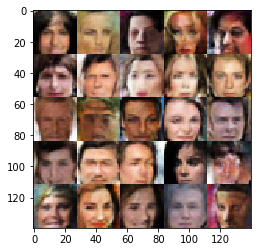

Epoch 4/5... Discriminator Loss: 1.1001... Generator Loss: 0.5990
Epoch 4/5... Discriminator Loss: 1.3316... Generator Loss: 0.4189
Epoch 4/5... Discriminator Loss: 1.9083... Generator Loss: 0.2604
Epoch 4/5... Discriminator Loss: 1.4606... Generator Loss: 0.3969
Epoch 4/5... Discriminator Loss: 0.7462... Generator Loss: 0.9577
Epoch 4/5... Discriminator Loss: 0.1580... Generator Loss: 2.9840
Epoch 4/5... Discriminator Loss: 0.3088... Generator Loss: 2.1236
Epoch 4/5... Discriminator Loss: 1.1422... Generator Loss: 0.5767
Epoch 4/5... Discriminator Loss: 1.1186... Generator Loss: 0.5574
Epoch 4/5... Discriminator Loss: 0.7322... Generator Loss: 0.8923


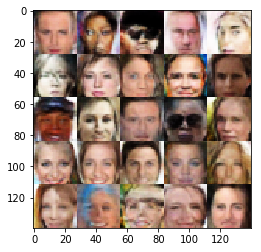

Epoch 4/5... Discriminator Loss: 0.6076... Generator Loss: 1.1005
Epoch 4/5... Discriminator Loss: 2.4869... Generator Loss: 0.1262
Epoch 4/5... Discriminator Loss: 1.6943... Generator Loss: 0.3266
Epoch 4/5... Discriminator Loss: 2.0072... Generator Loss: 0.2026
Epoch 4/5... Discriminator Loss: 1.1368... Generator Loss: 0.5239
Epoch 4/5... Discriminator Loss: 1.2262... Generator Loss: 0.5348
Epoch 4/5... Discriminator Loss: 1.7422... Generator Loss: 0.2755
Epoch 4/5... Discriminator Loss: 1.2325... Generator Loss: 0.5124
Epoch 4/5... Discriminator Loss: 1.5833... Generator Loss: 0.3494
Epoch 4/5... Discriminator Loss: 1.6377... Generator Loss: 0.3530


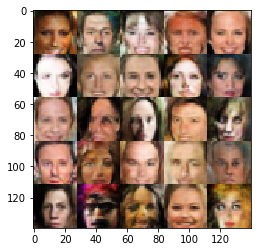

Epoch 4/5... Discriminator Loss: 2.4106... Generator Loss: 0.1823
Epoch 4/5... Discriminator Loss: 1.1828... Generator Loss: 1.2462
Epoch 4/5... Discriminator Loss: 1.3656... Generator Loss: 0.4684
Epoch 4/5... Discriminator Loss: 1.0359... Generator Loss: 1.4507
Epoch 4/5... Discriminator Loss: 1.6152... Generator Loss: 0.3417
Epoch 4/5... Discriminator Loss: 0.8643... Generator Loss: 1.0638
Epoch 4/5... Discriminator Loss: 1.9925... Generator Loss: 0.2298
Epoch 4/5... Discriminator Loss: 1.6928... Generator Loss: 0.3152
Epoch 4/5... Discriminator Loss: 1.3347... Generator Loss: 0.4364
Epoch 4/5... Discriminator Loss: 1.2326... Generator Loss: 0.4764


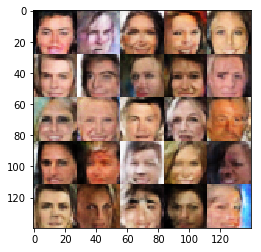

Epoch 4/5... Discriminator Loss: 1.7631... Generator Loss: 0.2755
Epoch 4/5... Discriminator Loss: 0.9593... Generator Loss: 0.7462
Epoch 4/5... Discriminator Loss: 1.2318... Generator Loss: 0.4841
Epoch 4/5... Discriminator Loss: 1.5165... Generator Loss: 0.3886
Epoch 4/5... Discriminator Loss: 1.2225... Generator Loss: 0.6109
Epoch 4/5... Discriminator Loss: 0.7245... Generator Loss: 1.2297
Epoch 4/5... Discriminator Loss: 2.2178... Generator Loss: 0.1731
Epoch 4/5... Discriminator Loss: 0.7979... Generator Loss: 1.1077
Epoch 4/5... Discriminator Loss: 0.5202... Generator Loss: 3.8532
Epoch 4/5... Discriminator Loss: 2.0723... Generator Loss: 0.2206


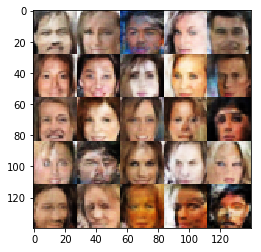

Epoch 4/5... Discriminator Loss: 1.1065... Generator Loss: 0.5209
Epoch 4/5... Discriminator Loss: 1.2550... Generator Loss: 0.4685
Epoch 4/5... Discriminator Loss: 2.6185... Generator Loss: 0.1056
Epoch 4/5... Discriminator Loss: 1.2164... Generator Loss: 0.5724
Epoch 4/5... Discriminator Loss: 2.6298... Generator Loss: 0.1234
Epoch 4/5... Discriminator Loss: 1.5730... Generator Loss: 0.3574
Epoch 4/5... Discriminator Loss: 2.2554... Generator Loss: 0.1882
Epoch 4/5... Discriminator Loss: 1.0192... Generator Loss: 0.6421
Epoch 4/5... Discriminator Loss: 2.4018... Generator Loss: 0.2111
Epoch 4/5... Discriminator Loss: 1.3144... Generator Loss: 0.5388


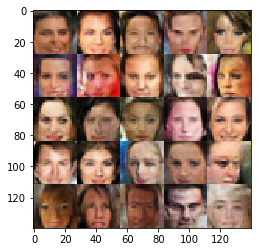

Epoch 4/5... Discriminator Loss: 1.1831... Generator Loss: 0.5781
Epoch 4/5... Discriminator Loss: 0.9837... Generator Loss: 0.8044
Epoch 4/5... Discriminator Loss: 0.4342... Generator Loss: 1.5908
Epoch 4/5... Discriminator Loss: 1.1309... Generator Loss: 0.6262
Epoch 4/5... Discriminator Loss: 2.2302... Generator Loss: 0.2401
Epoch 4/5... Discriminator Loss: 1.7359... Generator Loss: 0.2846
Epoch 4/5... Discriminator Loss: 1.0833... Generator Loss: 0.8024
Epoch 4/5... Discriminator Loss: 0.9746... Generator Loss: 0.9364
Epoch 4/5... Discriminator Loss: 1.4191... Generator Loss: 0.3953
Epoch 4/5... Discriminator Loss: 2.0117... Generator Loss: 0.2008


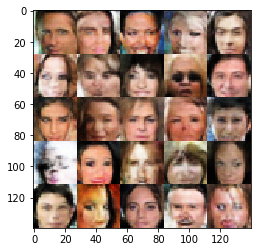

Epoch 4/5... Discriminator Loss: 1.2638... Generator Loss: 0.5382
Epoch 4/5... Discriminator Loss: 1.6758... Generator Loss: 0.3592
Epoch 4/5... Discriminator Loss: 1.8120... Generator Loss: 0.2932
Epoch 4/5... Discriminator Loss: 0.7229... Generator Loss: 1.1447
Epoch 4/5... Discriminator Loss: 0.3564... Generator Loss: 2.2867
Epoch 4/5... Discriminator Loss: 1.7450... Generator Loss: 0.2998
Epoch 4/5... Discriminator Loss: 0.5576... Generator Loss: 2.2449
Epoch 4/5... Discriminator Loss: 1.9638... Generator Loss: 0.2461
Epoch 4/5... Discriminator Loss: 0.4001... Generator Loss: 1.4853
Epoch 4/5... Discriminator Loss: 0.5718... Generator Loss: 1.2033


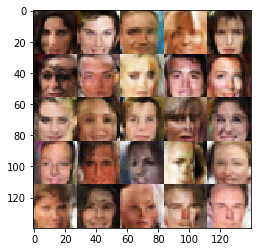

Epoch 4/5... Discriminator Loss: 0.6174... Generator Loss: 1.0888
Epoch 4/5... Discriminator Loss: 0.8551... Generator Loss: 0.8798
Epoch 4/5... Discriminator Loss: 2.2321... Generator Loss: 0.2101
Epoch 4/5... Discriminator Loss: 1.5785... Generator Loss: 0.3133
Epoch 4/5... Discriminator Loss: 1.6288... Generator Loss: 0.3014
Epoch 4/5... Discriminator Loss: 2.2901... Generator Loss: 0.1718
Epoch 4/5... Discriminator Loss: 2.0132... Generator Loss: 0.3768
Epoch 4/5... Discriminator Loss: 1.8982... Generator Loss: 0.3369
Epoch 4/5... Discriminator Loss: 1.3005... Generator Loss: 0.5059
Epoch 4/5... Discriminator Loss: 0.6859... Generator Loss: 1.1249


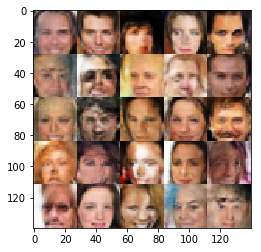

Epoch 4/5... Discriminator Loss: 1.6453... Generator Loss: 0.3094
Epoch 4/5... Discriminator Loss: 1.4940... Generator Loss: 0.3721
Epoch 4/5... Discriminator Loss: 1.1471... Generator Loss: 0.6124
Epoch 4/5... Discriminator Loss: 1.3133... Generator Loss: 0.4793
Epoch 4/5... Discriminator Loss: 1.6678... Generator Loss: 0.2841
Epoch 4/5... Discriminator Loss: 0.9344... Generator Loss: 0.7952
Epoch 4/5... Discriminator Loss: 1.2273... Generator Loss: 0.6506
Epoch 4/5... Discriminator Loss: 1.7501... Generator Loss: 0.2912
Epoch 4/5... Discriminator Loss: 1.1181... Generator Loss: 0.5784
Epoch 4/5... Discriminator Loss: 1.5454... Generator Loss: 0.3880


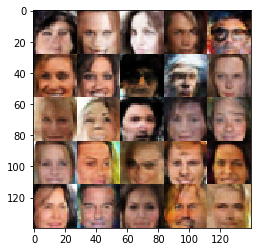

Epoch 4/5... Discriminator Loss: 1.2861... Generator Loss: 0.5215
Epoch 4/5... Discriminator Loss: 1.2469... Generator Loss: 0.5595
Epoch 4/5... Discriminator Loss: 1.5500... Generator Loss: 0.3752
Epoch 4/5... Discriminator Loss: 0.9219... Generator Loss: 0.9709
Epoch 4/5... Discriminator Loss: 1.4098... Generator Loss: 0.5082
Epoch 4/5... Discriminator Loss: 2.1724... Generator Loss: 0.1791
Epoch 4/5... Discriminator Loss: 0.6190... Generator Loss: 1.0720
Epoch 4/5... Discriminator Loss: 1.6250... Generator Loss: 0.3818
Epoch 4/5... Discriminator Loss: 0.5541... Generator Loss: 1.1738
Epoch 4/5... Discriminator Loss: 2.1532... Generator Loss: 0.1879


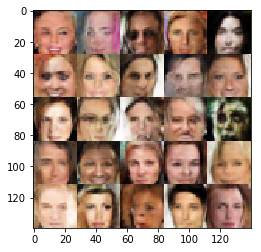

Epoch 4/5... Discriminator Loss: 1.7448... Generator Loss: 0.2960
Epoch 4/5... Discriminator Loss: 1.7043... Generator Loss: 0.3385
Epoch 4/5... Discriminator Loss: 1.3849... Generator Loss: 0.4750
Epoch 4/5... Discriminator Loss: 0.6423... Generator Loss: 1.1025
Epoch 4/5... Discriminator Loss: 1.5120... Generator Loss: 0.3686
Epoch 4/5... Discriminator Loss: 1.1006... Generator Loss: 0.6091
Epoch 4/5... Discriminator Loss: 0.7845... Generator Loss: 1.0150
Epoch 4/5... Discriminator Loss: 1.0932... Generator Loss: 0.5459
Epoch 4/5... Discriminator Loss: 2.2224... Generator Loss: 0.1993
Epoch 4/5... Discriminator Loss: 2.0688... Generator Loss: 0.1861


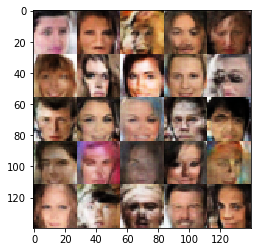

Epoch 4/5... Discriminator Loss: 1.5310... Generator Loss: 0.4110
Epoch 4/5... Discriminator Loss: 1.9980... Generator Loss: 0.2052
Epoch 4/5... Discriminator Loss: 0.7150... Generator Loss: 0.9544
Epoch 4/5... Discriminator Loss: 1.6581... Generator Loss: 0.3411
Epoch 4/5... Discriminator Loss: 2.6099... Generator Loss: 0.1331
Epoch 4/5... Discriminator Loss: 1.0589... Generator Loss: 0.6269
Epoch 4/5... Discriminator Loss: 2.2412... Generator Loss: 0.2053
Epoch 4/5... Discriminator Loss: 0.5458... Generator Loss: 1.2801
Epoch 4/5... Discriminator Loss: 1.1902... Generator Loss: 0.7198
Epoch 4/5... Discriminator Loss: 2.7921... Generator Loss: 0.2009


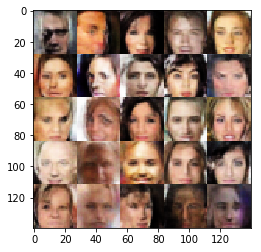

Epoch 4/5... Discriminator Loss: 1.2458... Generator Loss: 0.4852
Epoch 4/5... Discriminator Loss: 1.8741... Generator Loss: 0.2358


In [311]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.